# Initialization

In [1]:
rm(list = ls())

library(data.table)
library(tidyverse)
library(rJava)
library(RNetLogo)

library(lhs)  # For maximin Latin hypercube sampling
library(ggplot2)
library(plotly)  # For beautiful plotting
library(caret)
library(randomForest)
library(factoextra)
library(e1071)
library(TSrepr)  # for evaluating predictive power

require(gridExtra)

options(warn = -1)

-- Attaching packages --------------------------------------- tidyverse 1.2.1 --
v ggplot2 3.2.1     v purrr   0.3.3
v tibble  2.1.3     v dplyr   0.8.3
v tidyr   1.0.0     v stringr 1.4.0
v readr   1.3.1     v forcats 0.4.0
-- Conflicts ------------------------------------------ tidyverse_conflicts() --
x dplyr::between()   masks data.table::between()
x dplyr::filter()    masks stats::filter()
x dplyr::first()     masks data.table::first()
x purrr::flatten()   masks jsonlite::flatten()
x dplyr::lag()       masks stats::lag()
x dplyr::last()      masks data.table::last()
x purrr::transpose() masks data.table::transpose()
Loading required package: igraph

Attaching package: 'igraph'

The following objects are masked from 'package:dplyr':

    as_data_frame, groups, union

The following objects are masked from 'package:purrr':

    compose, simplify

The following object is masked from 'package:tidyr':

    crossing

The following object is masked from 'package:tibble':

    as_data_fram

In [2]:
folder.path = "C:/Users/paslanpatir/Desktop/TEZ_v2/"
data.path = paste0(folder.path,"data/")

nl.model.1 = "Segregation"
model.type.1 = ifelse(nl.model.1 == "Segregation", "basic", "dummy")
output.folder.1 = paste0("outputs/outputs_50_100/outputs_WRep_Basic")
outputs.path.1 = paste0(folder.path,output.folder.1,"/")

nl.model.2 = ifelse(nl.model.1 == "Segregation", "Segregation_Dummy", "Segregation")
model.type.2 = ifelse(model.type.1 == "basic", "dummy", "basic")
output.folder.2 = paste0("outputs/outputs_50_100/outputs_WRep_Dummy")
outputs.path.2 = paste0(folder.path,output.folder.2,"/")

# Unlabeled Pool

In [3]:
unlabeled_ins = 100

In [4]:
unlabeled_pool.name.1= paste0(data.path,"unlabeled_pool","_",model.type.1,"_",unlabeled_ins,".csv")
unlabeled_pool.name.1 <- fread(unlabeled_pool.name.1)  

data_candidates.1 = copy(unlabeled_pool.name.1)

unlabeled_pool.name.2= paste0(data.path,"unlabeled_pool","_",model.type.2,"_",unlabeled_ins,".csv")
unlabeled_pool.name.2 <- fread(unlabeled_pool.name.2)  

data_candidates.2 = copy(unlabeled_pool.name.2)

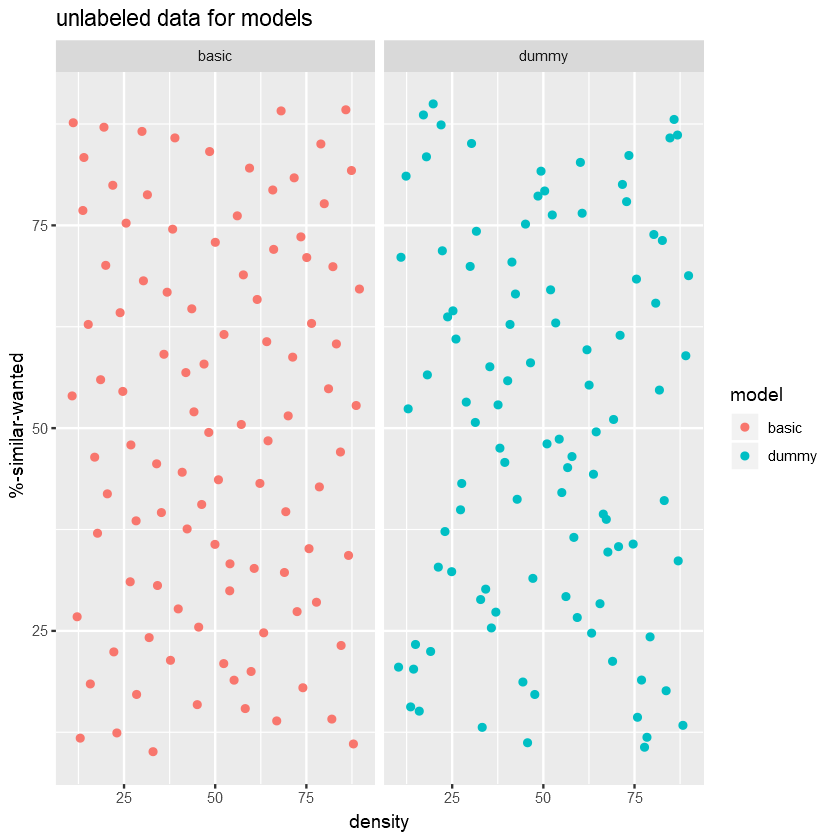

In [5]:
data_candidates_bind = rbind(data.table(data_candidates.1[,.(density,`%-similar-wanted`)], model = model.type.1)
                            ,data.table(data_candidates.2[,.(density,`%-similar-wanted`)], model = model.type.2))
data_candidates_plot = ggplot(data = data_candidates_bind, aes(x = density, y = `%-similar-wanted`)) +
                        geom_point(aes(color = model)) +
                        facet_wrap(~model) +
                        ggtitle(paste0("unlabeled data for models"))
data_candidates_plot
#ggsave(paste0(outputs.path,"unlabeled_", model.type,".png"))

# Test Set

In [6]:
test.seed.1 = c(0,1,2)
test.seed.2 = c(0,2)

test_ins = 100

In [7]:
test_set_all.1 = data.table()
for( i in test.seed.1){
    
    test_set.name.1= paste0(data.path,"test_set","_",model.type.1,"_",test_ins,"_seed",i,".csv")
    test_set.1 <- fread(test_set.name.1) 
    
    test_set_all.1 = rbind(test_set_all.1,data.table(test_set.1, "seed" = i))
    rm(test_set.1,test_set.name.1)    
}
test_set_all.2 = data.table()
for( i in test.seed.2){
    
    test_set.name.2= paste0(data.path,"test_set","_",model.type.2,"_",test_ins,"_seed",i,".csv")
    test_set.2 <- fread(test_set.name.2) 
    
    test_set_all.2 = rbind(test_set_all.2,data.table(test_set.2, "seed" = i))
    rm(test_set.2,test_set.name.2)    
}

In [8]:
test_set.name.1= paste0(data.path,"test_set","_",model.type.1,"_",test_ins,".csv")
test_set.1 <- fread(test_set.name.1)  

test_set.name.2= paste0(data.path,"test_set","_",model.type.2,"_",test_ins,".csv")
test_set.2 <- fread(test_set.name.2)  

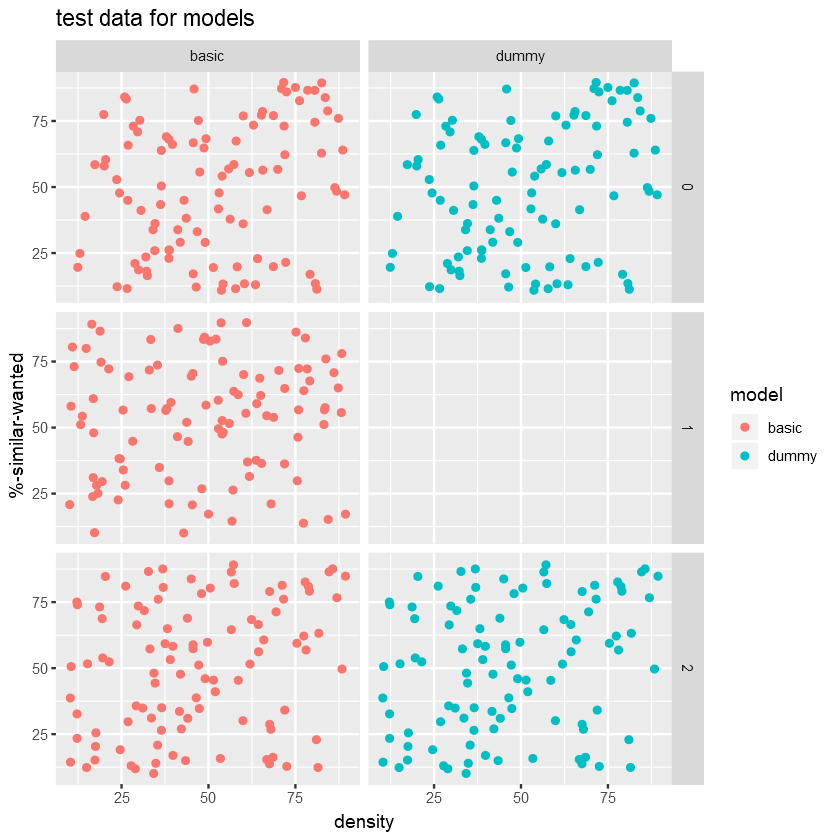

In [9]:
test_set_bind = rbind(data.table(test_set_all.1[,.(density,`%-similar-wanted`,seed)], model = model.type.1)
                     ,data.table(test_set_all.2[,.(density,`%-similar-wanted`,seed)], model = model.type.2))

test_set_plot = ggplot(data = test_set_bind, aes(x = density, y = `%-similar-wanted`)) +
                    geom_point(aes(color = model)) +
                    facet_grid(seed~model) +
                    ggtitle(paste0("test data for models"))
test_set_plot


Aynı seedler için basic'te de dummy'de de iki important feature'ın dağılımı aynı.

# Oneshot Data

In [10]:
seed.oneshot.1 = c(0,1,2,3,4,5,6,7,8,20)
seed.oneshot.2 = c(0,1,2,3,4,5,6,7,8,20)
train_ins_oneshot = 100

In [11]:
training_set_all.1 = data.table()
for( i in seed.oneshot.1){
    
    training_set.name= paste0(data.path,"training_set","_",model.type.1,"_",train_ins_oneshot,"_seed",i,".csv")
    training_set <- fread(training_set.name) 

    training_set_all.1 = rbind(training_set_all.1,data.table(training_set, "seed" = i))
    rm(training_set,training_set.name)    
}

training_set_all.2 = data.table()
for( i in seed.oneshot.2){
    
    training_set.name= paste0(data.path,"training_set","_",model.type.2,"_",train_ins_oneshot,"_seed",i,".csv")
    training_set <- fread(training_set.name) 

    training_set_all.2 = rbind(training_set_all.2,data.table(training_set, "seed" = i))
    rm(training_set,training_set.name)    
}

In [12]:
one_shot_data.1 = copy(training_set_all.1)
one_shot_data.2 = copy(training_set_all.2)

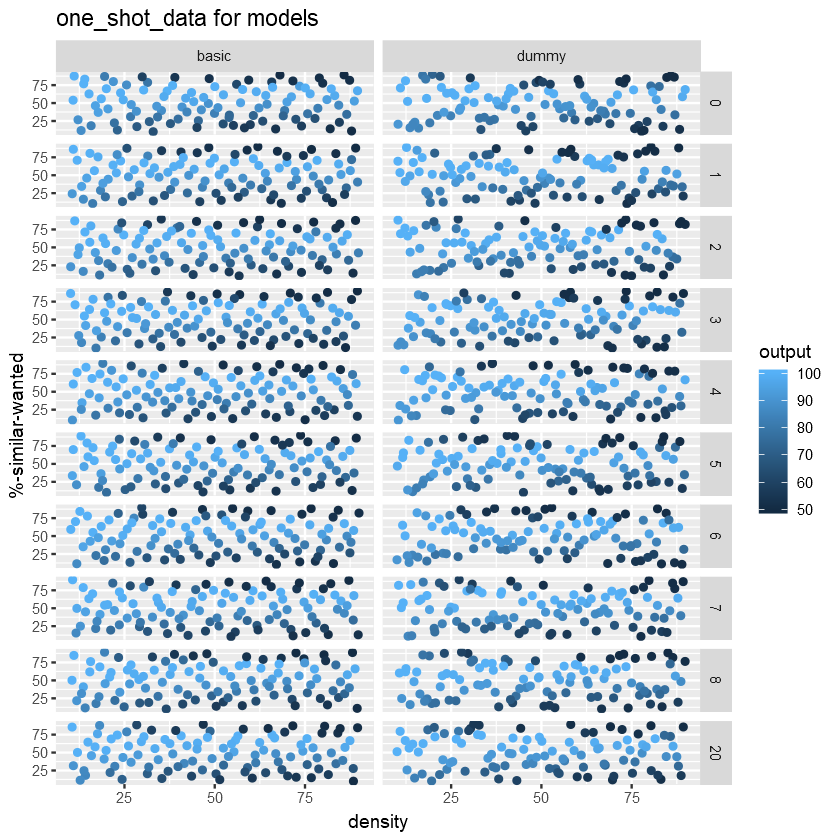

In [13]:
one_shot_bind = rbind(data.table(one_shot_data.1[,.(density,`%-similar-wanted`,seed,output)], model = model.type.1)
                     ,data.table(one_shot_data.2[,.(density,`%-similar-wanted`,seed,output)], model = model.type.2))
one_shot_plot = ggplot(data = one_shot_bind, aes(x = density, y = `%-similar-wanted`)) +
                    geom_point(aes(colour = output)) +
                    facet_grid(seed~model) +
                    labs(legend = "output") +
                    ggtitle(paste0("one_shot_data for models "))
one_shot_plot

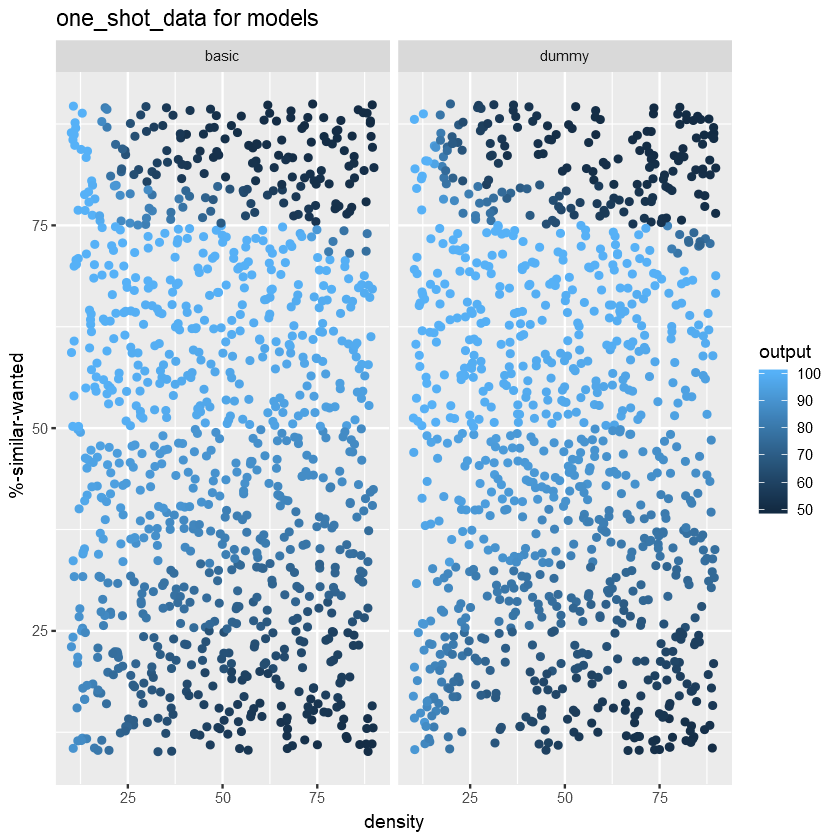

In [14]:
# Eğer üst üste koyarsak, 10 tane seed'in toplamda cover edemediği alanları rahatlıkla görebiliriz.
ggplot(data = one_shot_bind, aes(x = density, y = `%-similar-wanted`)) +
                    geom_point(aes(colour = output)) +
                    facet_grid(~model) +
                    labs(legend = "output") +
                    ggtitle(paste0("one_shot_data for models "))

# Adaptive Initial Data

In [15]:
seed.Ad.1 = c(0,1,2,3,4,5,6,7,8,20)
seed.Ad.2 = c(0,1,2,3,4,5,6,7,8,20)
train_ins_Ad = 50

In [16]:
training_set_Ad_all.1 = data.table()
for (i in seed.Ad.1) {
    
    training_set.name = paste0(data.path, "training_set", "_", model.type.1, "_", train_ins_Ad, "_seed", i, ".csv")
    training_set <- fread(training_set.name)
    
    training_set_Ad_all.1 = rbind(training_set_Ad_all.1, data.table(training_set, seed = i))
    rm(training_set, training_set.name)
}

training_set_Ad_all.2 = data.table()
for (i in seed.Ad.2) {
    
    training_set.name = paste0(data.path, "training_set", "_", model.type.2, "_", train_ins_Ad, "_seed", i, ".csv")
    training_set <- fread(training_set.name)
    
    training_set_Ad_all.2 = rbind(training_set_Ad_all.2, data.table(training_set, seed = i))
    rm(training_set, training_set.name)
}

In [17]:
adaptive_initial_data.1 = copy(training_set_Ad_all.1)
adaptive_initial_data.2 = copy(training_set_Ad_all.2)

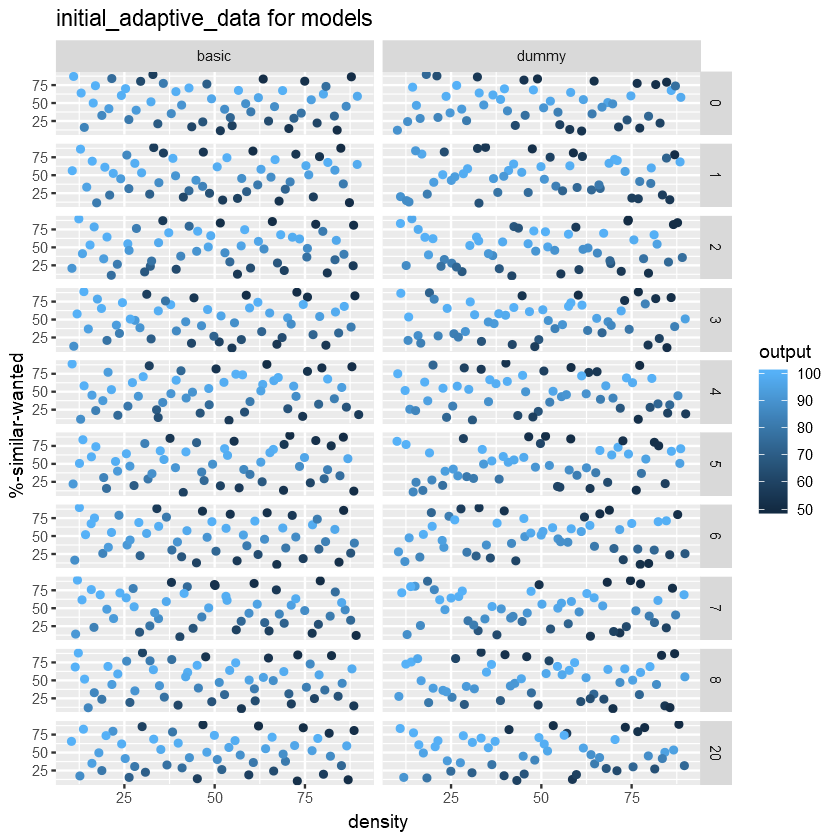

In [18]:
adaptive_initial_bind = rbind(data.table(adaptive_initial_data.1[,.(density,`%-similar-wanted`,seed,output)], model = model.type.1)
                             ,data.table(adaptive_initial_data.2[,.(density,`%-similar-wanted`,seed,output)], model = model.type.2))

adaptive_initial_plot = ggplot(data = adaptive_initial_bind, aes(x = density, y = `%-similar-wanted`)) +
                           geom_point(aes(colour = output)) +
                           facet_grid(seed~model) +
                           labs(legend = "output") +
                           ggtitle(paste0("initial_adaptive_data for models "))
adaptive_initial_plot

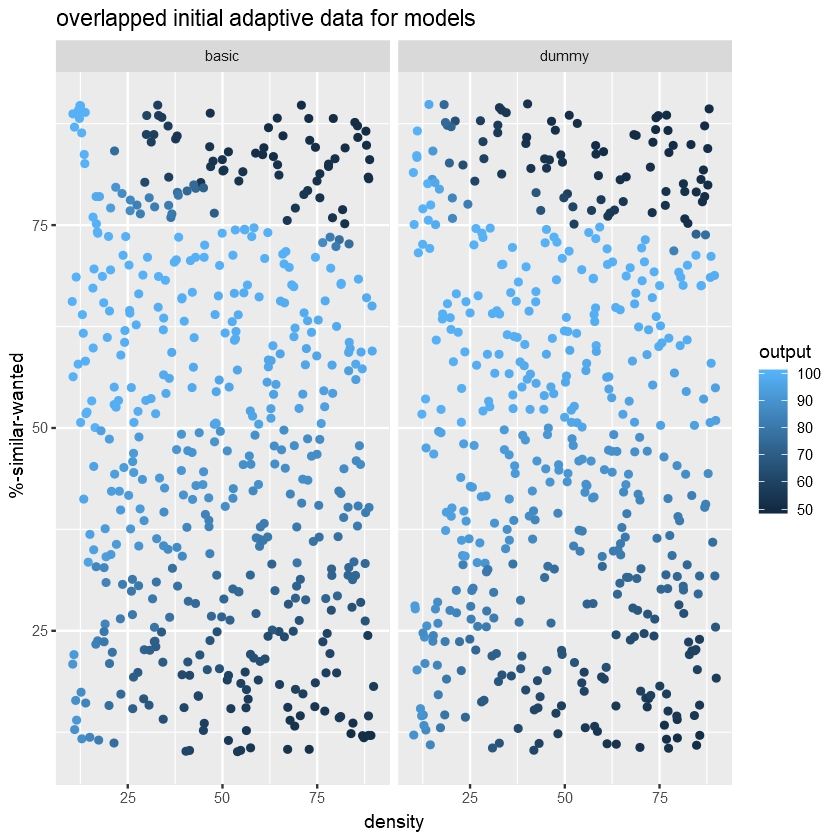

In [19]:
# Eğer üst üste koyarsak, 10 tane seed'in toplamda cover edemediği alanları rahatlıkla görebiliriz.
ggplot(data = adaptive_initial_bind, aes(x = density, y = `%-similar-wanted`)) +
                    geom_point(aes(colour = output)) +
                    facet_grid(~model) +
                    labs(legend = "output") +
                    ggtitle(paste0("overlapped initial adaptive data for models"))

# OneShot

In [20]:
#### OneShot ####

## Model.1

In [21]:
#### Model.1 ####
one_shot_path.1 = paste0(outputs.path.1,"oneshot/")

obb_error_oneshot.1 = fread(paste0(one_shot_path.1,model.type.1,"_obb_error_oneshot_all",".csv"))
performance_table_oneshot.1 = fread(paste0(one_shot_path.1,model.type.1,"_performance_table_oneshot",".csv"))
predictedLabels_oneshot.1 = fread(paste0(one_shot_path.1,model.type.1,"_predictedLabels_oneshot_all",".csv"))

In [22]:
performance_molten_oneshot.1 <- melt(data = performance_table_oneshot.1
                             , id.vars = c('iter',"seed","rep"))
setnames(performance_molten_oneshot.1, c("variable","value"),c("errortype","errorvalue"))

### oob error 

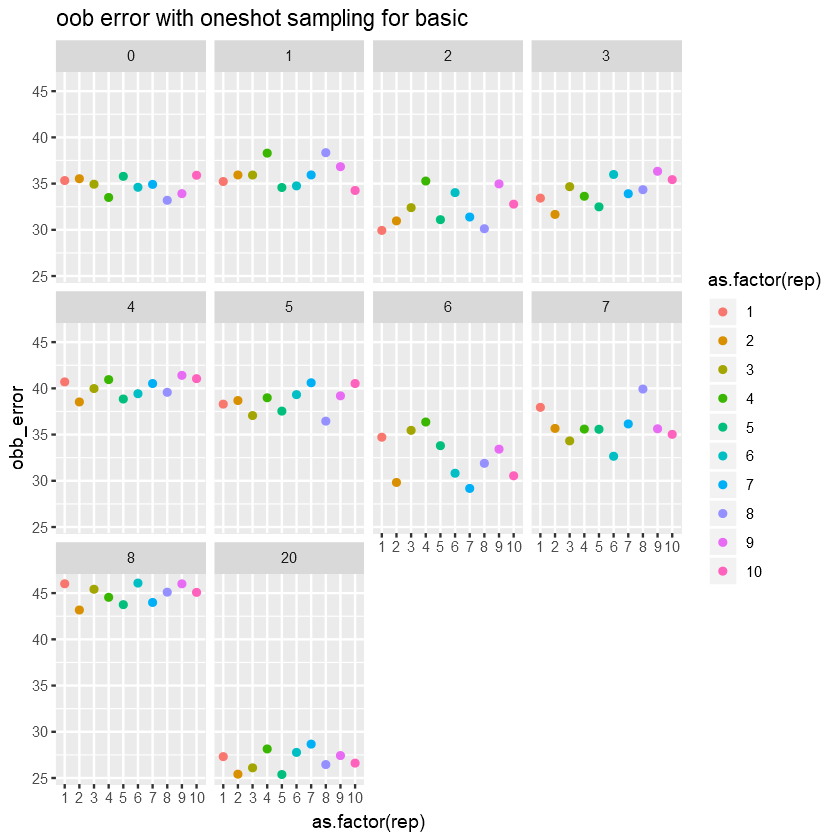

In [23]:
#### oob error ####
oob_oneshot_plot.1 = ggplot(obb_error_oneshot.1, aes(x=as.factor(rep), y = obb_error)) + 
                        geom_point(aes(colour = as.factor(rep))) +
                #geom_hline( aes(yintercept = obb_error, color = obb_error )) + 
                       # facet_grid(rep ~ seed) +
                        facet_wrap(~ seed) +
                        ggtitle(paste0("oob error with oneshot sampling for ",model.type.1)) 
oob_oneshot_plot.1

### test error

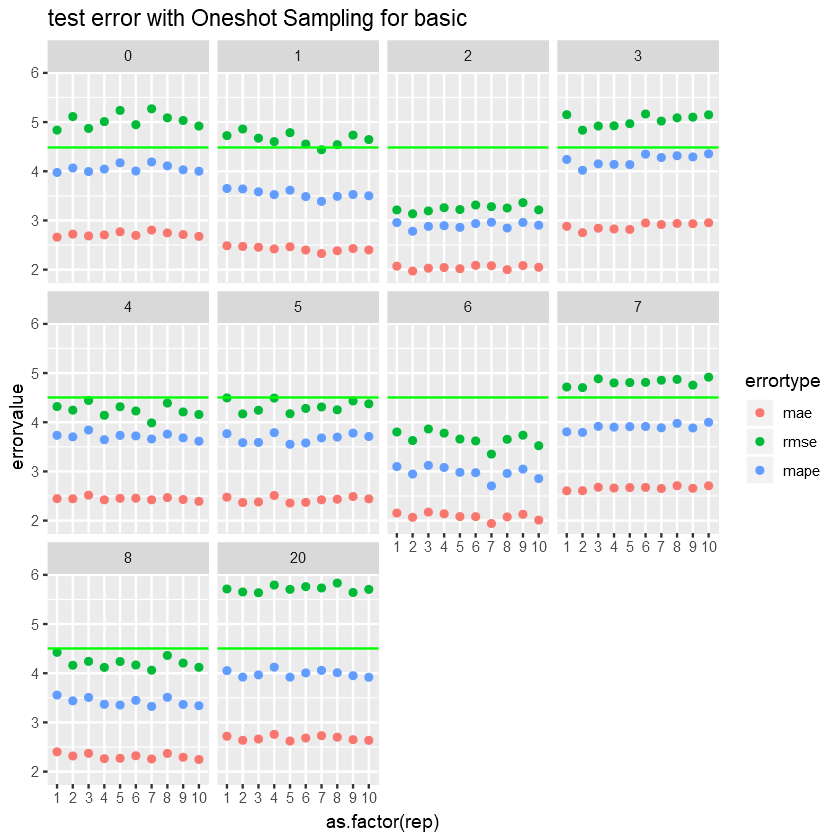

In [24]:
#### test error ####
one_shot_ind_p.1 = ggplot(performance_molten_oneshot.1, aes(x=as.factor(rep),y = errorvalue, group=errortype, col=errortype)) + 
                            geom_point() + 
                            facet_wrap( ~ seed) +
                            geom_hline(yintercept = mean(performance_molten_oneshot.1[errortype=="rmse"]$errorvalue), color = "green") +
                            ggtitle(paste0("test error with Oneshot Sampling for ",model.type.1)) 
one_shot_ind_p.1

4.837571,4.438066,3.135731,4.835735,3.987276,4.170662,3.523408,4.704671,4.062094,5.637496
4.919722,4.554095,3.214487,4.924355,4.158585,4.244346,3.620314,4.755865,4.120985,5.652675
5.022052,4.658782,3.237391,5.054111,4.237988,4.296753,3.655755,4.809582,4.187309,5.709888
5.113175,4.735781,3.281163,5.148211,4.319551,4.433053,3.779071,4.872135,4.242214,5.761358
5.270274,4.859354,3.362931,5.164676,4.443709,4.495001,3.863412,4.917225,4.363053,5.833708
4.925395,4.568005,3.204077,4.942263,4.157563,4.202468,3.576434,4.751489,4.126738,5.655585
5.118709,4.749560,3.270705,5.165958,4.318413,4.391039,3.735076,4.867675,4.247879,5.764191


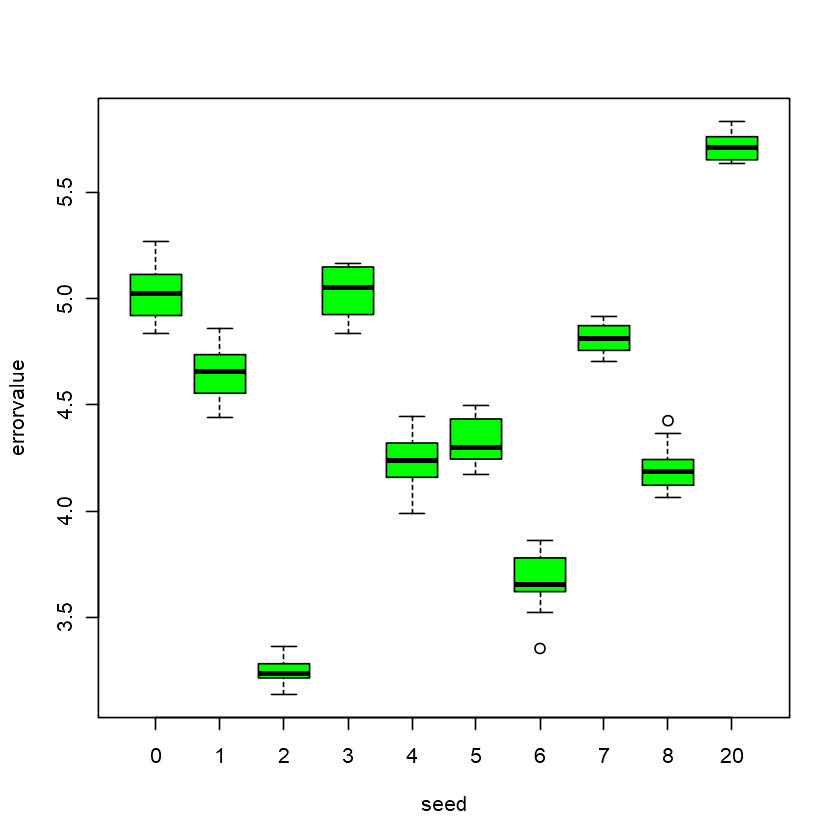

In [25]:
bxp.oneshot.1 <-  boxplot( data = performance_molten_oneshot.1[errortype == "rmse"], errorvalue  ~ seed, col = "green")
bxp.oneshot.1

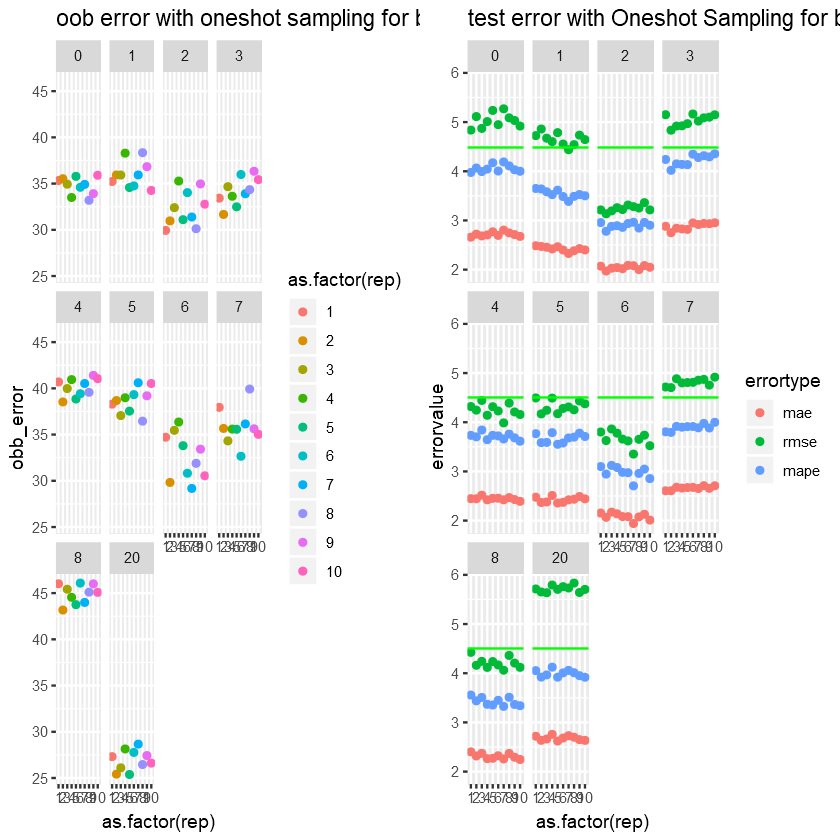

In [26]:
grid.arrange(oob_oneshot_plot.1,one_shot_ind_p.1, ncol = 2)

Seed 20 : train datasını iyi öğrenmiş ama test datasında zayıfsız kalmış
Seed 8 : 20'nin tam tersi
Seed 6 : trainde dalgalanma geniş ama test için iyi denebilir.

### Actual vs Fitted

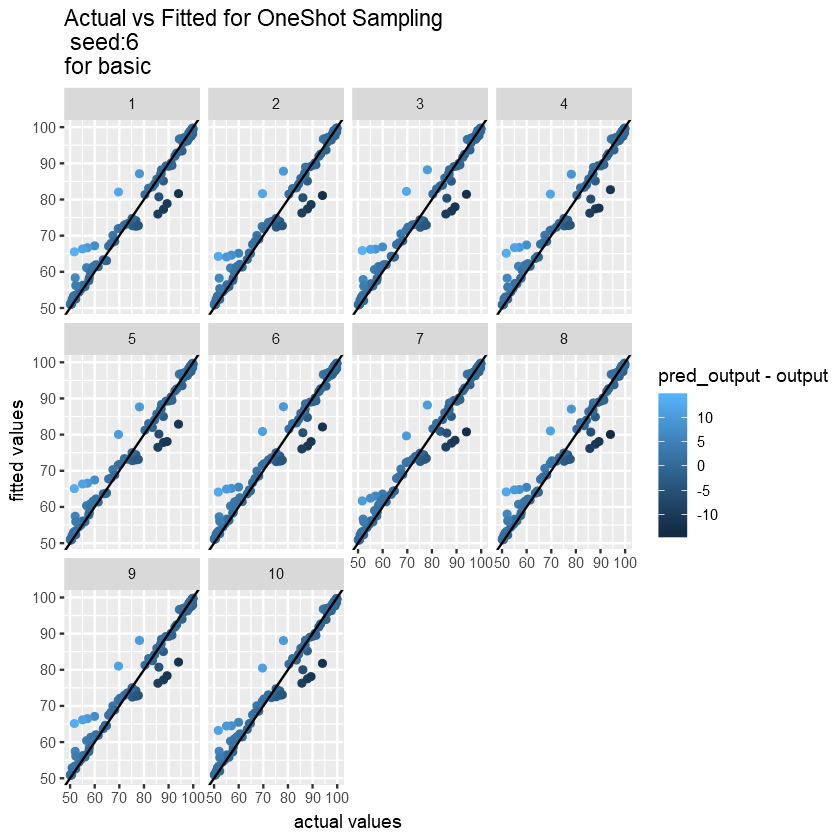

In [27]:
#### Actual vs Fitted ####
slct_seed= 6 
a_vs_f_oneshot.1 <- ggplot(predictedLabels_oneshot.1[seed == slct_seed]
                           ,aes(x = output, y =pred_output, color = pred_output - output)) +
            geom_point() +
            geom_abline() +
            facet_wrap(~ rep) +
            xlab("actual values") +
            ylab("fitted values") +
            ggtitle(paste0("Actual vs Fitted for OneShot Sampling","\n"," seed:",slct_seed,"\n","for ",model.type.1)) 

a_vs_f_oneshot.1

### Replications on Each Seed

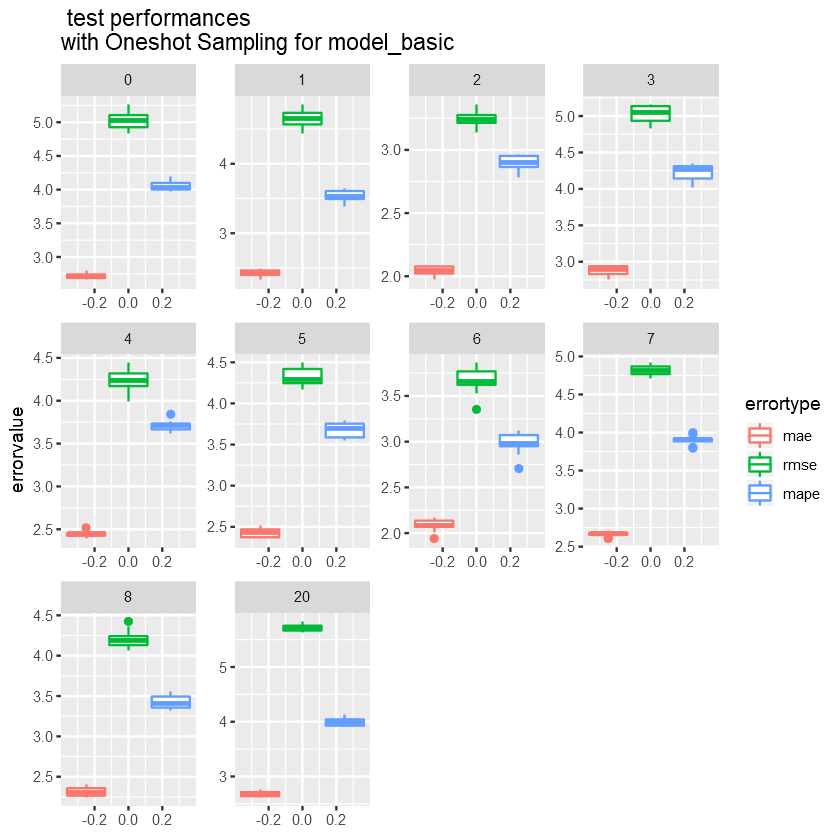

In [28]:
#### Replications on Each Seed ####

one_shot_ind_bxp.1 = ggplot(data = performance_molten_oneshot.1, aes(y = errorvalue, group=errortype, col=errortype)) +
                    geom_boxplot() +
                    facet_wrap(~ seed,scales = "free") +
                    ggtitle(paste0(" test performances","\n","with Oneshot Sampling for model_",model.type.1)) 
one_shot_ind_bxp.1

In [29]:
performance_table_oneshot.1[, .(mean_rmse = mean(rmse)),.(seed)][order(mean_rmse)]

seed,mean_rmse
<int>,<dbl>
2,3.245273
6,3.661898
8,4.210791
4,4.244389
5,4.323117
1,4.656075
7,4.812622
3,5.032114
0,5.032954


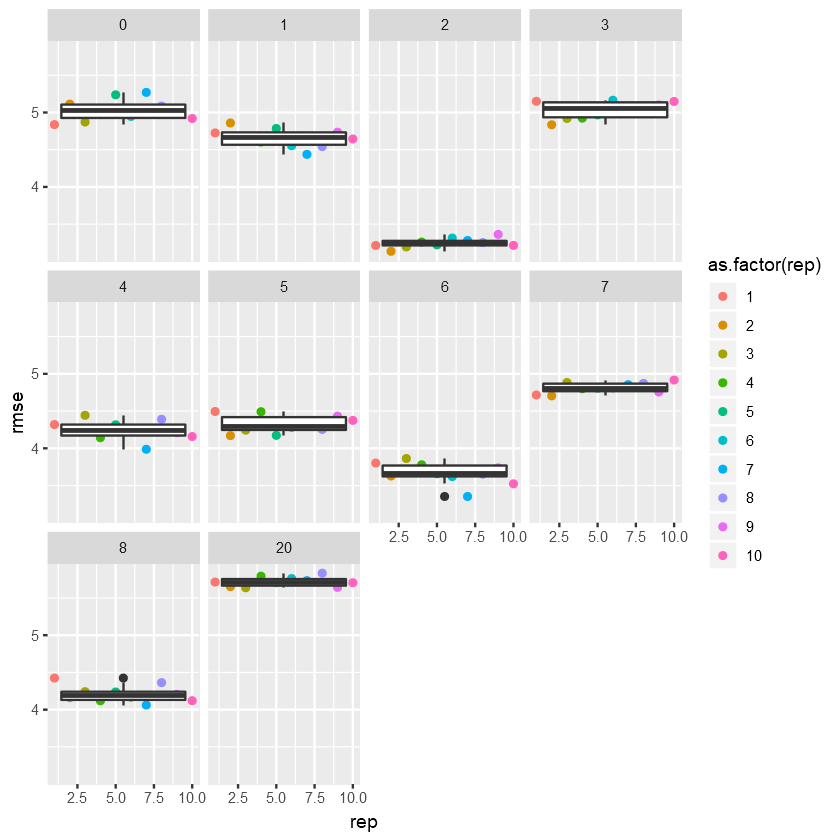

In [30]:
one_shot_ind_pbxp.1 = ggplot(data = performance_table_oneshot.1, aes(y =rmse, x = rep )) +
                    geom_point(aes(colour = as.factor(rep))) +
                    geom_boxplot() +
                    facet_wrap(~ seed) +
                    labs(legend = "rmse") 
one_shot_ind_pbxp.1

### Overall BoxPlot

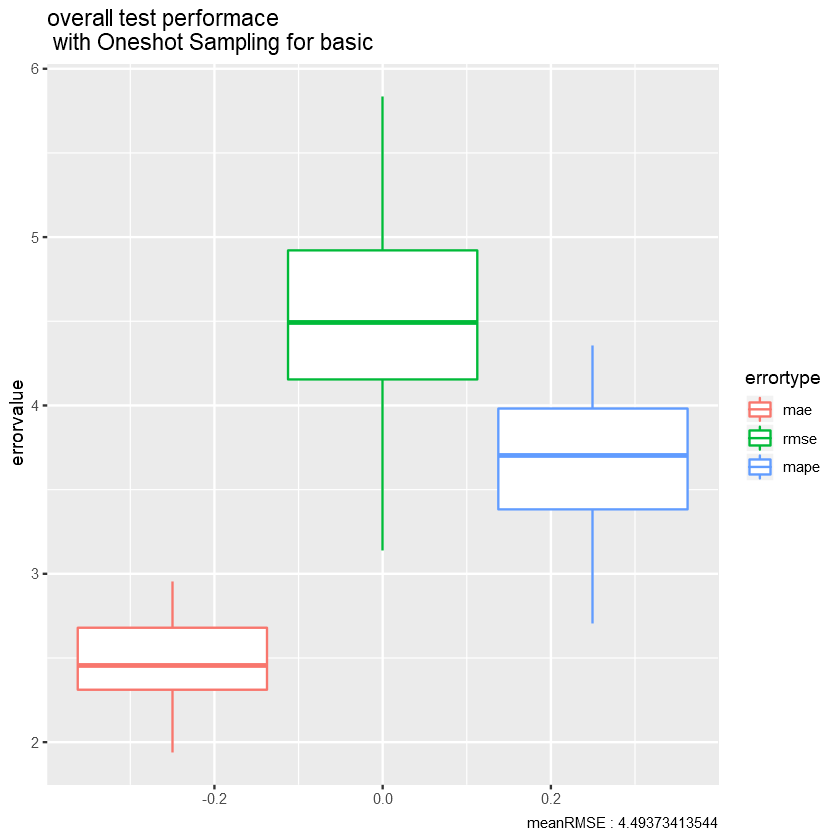

In [31]:
one_shot_bxp.1 = ggplot(data = performance_molten_oneshot.1, aes(y = errorvalue, group=errortype, col=errortype)) +
                    geom_boxplot(aes(colour = errortype)) +
                   # facet_wrap(~ seed) +
                    labs( caption = paste0("meanRMSE : ",mean(performance_table_oneshot.1$rmse))) +
                    ggtitle(paste0("overall test performace","\n"," with Oneshot Sampling for ",model.type.1))
                    
one_shot_bxp.1

In [32]:
boxplot.stats(performance_table_oneshot.1$rmse)

$stats
[1] 3.135731 4.150534 4.493374 4.922243 5.833708

$n
[1] 100

$conf
[1] 4.371444 4.615304

$out
numeric(0)

## Model.2

In [33]:
#### Model.2 ####
one_shot_path.2 = paste0(outputs.path.2,"oneshot/")

obb_error_oneshot.2 = fread(paste0(one_shot_path.2,model.type.2,"_obb_error_oneshot_all",".csv"))
performance_table_oneshot.2 = fread(paste0(one_shot_path.2,model.type.2,"_performance_table_oneshot",".csv"))
predictedLabels_oneshot.2 = fread(paste0(one_shot_path.2,model.type.2,"_predictedLabels_oneshot_all",".csv"))

In [34]:
performance_molten_oneshot.2 <- melt(data = performance_table_oneshot.2
                             , id.vars = c('iter',"seed","rep"))
setnames(performance_molten_oneshot.2, c("variable","value"),c("errortype","errorvalue"))

### oob error 

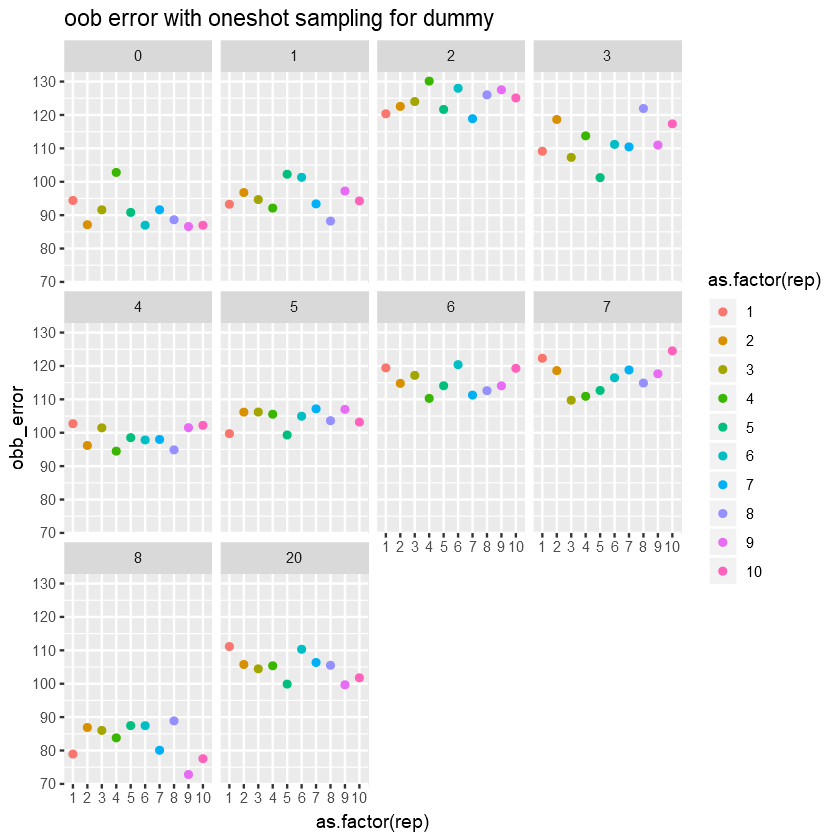

In [35]:
#### oob error ####
oob_oneshot_plot.2 = ggplot(obb_error_oneshot.2, aes(x=as.factor(rep), y = obb_error)) + 
                        geom_point(aes(colour = as.factor(rep))) +
                #geom_hline( aes(yintercept = obb_error, color = obb_error )) + 
                       # facet_grid(rep ~ seed) +
                        facet_wrap(~ seed) +
                        ggtitle(paste0("oob error with oneshot sampling for ",model.type.2)) 
oob_oneshot_plot.2

### test error

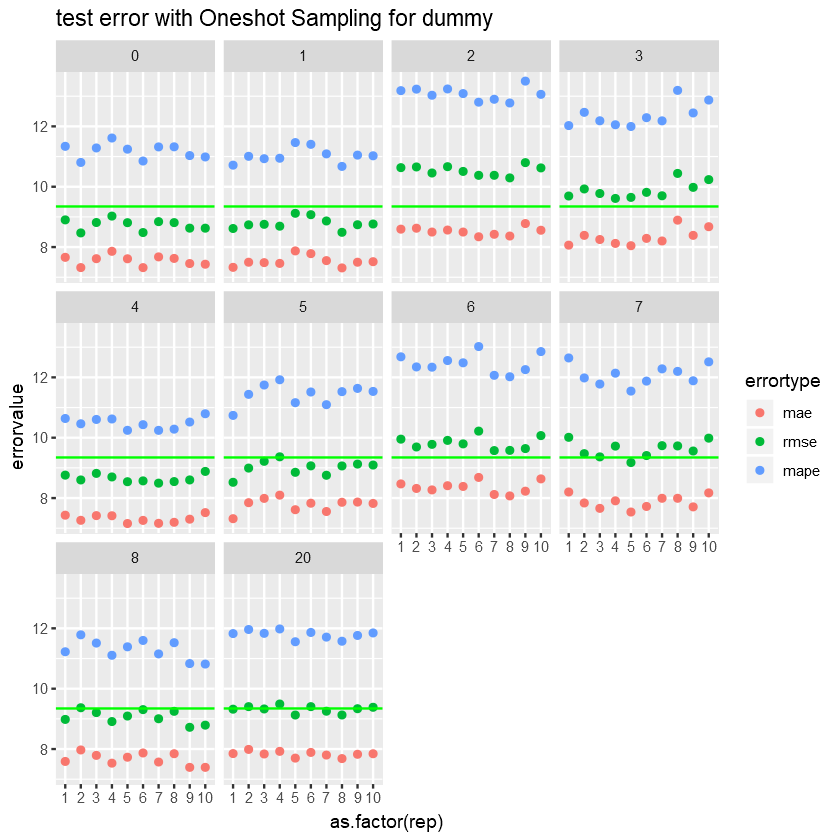

In [36]:
#### test error ####
one_shot_ind_p.2 = ggplot(performance_molten_oneshot.2, aes(x=as.factor(rep),y = errorvalue, group=errortype, col=errortype)) + 
                            geom_point() + 
                            facet_wrap( ~ seed) +
                            geom_hline(yintercept = mean(performance_molten_oneshot.2[errortype=="rmse"]$errorvalue), color = "green") +   
                            ggtitle(paste0("test error with Oneshot Sampling for ",model.type.2)) 
one_shot_ind_p.2

8.470226,8.490486,10.29345,9.612935,8.495083,8.523314,9.574276,9.178007,8.721441,9.128286
8.626650,8.693024,10.37989,9.693102,8.547238,8.854202,9.640304,9.409995,8.911671,9.254552
8.810080,8.748011,10.56635,9.795254,8.601596,9.066436,9.788990,9.641089,9.049768,9.333117
8.843199,8.865853,10.65648,9.980745,8.760789,9.127384,9.953325,9.737237,9.250908,9.405477
9.027491,9.120276,10.79937,10.236209,8.884158,9.368019,10.219651,10.013754,9.369482,9.492823
8.701884,8.661658,10.42816,9.651536,8.494898,8.929944,9.632592,9.477586,8.880271,9.257709
8.918277,8.834363,10.70454,9.938971,8.708295,9.202928,9.945387,9.804592,9.219264,9.408525


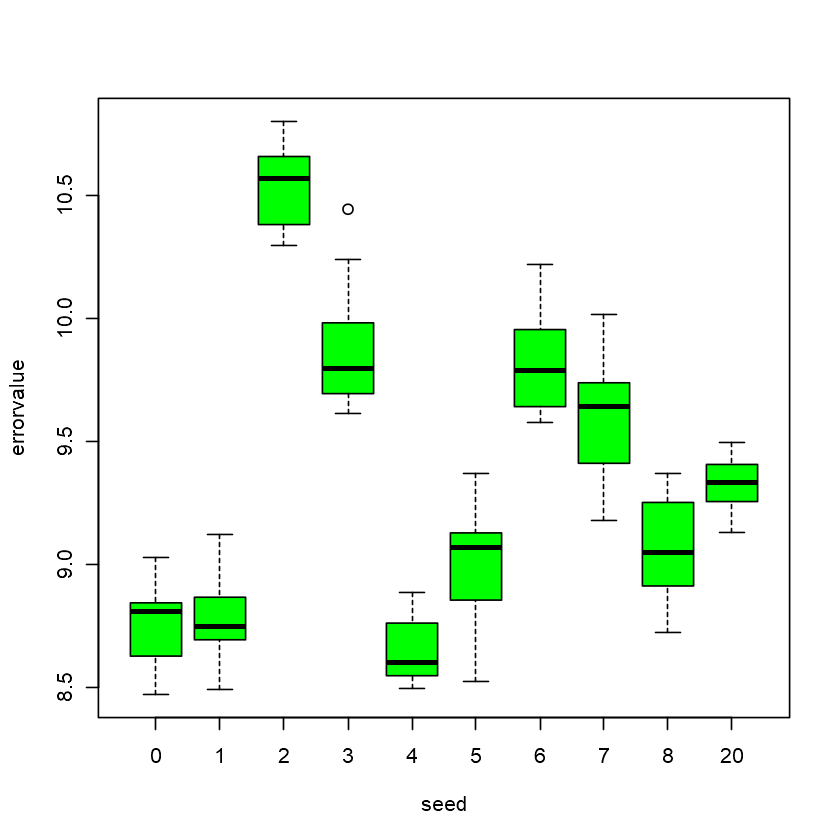

In [37]:
bxp.oneshot.2 <-  boxplot( data = performance_molten_oneshot.2[errortype == "rmse"], errorvalue  ~ seed, col = "green")
bxp.oneshot.2

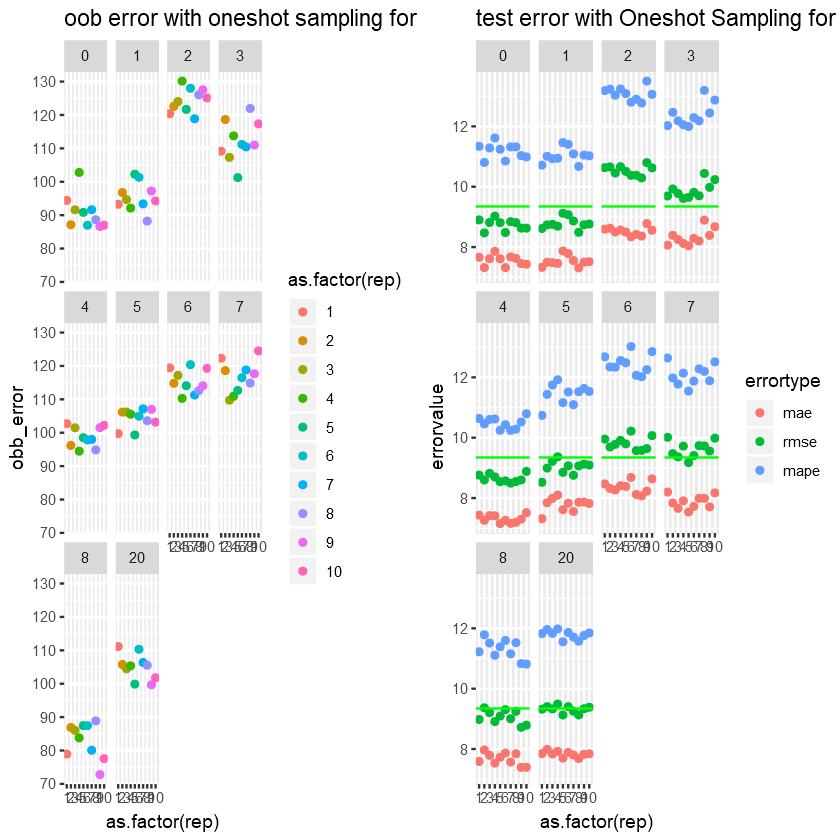

In [38]:
grid.arrange(oob_oneshot_plot.2,one_shot_ind_p.2, ncol = 2)

### Actual vs Fitted

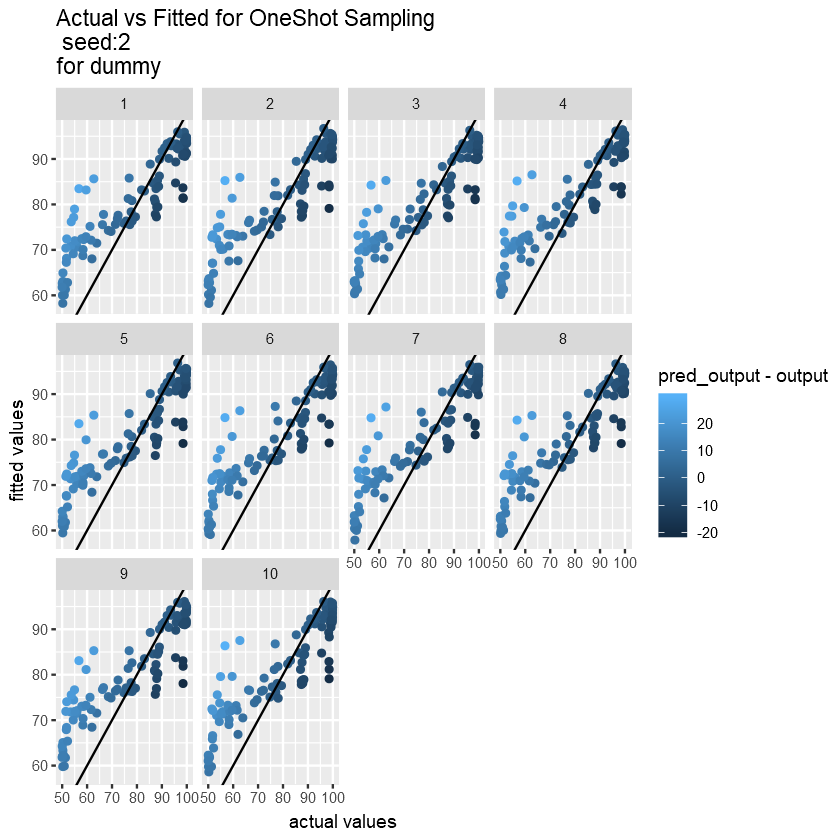

In [39]:
#### Actual vs Fitted ####
slct_seed= 2 
a_vs_f_oneshot.2 <- ggplot(predictedLabels_oneshot.2[seed == slct_seed]
                           ,aes(x = output, y =pred_output, color = pred_output - output)) +
            geom_point() +
            geom_abline() +
            facet_wrap(~ rep) +
            xlab("actual values") +
            ylab("fitted values") +
            ggtitle(paste0("Actual vs Fitted for OneShot Sampling","\n"," seed:",slct_seed,"\n","for ",model.type.2)) 

a_vs_f_oneshot.2

### Replications on Each Seed

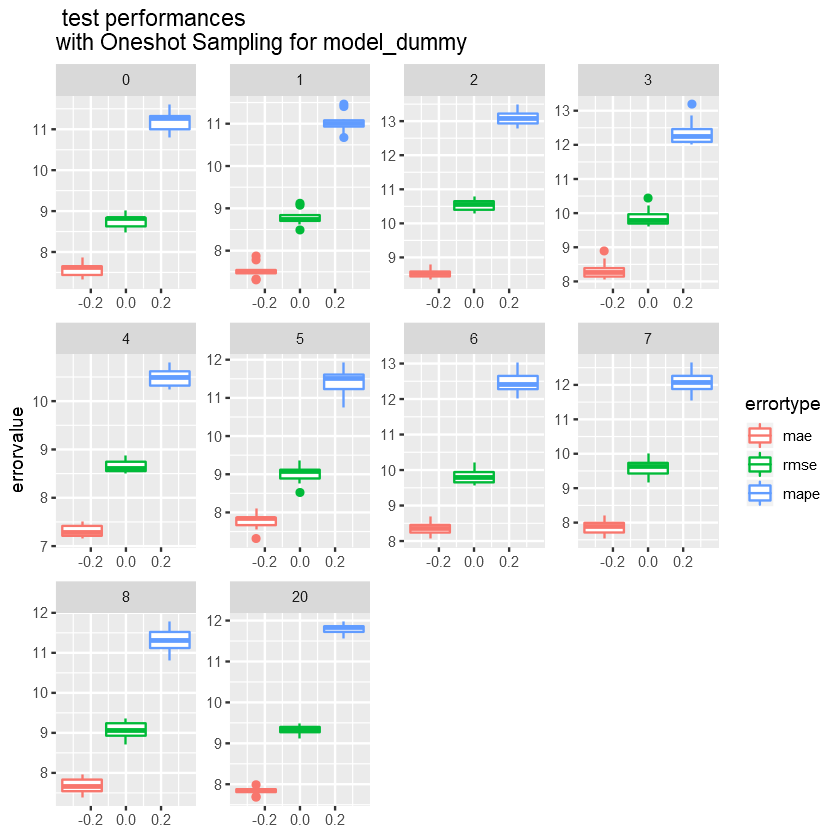

In [40]:
#### Replications on Each Seed ####
one_shot_ind_bxp.2 = ggplot(data = performance_molten_oneshot.2, aes(y = errorvalue, group=errortype, col=errortype)) +
                    geom_boxplot() +
                    facet_wrap(~ seed, scales = "free") +
                    ggtitle(paste0(" test performances","\n","with Oneshot Sampling for model_",model.type.2)) 
one_shot_ind_bxp.2

In [41]:
performance_table_oneshot.2[, .(mean_rmse = mean(rmse)),.(seed)][order(mean_rmse)]

seed,mean_rmse
<int>,<dbl>
4,8.652122
0,8.741549
1,8.785981
5,9.006951
8,9.064582
20,9.319068
7,9.617516
6,9.822358
3,9.883133


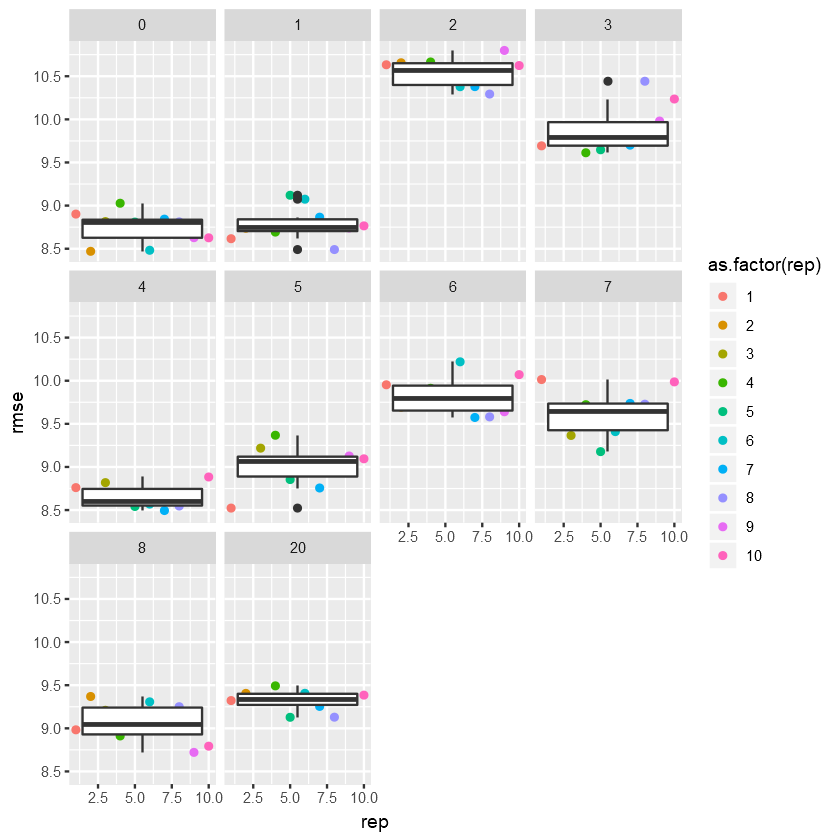

In [42]:
one_shot_ind_pbxp.2 = ggplot(data = performance_table_oneshot.2, aes(y =rmse, x = rep )) +
                    geom_point(aes(colour = as.factor(rep))) +
                    geom_boxplot() +
                    facet_wrap(~ seed) +
                    labs(legend = "rmse") 
one_shot_ind_pbxp.2

### Overall BoxPlot

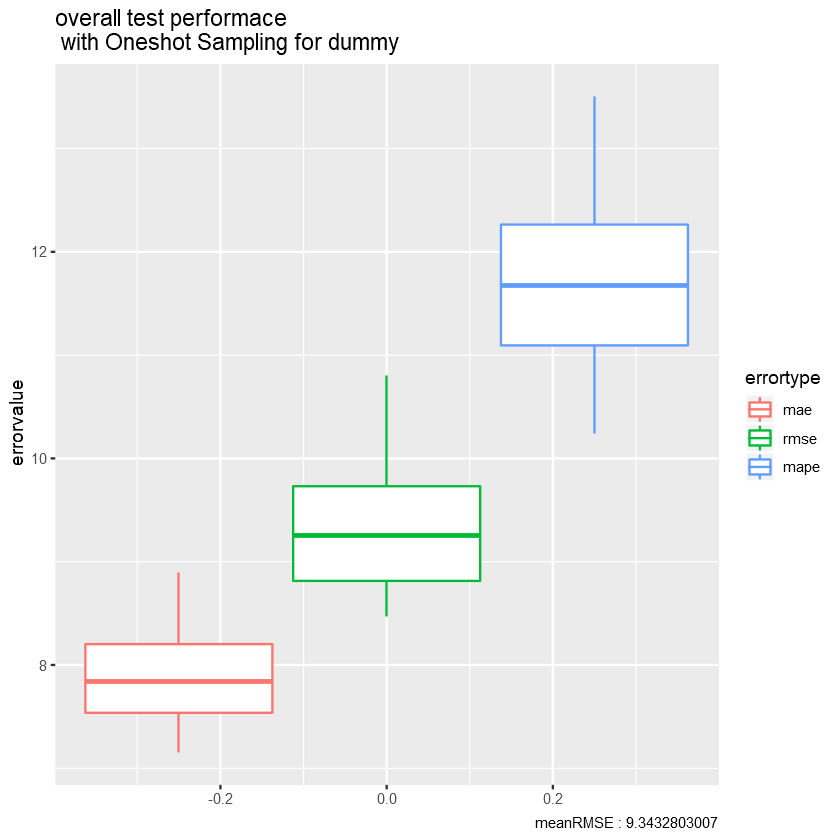

In [43]:
one_shot_bxp.2 = ggplot(data = performance_molten_oneshot.2, aes(y = errorvalue, group=errortype, col=errortype)) +
                    geom_boxplot(aes(colour = errortype)) +
                   # facet_wrap(~ seed) +
                    labs( caption = paste0("meanRMSE : ",mean(performance_table_oneshot.2$rmse))) +
                    ggtitle(paste0("overall test performace","\n"," with Oneshot Sampling for ",model.type.2))
                    
one_shot_bxp.2

In [44]:
boxplot.stats(performance_table_oneshot.2$rmse)

$stats
[1]  8.470226  8.813016  9.252730  9.732842 10.799375

$n
[1] 100

$conf
[1] 9.107397 9.398062

$out
numeric(0)

## Model.1 vs Model.2

In [45]:
cbind( performance_table_oneshot.1[, .(mean_rmse = mean(rmse)),.(seed)][order(mean_rmse)]
      ,performance_table_oneshot.2[, .(mean_rmse = mean(rmse)),.(seed)][order(mean_rmse)])

seed,mean_rmse,seed,mean_rmse
<int>,<dbl>,<int>,<dbl>
2,3.245273,4,8.652122
6,3.661898,0,8.741549
8,4.210791,1,8.785981
4,4.244389,5,9.006951
5,4.323117,8,9.064582
1,4.656075,20,9.319068
7,4.812622,7,9.617516
3,5.032114,6,9.822358
0,5.032954,3,9.883133


# Random Sampling Replications

In [46]:
#### Random Sampling Replications ####

## Model.1

In [47]:
#### Model.1 ####
Rd_path.1 = paste0(outputs.path.1,"Rd/")

obb_error_Rd.1              = fread(paste0(Rd_path.1,model.type.1,"_obb_error_Rd",".csv"))
performance_table_Rd.1      = fread(paste0(Rd_path.1,model.type.1,"_performance_table_Rd",".csv"))
predictedLabels_Rd.1        = fread(paste0(Rd_path.1,model.type.1,"_predictedLabels_table_Rd",".csv"))
FinalTrainData_Rd.1         = fread(paste0(Rd_path.1,model.type.1,"_FinalTrainData_Rd",".csv"))
train_candidates_Rd.1       = fread(paste0(Rd_path.1,model.type.1,"_train_candidates_table_Rd",".csv"))

In [48]:
performance_molten_Rd_seq.1 <- melt(data = performance_table_Rd.1
                             , id.vars = c('iter',"seed","rep"))
setnames(performance_molten_Rd_seq.1, c("variable","value"),c("errortype","errorvalue"))

In [49]:
predictedLabels_molten_Rd_seq.1 <- melt(data = predictedLabels_Rd.1
                             , id.vars = c("density","%-similar-wanted",'output',"seed","rep")
                             , measure.vars = c("pred_output_1","pred_output_2","pred_output_3","pred_output_4","pred_output_5","pred_output_6","pred_output_7","pred_output_8","pred_output_9","pred_output_10","pred_output_11"))
setnames(predictedLabels_molten_Rd_seq.1, c("variable","value"),c("iter","pred_output"))
predictedLabels_molten_Rd_seq.1[,iter := as.numeric(str_sub(iter, 13))]

### oob error

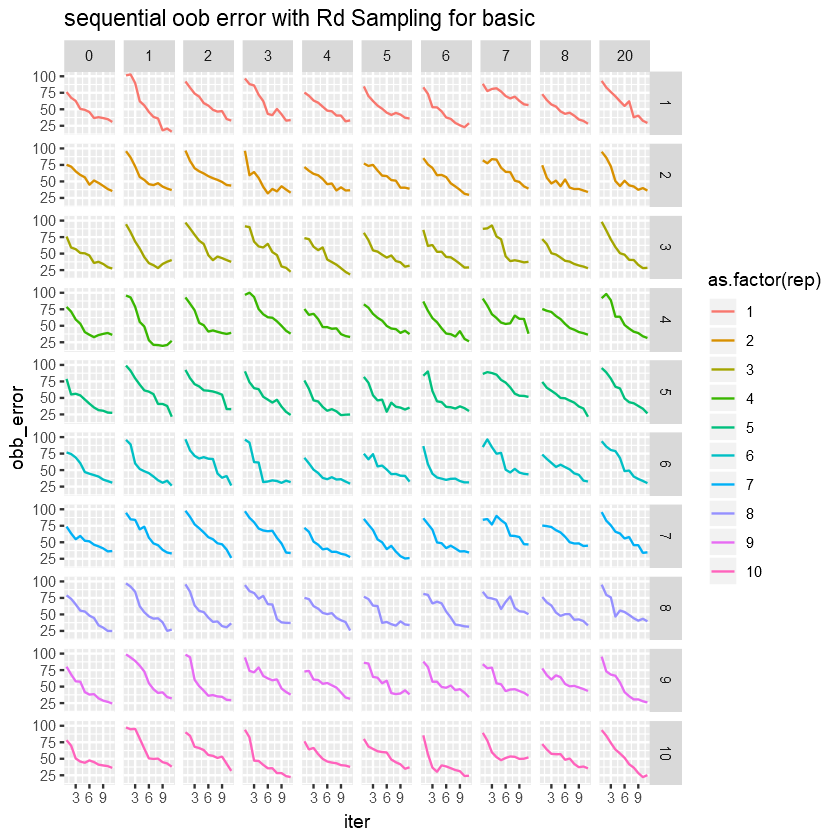

In [50]:
#### oob error ####
oob_Rd_seq_plot.1 = ggplot(obb_error_Rd.1, aes(x=iter, y = obb_error)) + 
                geom_line( aes(color = as.factor(rep))) + 
                facet_grid(rep ~ seed) +
                ggtitle(paste0("sequential oob error with Rd Sampling for ",model.type.1)) 
oob_Rd_seq_plot.1

### test error

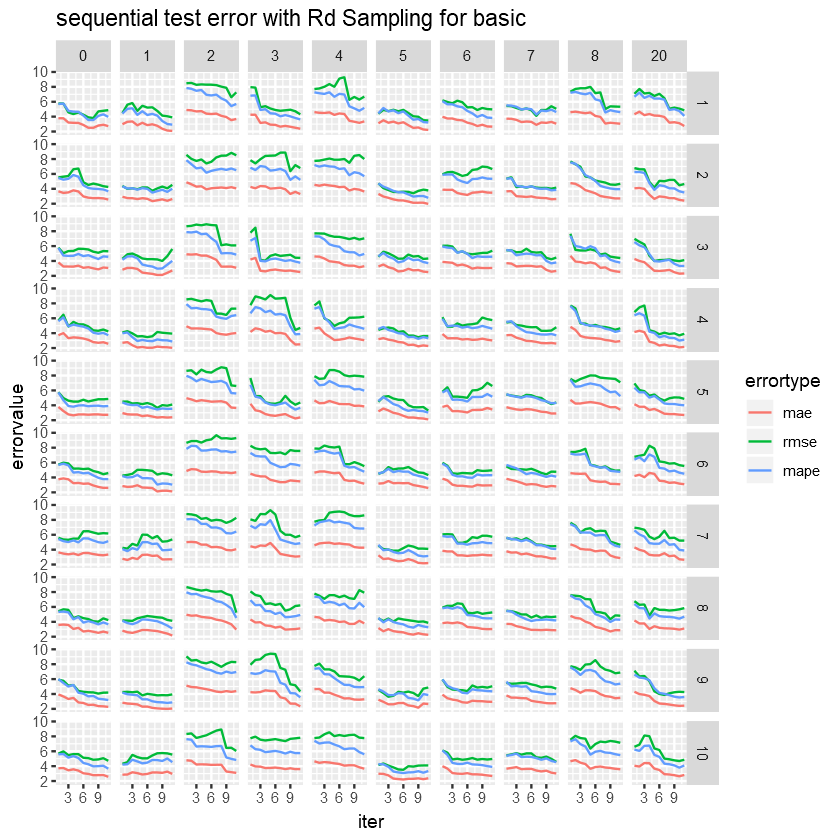

In [51]:
#### test error ####
test_error_Rd_seq_plot.1 = ggplot(performance_molten_Rd_seq.1, aes(x=iter,y = errorvalue, group=errortype, col=errortype)) + 
                            geom_line() + 
                            facet_grid(rep ~ seed) +
                            ggtitle(paste0("sequential test error with Rd Sampling for ",model.type.1)) 
test_error_Rd_seq_plot.1

### Actual vs Fitted

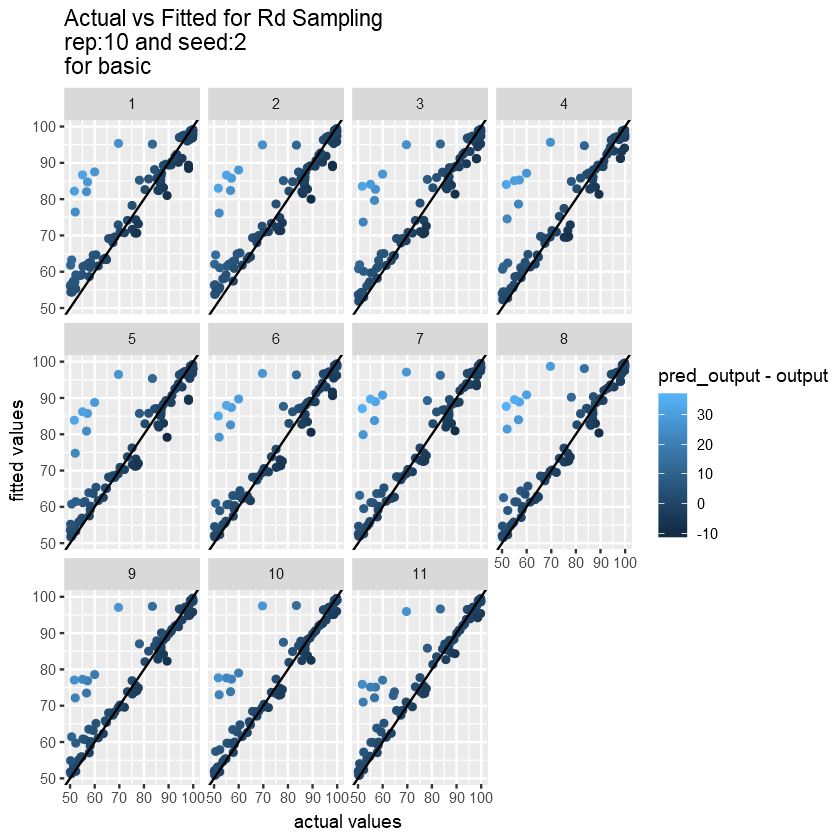

In [52]:
#### Actual vs Fitted ####
# The last iteration(pred_output_11) on the 10th replication
slct_rep = 10
slct_seed= 2
a_vs_f_Rd_seq.1 <- ggplot(predictedLabels_molten_Rd_seq.1[rep == slct_rep & seed == slct_seed]
                 ,aes(x = output, y =pred_output, color = pred_output - output)) +
            geom_point() +
            geom_abline() +
            facet_wrap( ~ iter) +
            xlab("actual values") +
            ylab("fitted values") +
            ggtitle(paste0("Actual vs Fitted for Rd Sampling","\n","rep:",slct_rep," and seed:",slct_seed,"\n","for ",model.type.1)) 

a_vs_f_Rd_seq.1

### Replications on Each Iteration

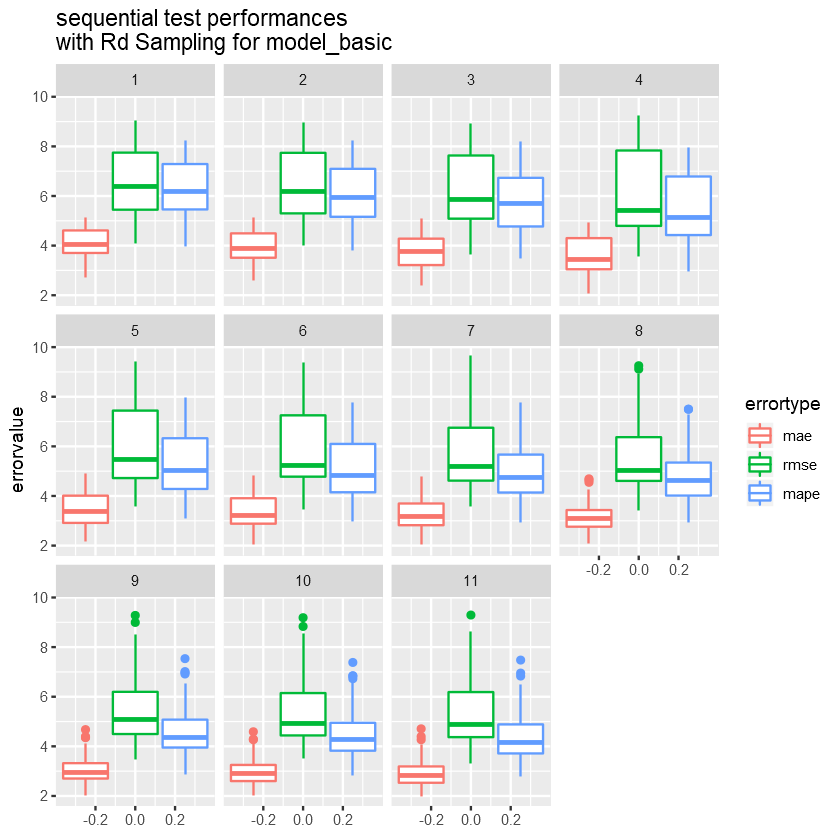

In [53]:
#### Replications on Each Iteration ####
# Observe the boxplots in each iterations
Rd_seq_ind_bxp.1 = ggplot(performance_molten_Rd_seq.1, aes(y = errorvalue, group=errortype, col=errortype)) + 
                  geom_boxplot()+
                  facet_wrap(~iter) +
                #  geom_hline(data = performance_molten_oneshot, aes(yintercept = errorvalue, group=errortype, col=errortype),stat = "hline", linetype = "dashed") +
                  ggtitle(paste0("sequential test performances","\n","with Rd Sampling for model_",model.type.1))
Rd_seq_ind_bxp.1

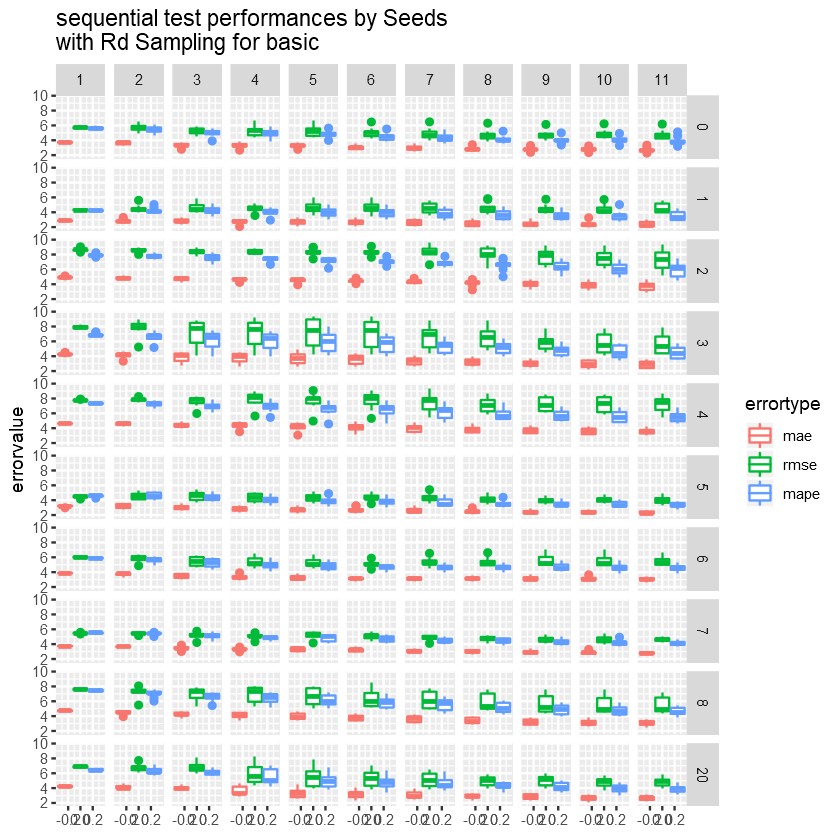

In [54]:
Rd_seq_ind_bxp_seed.1 = ggplot(performance_molten_Rd_seq.1
                               , aes(y = errorvalue, group = errortype, col = errortype)) + 
                            geom_boxplot() + 
                            facet_grid(seed ~ iter ) + 
                            ggtitle(paste0("sequential test performances by Seeds","\n","with Rd Sampling for ",model.type.1))
Rd_seq_ind_bxp_seed.1

### Overall BoxPlot

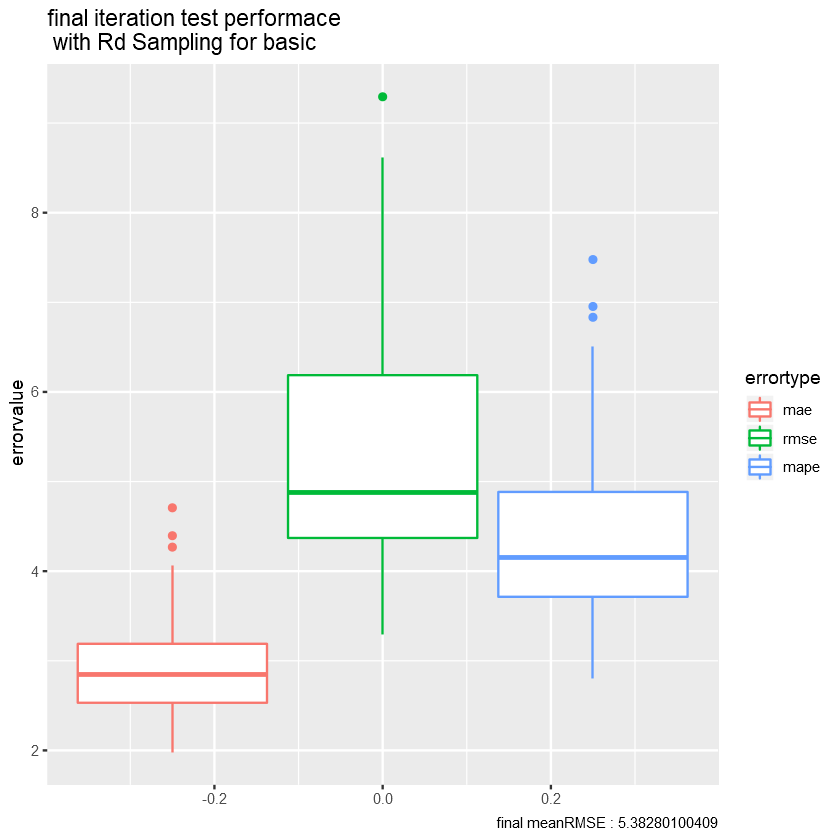

In [55]:
#### Overall BoxPlot ####
Rd_seq_bxp.1 = ggplot(data = performance_molten_Rd_seq.1[iter == 11], aes( y = errorvalue, group=errortype, col=errortype)) +
                    geom_boxplot(aes(colour = errortype)) +
                    labs( caption = paste0("final meanRMSE : ",mean(performance_table_Rd.1[iter == 11]$rmse))) +
                    ggtitle(paste0("final iteration test performace","\n"," with Rd Sampling for ",model.type.1))
                    
Rd_seq_bxp.1

In [56]:
boxplot.stats(performance_table_Rd.1[iter == 11]$rmse)

$stats
[1] 3.292855 4.359444 4.877002 6.196094 8.614731

$n
[1] 100

$conf
[1] 4.586811 5.167193

$out
[1] 9.293791

### Train Candidates

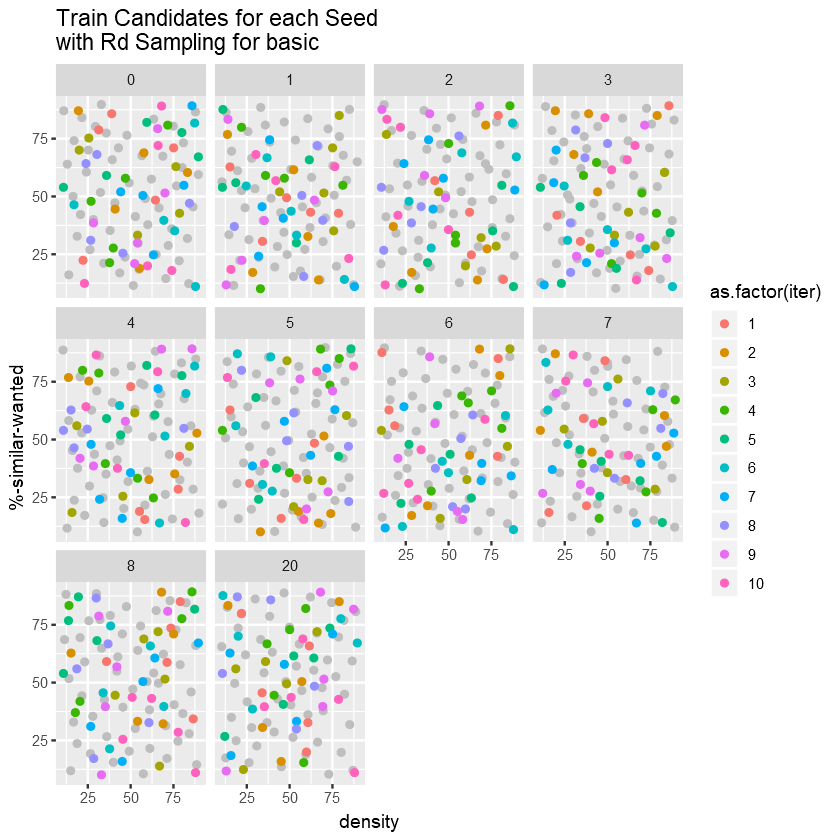

In [57]:
#### Train Candidates ####
tc_Rd_seq_plot.1 = ggplot(adaptive_initial_data.1, aes(x = density, y = `%-similar-wanted`)) +
               geom_point(color = "grey") +
               geom_point(data = train_candidates_Rd.1[rep == 10], aes(colour = as.factor(iter))) +
               facet_wrap(~ seed) + 
               labs(legend = "output") +
               ggtitle(paste0("Train Candidates for each Seed","\n","with Rd Sampling for ",model.type.1))
tc_Rd_seq_plot.1



### Final Data

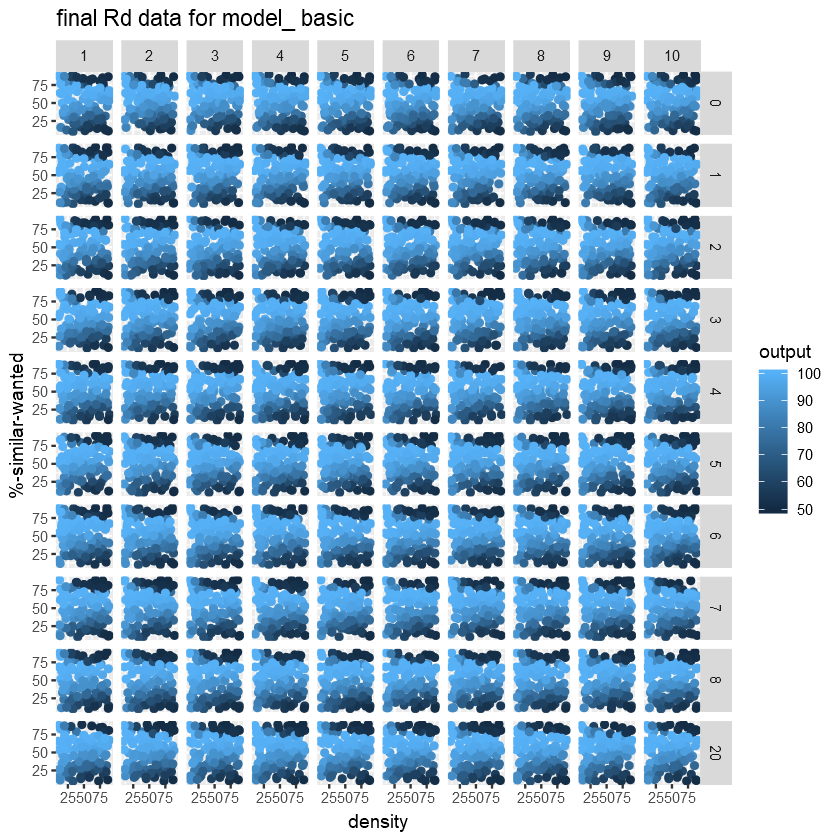

In [58]:
#### Final Data ####
final_train_data_Rd.1 = ggplot(data = FinalTrainData_Rd.1, aes(x = density, y = `%-similar-wanted`)) +
                           geom_point(aes(colour = output)) +
                           facet_grid(seed~rep) +
                            #facet_warp(~rep) +
                            #facet_warp(~seed) +
                           labs(legend = "output") +
                           ggtitle(paste0("final Rd data for model_ ",model.type.1))
final_train_data_Rd.1


## Model.2

In [59]:
#### Model.2 ####
Rd_path.2 = paste0(outputs.path.2,"Rd/")

obb_error_Rd.2              = fread(paste0(Rd_path.2,model.type.2,"_obb_error_Rd",".csv"))
performance_table_Rd.2      = fread(paste0(Rd_path.2,model.type.2,"_performance_table_Rd",".csv"))
predictedLabels_Rd.2        = fread(paste0(Rd_path.2,model.type.2,"_predictedLabels_table_Rd",".csv"))
FinalTrainData_Rd.2         = fread(paste0(Rd_path.2,model.type.2,"_FinalTrainData_Rd",".csv"))
train_candidates_Rd.2       = fread(paste0(Rd_path.2,model.type.2,"_train_candidates_table_Rd",".csv"))

In [60]:
performance_molten_Rd_seq.2 <- melt(data = performance_table_Rd.2
                             , id.vars = c('iter',"seed","rep"))
setnames(performance_molten_Rd_seq.2, c("variable","value"),c("errortype","errorvalue"))

predictedLabels_molten_Rd_seq.2 <- melt(data = predictedLabels_Rd.2
                             , id.vars = c("density","%-similar-wanted",'output',"seed","rep")
                             , measure.vars = c("pred_output_1","pred_output_2","pred_output_3","pred_output_4","pred_output_5","pred_output_6","pred_output_7","pred_output_8","pred_output_9","pred_output_10","pred_output_11"))
setnames(predictedLabels_molten_Rd_seq.2, c("variable","value"),c("iter","pred_output"))
predictedLabels_molten_Rd_seq.2[,iter := as.numeric(str_sub(iter, 13))]


### oob error 

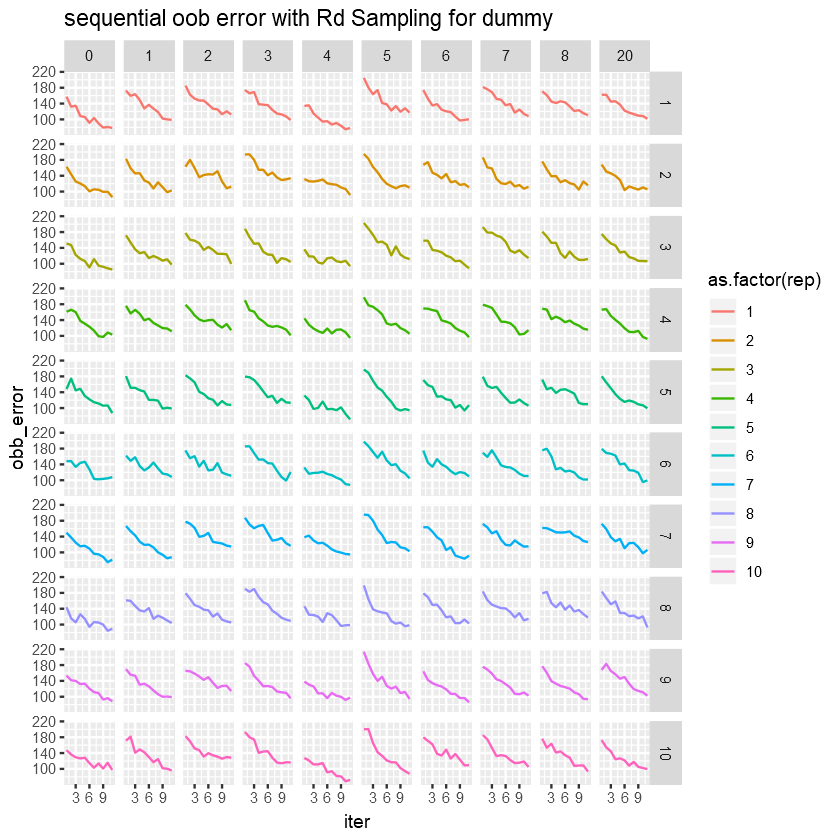

In [61]:
#### oob error ####
oob_Rd_seq_plot.2 = ggplot(obb_error_Rd.2, aes(x=iter, y = obb_error)) + 
                geom_line( aes(color = as.factor(rep))) + 
                facet_grid(rep ~ seed) +
                ggtitle(paste0("sequential oob error with Rd Sampling for ",model.type.2)) 
oob_Rd_seq_plot.2

### test error 

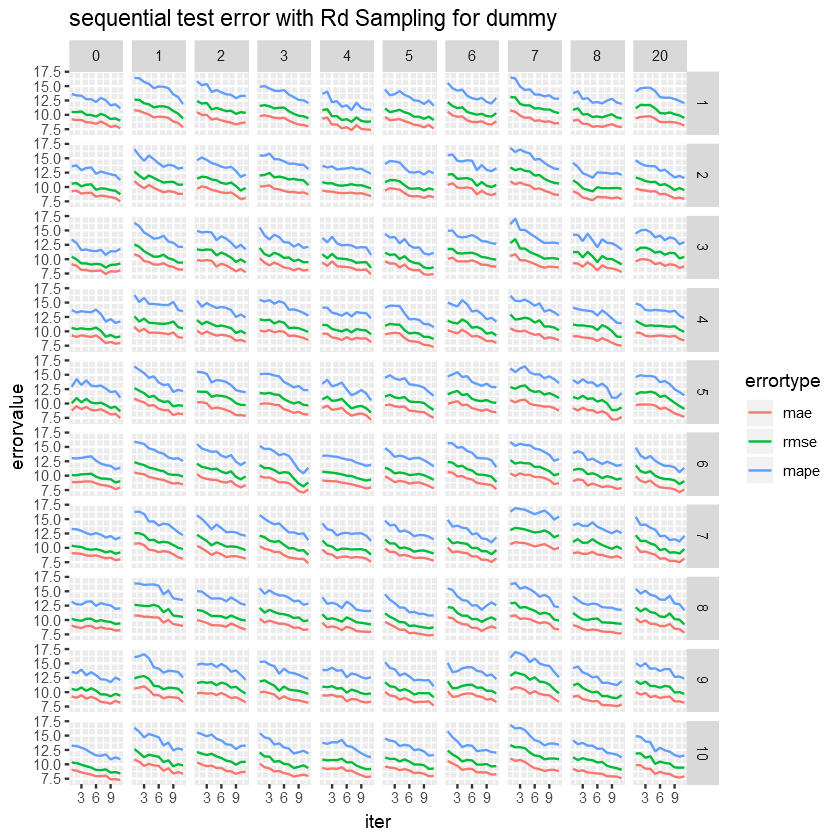

In [62]:
#### test error ####
test_error_Rd_seq_plot.2 = ggplot(performance_molten_Rd_seq.2, aes(x=iter,y = errorvalue, group=errortype, col=errortype)) + 
                            geom_line() + 
                            facet_grid(rep ~ seed) +
                            ggtitle(paste0("sequential test error with Rd Sampling for ",model.type.2)) 
test_error_Rd_seq_plot.2

### Actual vs Fitted 

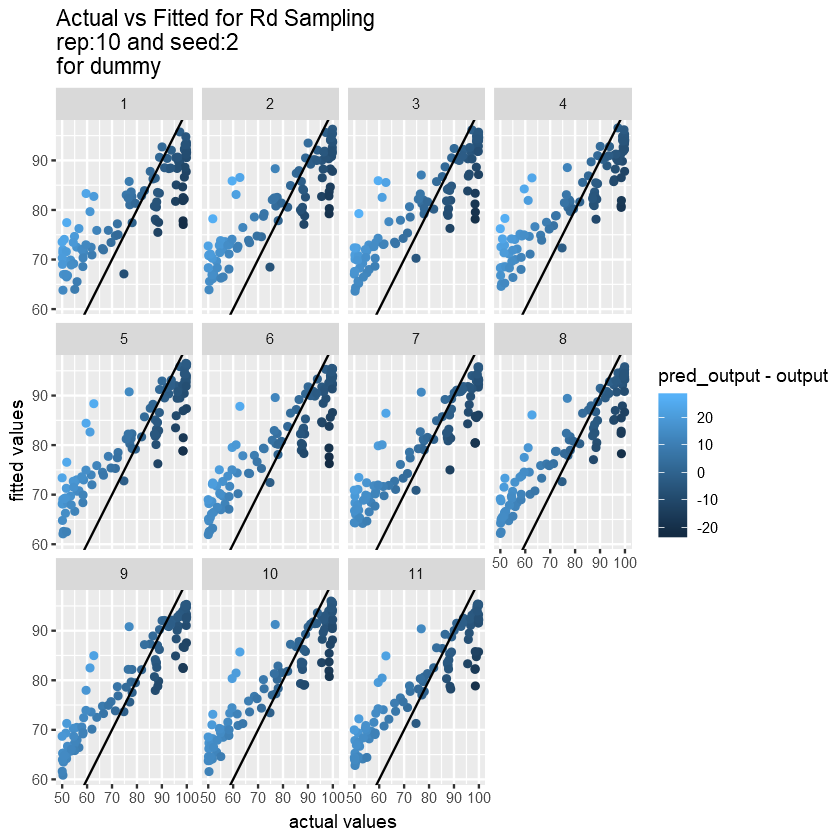

In [63]:
#### Actual vs Fitted ####
slct_rep = 10
slct_seed= 2
a_vs_f_Rd_seq.2 <- ggplot(predictedLabels_molten_Rd_seq.2[rep == slct_rep & seed == slct_seed]
                 ,aes(x = output, y =pred_output, color = pred_output - output)) +
            geom_point() +
            geom_abline() +
            facet_wrap( ~ iter) +
            xlab("actual values") +
            ylab("fitted values") +
            ggtitle(paste0("Actual vs Fitted for Rd Sampling","\n","rep:",slct_rep," and seed:",slct_seed,"\n","for ",model.type.2)) 

a_vs_f_Rd_seq.2


### Replications on Each Iteration 

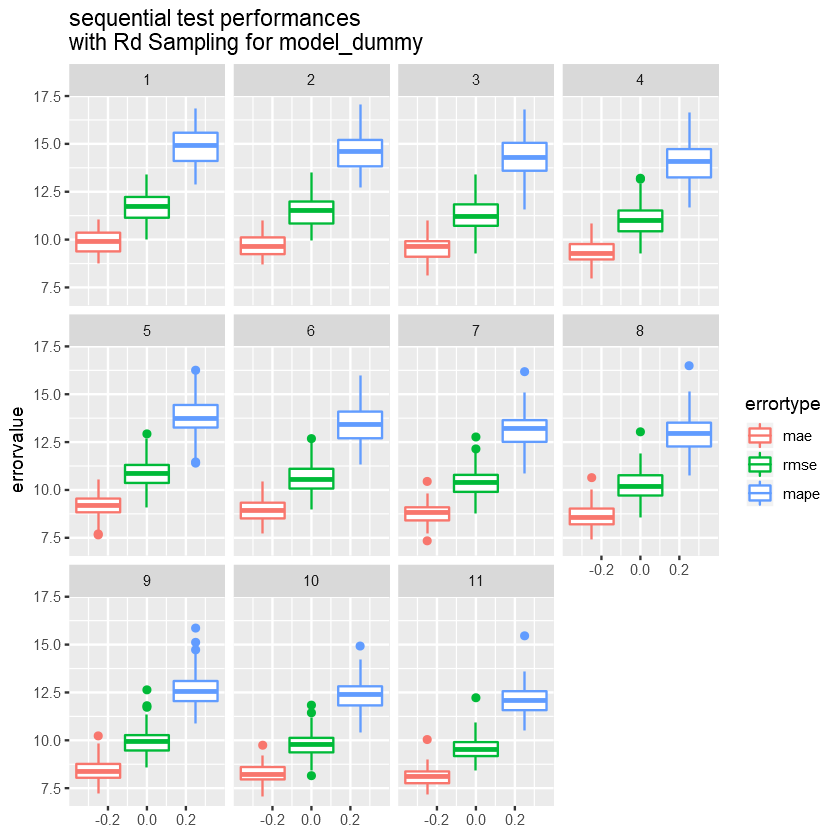

In [64]:
#### Replications on Each Iteration ####
# Observe the boxplots in each iterations
Rd_seq_ind_bxp.2 = ggplot(performance_molten_Rd_seq.2, aes(y = errorvalue, group=errortype, col=errortype)) + 
                  geom_boxplot()+
                  facet_wrap(~iter) +
                #  geom_hline(data = performance_molten_oneshot, aes(yintercept = errorvalue, group=errortype, col=errortype),stat = "hline", linetype = "dashed") +
                  ggtitle(paste0("sequential test performances","\n","with Rd Sampling for model_",model.type.2))
Rd_seq_ind_bxp.2


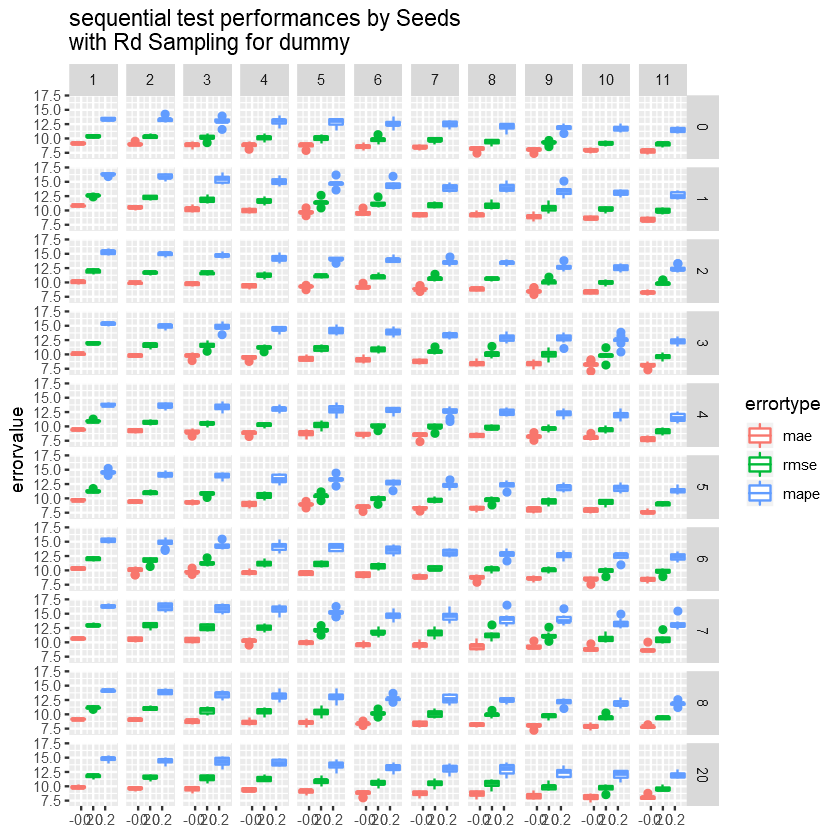

In [65]:
Rd_seq_ind_bxp_seed.2 = ggplot(performance_molten_Rd_seq.2
                               , aes(y = errorvalue, group = errortype, col = errortype)) + 
                            geom_boxplot() + 
                            facet_grid(seed ~ iter ) + 
                            ggtitle(paste0("sequential test performances by Seeds","\n","with Rd Sampling for ",model.type.2))
Rd_seq_ind_bxp_seed.2

### Overall BoxPlot 

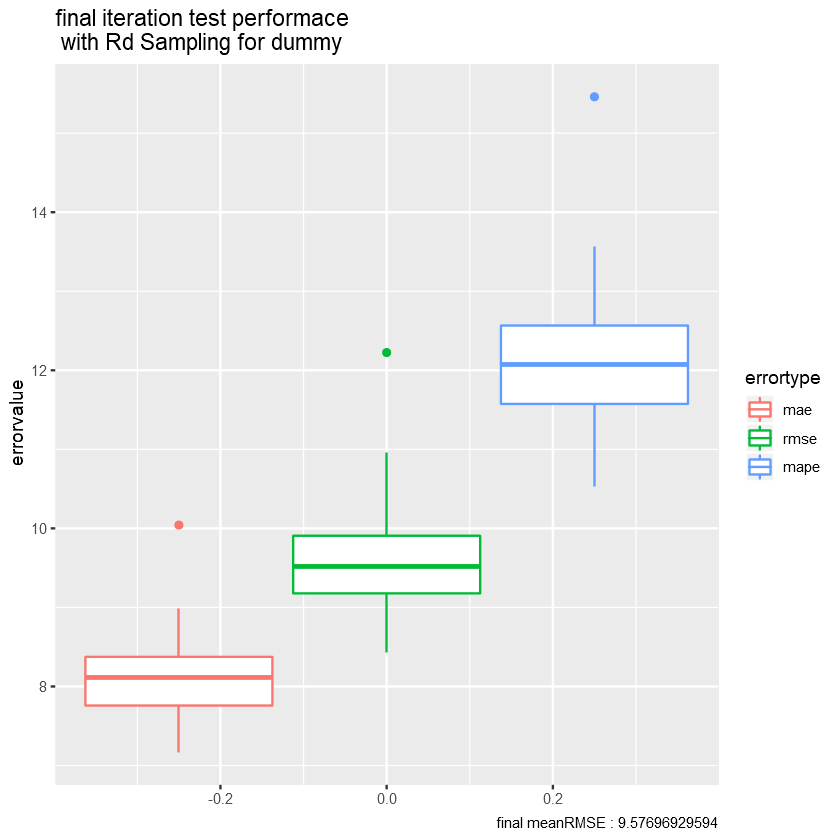

In [66]:
#### Overall BoxPlot ####
Rd_seq_bxp.2 = ggplot(data = performance_molten_Rd_seq.2[iter == 11], aes( y = errorvalue, group=errortype, col=errortype)) +
                    geom_boxplot(aes(colour = errortype)) +
                    labs( caption = paste0("final meanRMSE : ",mean(performance_table_Rd.2[iter == 11]$rmse))) +
                    ggtitle(paste0("final iteration test performace","\n"," with Rd Sampling for ",model.type.2))
                    
Rd_seq_bxp.2

In [67]:
boxplot.stats(performance_table_Rd.2[iter == 11]$rmse)

$stats
[1]  8.430070  9.156126  9.512316  9.908136 10.957743

$n
[1] 100

$conf
[1] 9.393498 9.631133

$out
[1] 12.22456

### Train Candidates

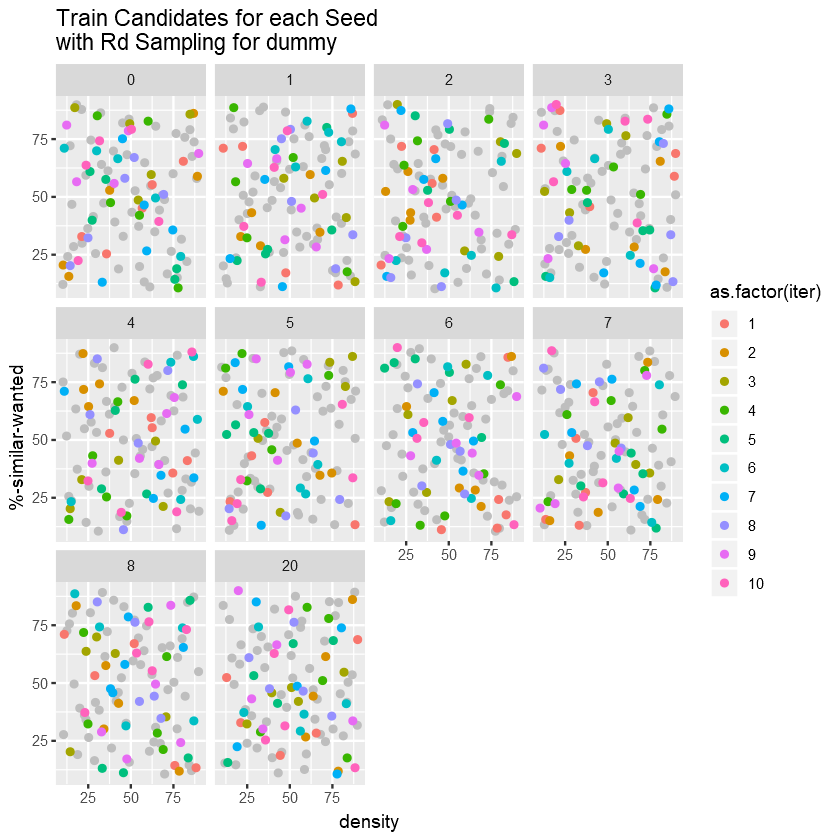

In [68]:
#### Train Candidates ####
tc_Rd_seq_plot.2 = ggplot(adaptive_initial_data.2, aes(x = density, y = `%-similar-wanted`)) +
               geom_point(color = "grey") +
               geom_point(data = train_candidates_Rd.2[rep == 10], aes(colour = as.factor(iter))) +
               facet_wrap(~ seed) + 
               labs(legend = "output") +
               ggtitle(paste0("Train Candidates for each Seed","\n","with Rd Sampling for ",model.type.2))
tc_Rd_seq_plot.2

### Final Data ####

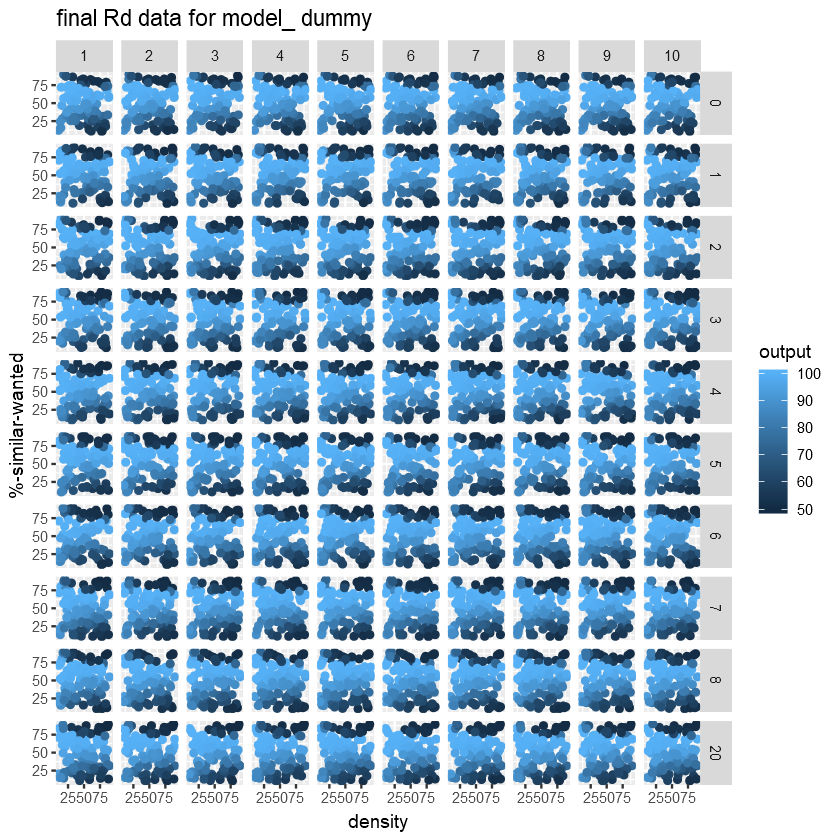

In [69]:
#### Final Data ####
final_train_data_Rd.2 = ggplot(data = FinalTrainData_Rd.2, aes(x = density, y = `%-similar-wanted`)) +
                           geom_point(aes(colour = output)) +
                           facet_grid(seed~rep) +
                            #facet_warp(~rep) +
                            #facet_warp(~seed) +
                           labs(legend = "output") +
                           ggtitle(paste0("final Rd data for model_ ",model.type.2))
final_train_data_Rd.2

## Model.1 vs Model.2

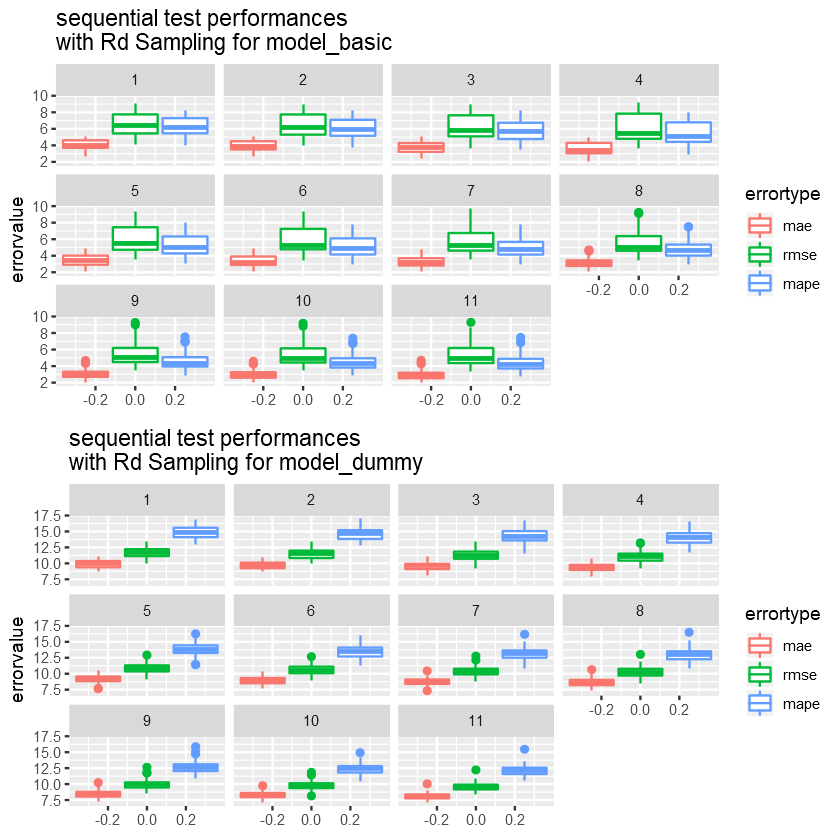

In [70]:
grid.arrange(Rd_seq_ind_bxp.1,Rd_seq_ind_bxp.2)

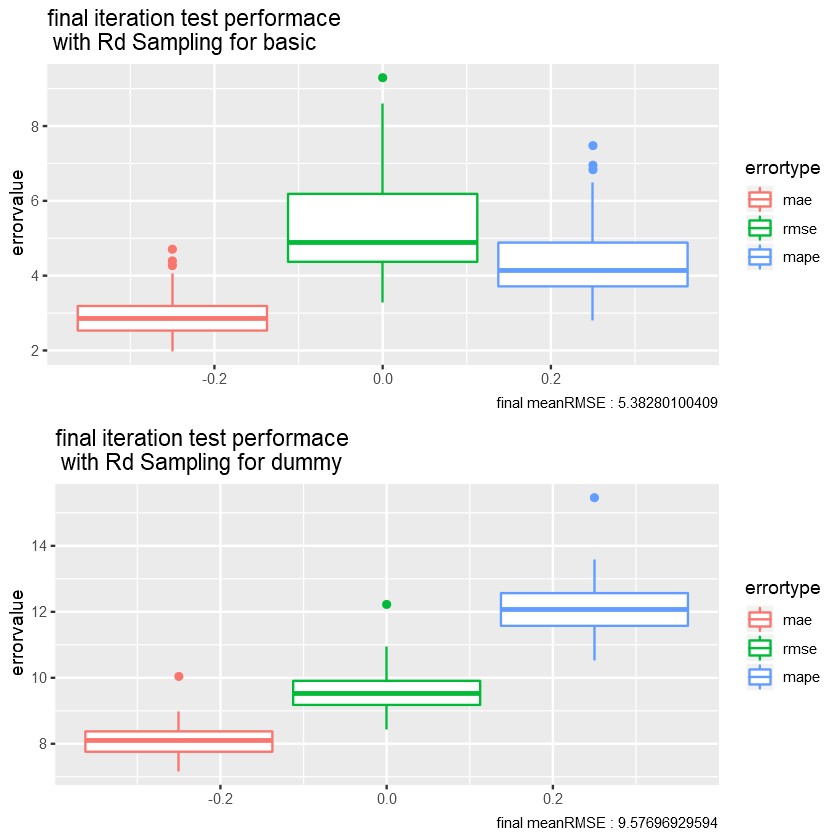

In [71]:
grid.arrange(Rd_seq_bxp.1,Rd_seq_bxp.2)

# Adaptive Sampling Replications

In [72]:
#### Adaptive Sampling ####

## Model.1

In [73]:
#### Model.1 ####
Ad_path.1 = paste0(outputs.path.1,"Ad_sd/")

obb_error_Ad.1              = fread(paste0(Ad_path.1,model.type.1,"_obb_error_Ad",".csv"))
performance_table_Ad.1      = fread(paste0(Ad_path.1,model.type.1,"_performance_table_Ad",".csv"))
predictedLabels_Ad.1        = fread(paste0(Ad_path.1,model.type.1,"_predictedLabels_table_Ad",".csv"))
FinalTrainData_Ad.1         = fread(paste0(Ad_path.1,model.type.1,"_FinalTrainData_Ad",".csv"))
train_candidates_Ad.1       = fread(paste0(Ad_path.1,model.type.1,"_train_candidates_table_Ad",".csv"))

In [74]:
performance_molten_Ad_seq.1 <- melt(data = performance_table_Ad.1
                             , id.vars = c('iter',"seed","rep"))
setnames(performance_molten_Ad_seq.1, c("variable","value"),c("errortype","errorvalue"))

predictedLabels_molten_Ad_seq.1 <- melt(data = predictedLabels_Ad.1
                             , id.vars = c("density","%-similar-wanted",'output',"seed","rep")
                             , measure.vars = c("pred_output_1","pred_output_2","pred_output_3","pred_output_4","pred_output_5","pred_output_6","pred_output_7","pred_output_8","pred_output_9","pred_output_10","pred_output_11"))
setnames(predictedLabels_molten_Ad_seq.1, c("variable","value"),c("iter","pred_output"))
predictedLabels_molten_Ad_seq.1[,iter := as.numeric(str_sub(iter, 13))]


### oob error

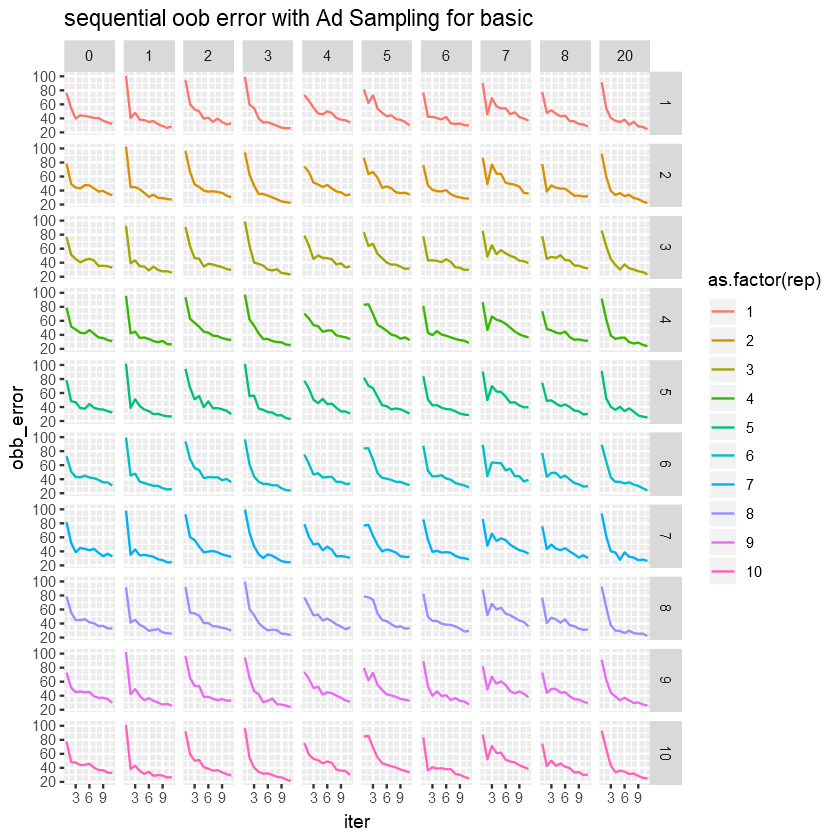

In [75]:
#### oob error ####
oob_Ad_seq_plot.1 = ggplot(obb_error_Ad.1, aes(x=iter, y = obb_error)) + 
                geom_line( aes(color = as.factor(rep))) + 
                facet_grid(rep ~ seed) +
                ggtitle(paste0("sequential oob error with Ad Sampling for ",model.type.1)) 
oob_Ad_seq_plot.1

### test error

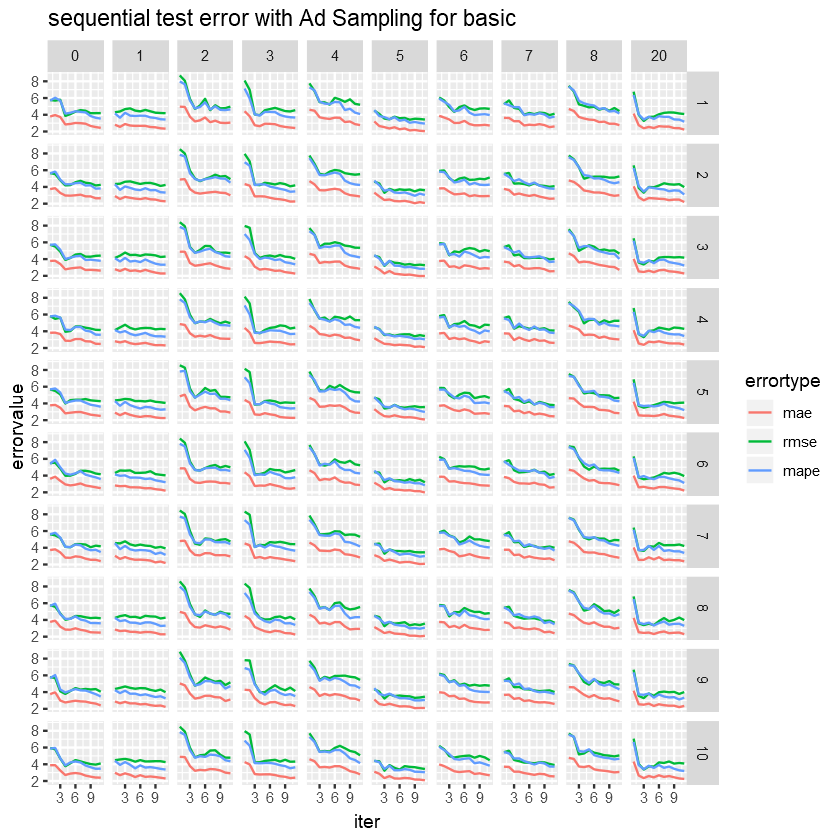

In [76]:
#### test error ####
test_error_Ad_seq_plot.1 = ggplot(performance_molten_Ad_seq.1, aes(x=iter,y = errorvalue, group=errortype, col=errortype)) + 
                            geom_line() + 
                            facet_grid(rep ~ seed) +
                            ggtitle(paste0("sequential test error with Ad Sampling for ",model.type.1)) 
test_error_Ad_seq_plot.1

### Actual vs Fitted

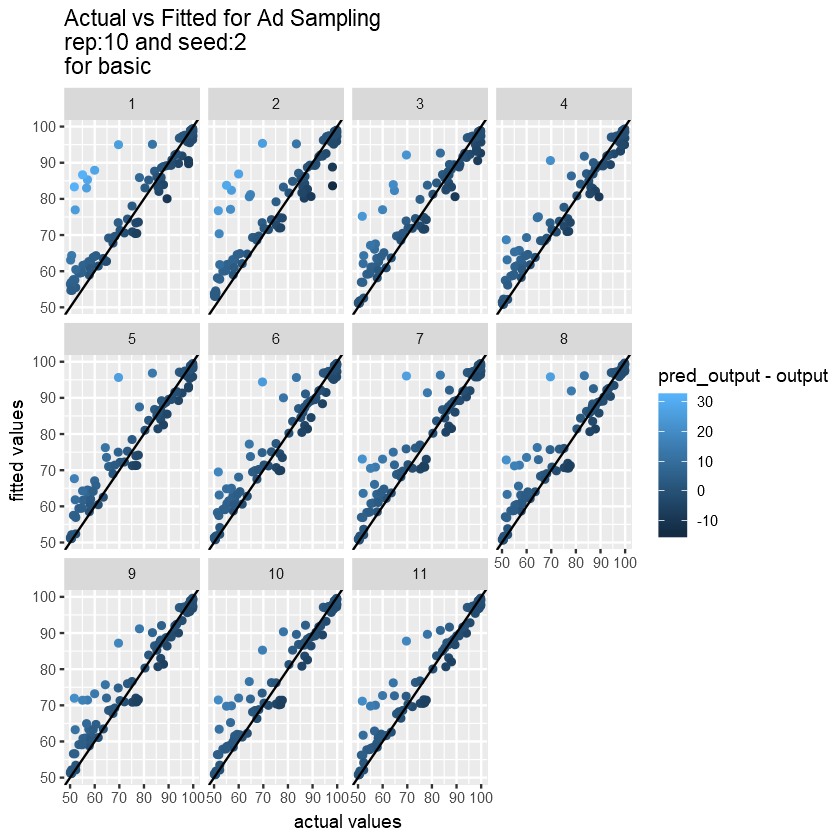

In [77]:
#### Actual vs Fitted ####
# The last iteration(pred_output_11) on the 10th replication
slct_rep = 10
slct_seed= 2
a_vs_f_Ad_seq.1 <- ggplot(predictedLabels_molten_Ad_seq.1[rep == slct_rep & seed == slct_seed]
                 ,aes(x = output, y =pred_output, color = pred_output - output)) +
            geom_point() +
            geom_abline() +
            facet_wrap( ~ iter) +
            xlab("actual values") +
            ylab("fitted values") +
            ggtitle(paste0("Actual vs Fitted for Ad Sampling ","\n","rep:",slct_rep," and seed:",slct_seed,"\n","for ",model.type.1)) 

a_vs_f_Ad_seq.1

### Replications on Each Iteration

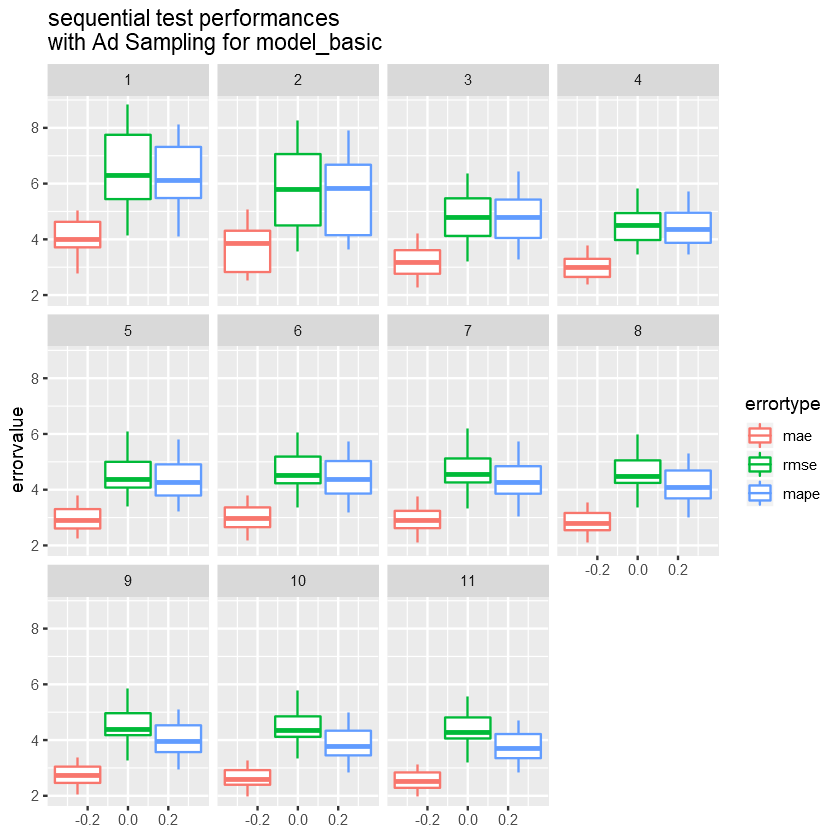

In [78]:
#### Replications on Each Iteration ####
# Observe the boxplots in each iterations
Ad_seq_ind_bxp.1 = ggplot(performance_molten_Ad_seq.1, aes(y = errorvalue, group=errortype, col=errortype)) + 
                  geom_boxplot()+
                  facet_wrap(~iter) +
                #  geom_hline(data = performance_molten_oneshot, aes(yintercept = errorvalue, group=errortype, col=errortype),stat = "hline", linetype = "dashed") +
                  ggtitle(paste0("sequential test performances","\n","with Ad Sampling for model_",model.type.1))
Ad_seq_ind_bxp.1

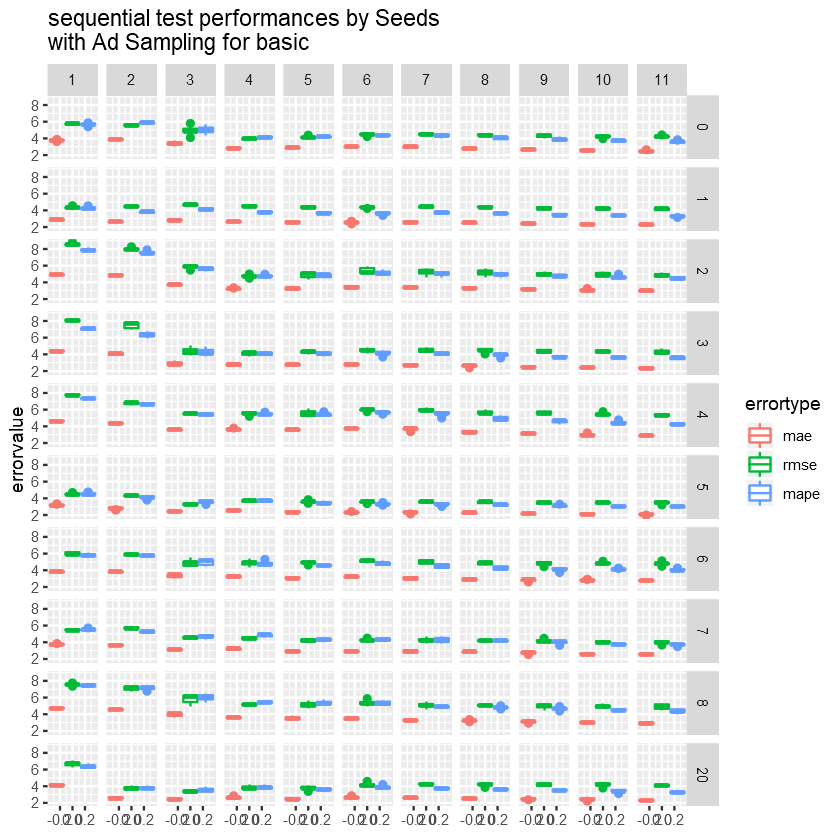

In [79]:
Ad_seq_ind_bxp_seed.1 = ggplot(performance_molten_Ad_seq.1
                               , aes(y = errorvalue, group = errortype, col = errortype)) + 
                            geom_boxplot() + 
                            facet_grid(seed ~ iter ) + 
                            ggtitle(paste0("sequential test performances by Seeds","\n","with Ad Sampling for ",model.type.1))
Ad_seq_ind_bxp_seed.1

### Overall BoxPlot

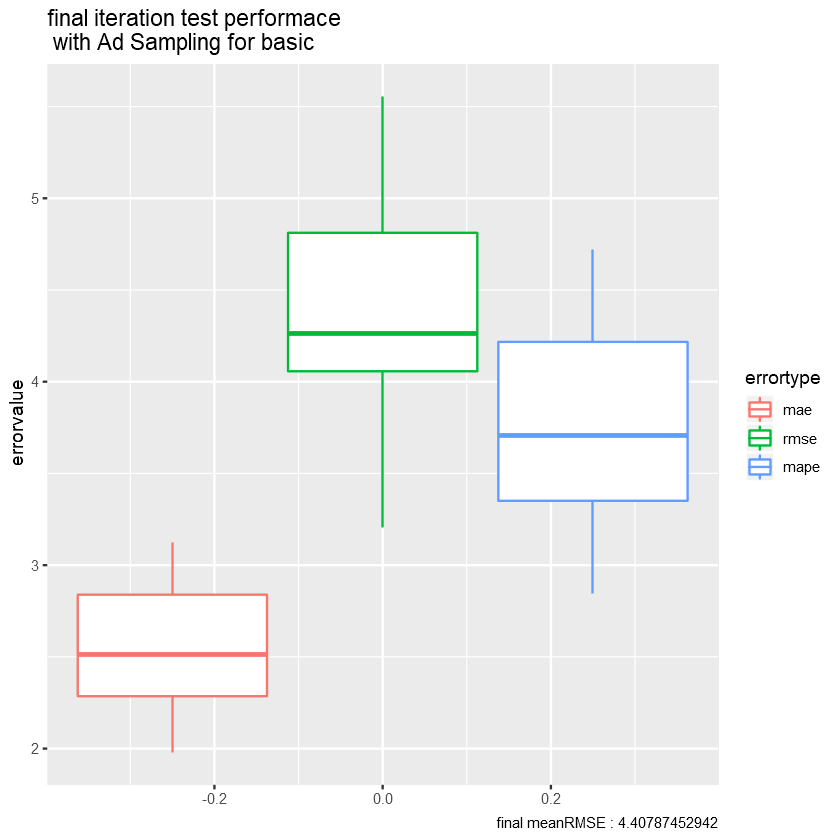

In [80]:
#### Overall BoxPlot ####
Ad_seq_bxp.1 = ggplot(data = performance_molten_Ad_seq.1[iter == 11], aes( y = errorvalue, group=errortype, col=errortype)) +
                    geom_boxplot(aes(colour = errortype)) +
                    labs( caption = paste0("final meanRMSE : ",mean(performance_table_Ad.1[iter == 11]$rmse))) +
                    ggtitle(paste0("final iteration test performace","\n"," with Ad Sampling for ",model.type.1))
                    
Ad_seq_bxp.1

In [81]:
boxplot.stats(performance_table_Ad.1[iter == 11]$rmse)

$stats
[1] 3.206474 4.053733 4.263984 4.815078 5.553280

$n
[1] 100

$conf
[1] 4.143692 4.384277

$out
numeric(0)

### Train Candidates

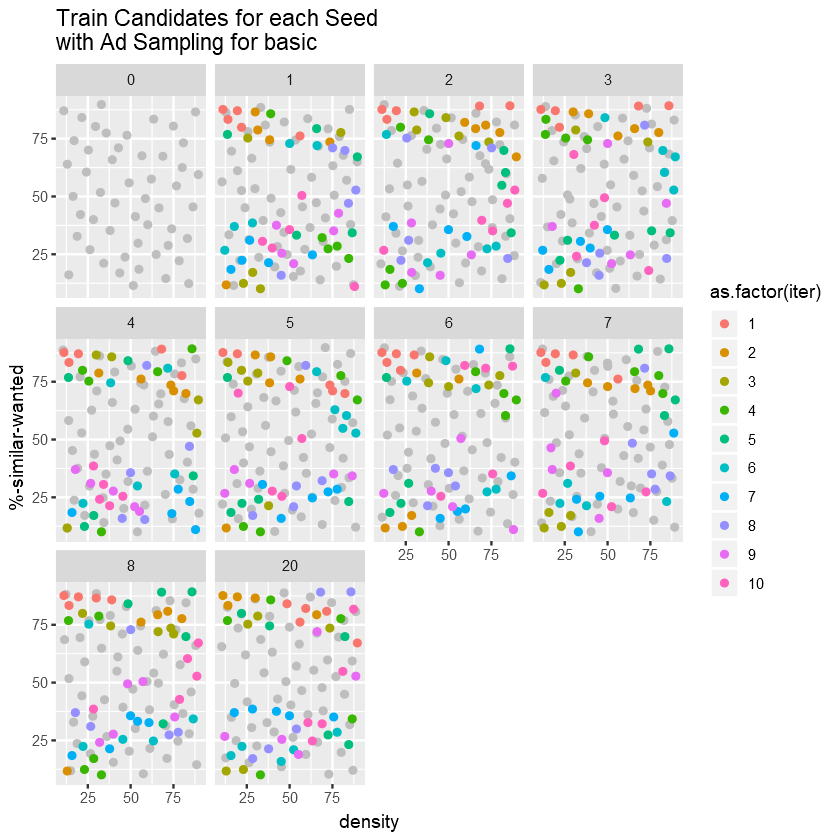

In [82]:
#### Train Candidates ####
tc_Ad_seq_plot.2 = ggplot(adaptive_initial_data.1, aes(x = density, y = `%-similar-wanted`)) +
                       geom_point(color = "grey") +
                       geom_point(data = train_candidates_Ad.1[rep == 10], aes(colour = as.factor(iter))) +
                       facet_wrap(~ seed) + 
                       labs(legend = "output") +
                       ggtitle(paste0("Train Candidates for each Seed","\n","with Ad Sampling for ",model.type.1))
tc_Ad_seq_plot.2

### Final Data

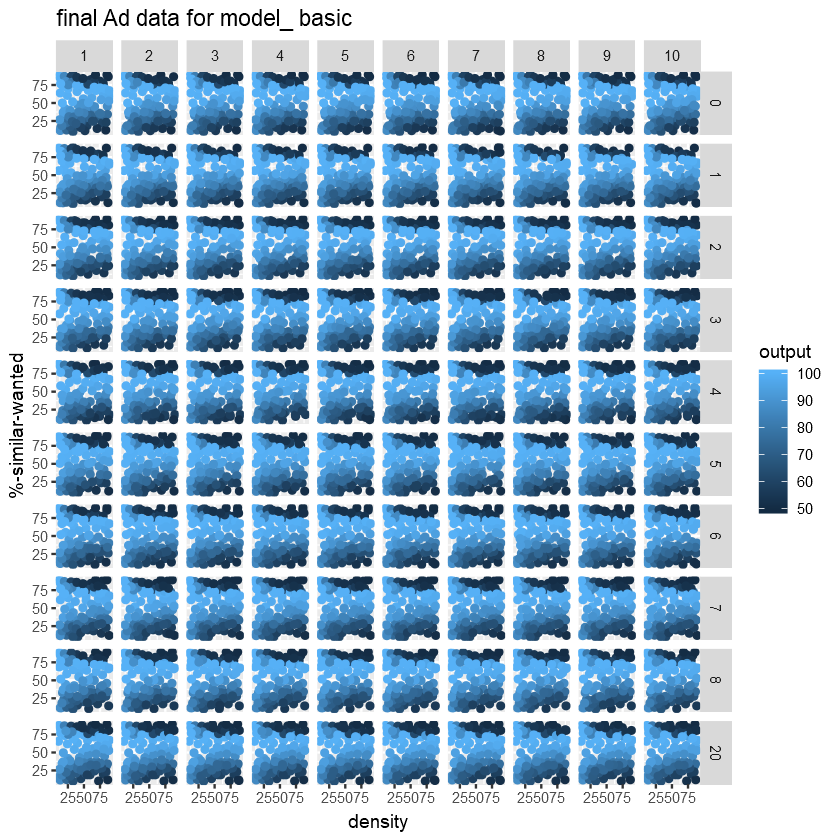

In [83]:
#### Final Data ####
final_train_data_Ad.1 = ggplot(data = FinalTrainData_Ad.1, aes(x = density, y = `%-similar-wanted`)) +
                           geom_point(aes(colour = output)) +
                           facet_grid(seed~rep) +
                            #facet_warp(~rep) +
                            #facet_warp(~seed) +
                           labs(legend = "output") +
                           ggtitle(paste0("final Ad data for model_ ",model.type.1))
final_train_data_Ad.1


## Model.2

In [84]:
#### Model.1 ####
Ad_path.2 = paste0(outputs.path.2,"Ad_sd/")

obb_error_Ad.2              = fread(paste0(Ad_path.2,model.type.2,"_obb_error_Ad",".csv"))
performance_table_Ad.2      = fread(paste0(Ad_path.2,model.type.2,"_performance_table_Ad",".csv"))
predictedLabels_Ad.2        = fread(paste0(Ad_path.2,model.type.2,"_predictedLabels_table_Ad",".csv"))
FinalTrainData_Ad.2         = fread(paste0(Ad_path.2,model.type.2,"_FinalTrainData_Ad",".csv"))
train_candidates_Ad.2       = fread(paste0(Ad_path.2,model.type.2,"_train_candidates_table_Ad",".csv"))

In [85]:
performance_molten_Ad_seq.2 <- melt(data = performance_table_Ad.2
                             , id.vars = c('iter',"seed","rep"))
setnames(performance_molten_Ad_seq.2, c("variable","value"),c("errortype","errorvalue"))

predictedLabels_molten_Ad_seq.2 <- melt(data = predictedLabels_Ad.2
                             , id.vars = c("density","%-similar-wanted",'output',"seed","rep")
                             , measure.vars = c("pred_output_1","pred_output_2","pred_output_3","pred_output_4","pred_output_5","pred_output_6","pred_output_7","pred_output_8","pred_output_9","pred_output_10","pred_output_11"))
setnames(predictedLabels_molten_Ad_seq.2, c("variable","value"),c("iter","pred_output"))
predictedLabels_molten_Ad_seq.2[,iter := as.numeric(str_sub(iter, 13))]

### oob error 

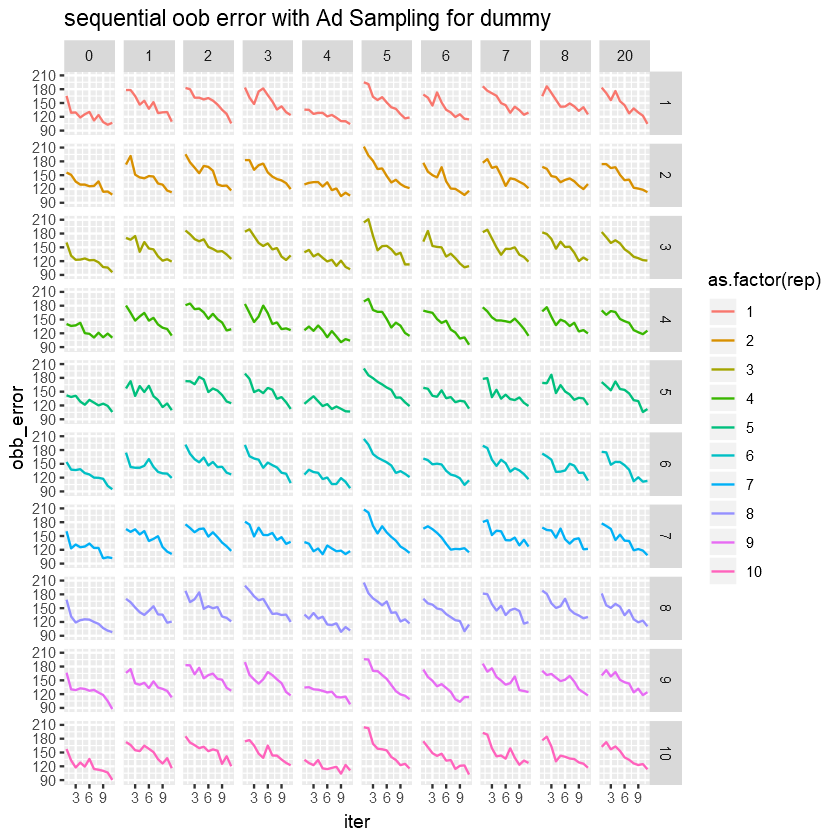

In [86]:
#### oob error ####
oob_Ad_seq_plot.2 = ggplot(obb_error_Ad.2, aes(x=iter, y = obb_error)) + 
                geom_line( aes(color = as.factor(rep))) + 
                facet_grid(rep ~ seed) +
                ggtitle(paste0("sequential oob error with Ad Sampling for ",model.type.2)) 
oob_Ad_seq_plot.2

### test error 

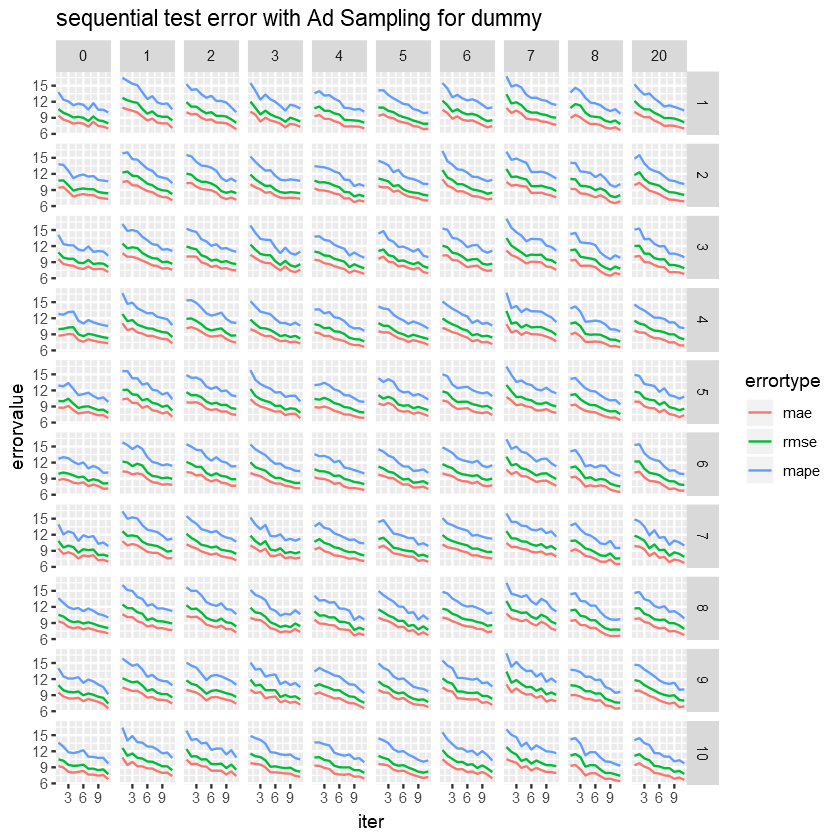

In [87]:
#### test error ####
test_error_Ad_seq_plot.2 = ggplot(performance_molten_Ad_seq.2, aes(x=iter,y = errorvalue, group=errortype, col=errortype)) + 
                            geom_line() + 
                            facet_grid(rep ~ seed) +
                            ggtitle(paste0("sequential test error with Ad Sampling for ",model.type.2)) 
test_error_Ad_seq_plot.2

### Actual vs Fitted 

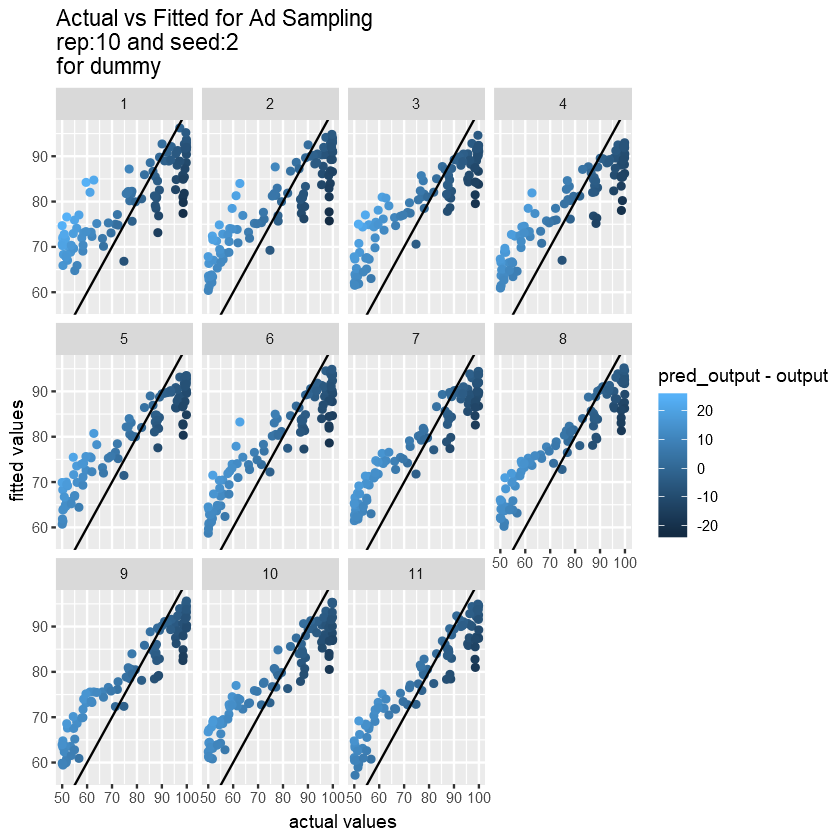

In [88]:
#### Actual vs Fitted ####
slct_rep = 10
slct_seed= 2
a_vs_f_Ad_seq.2 <- ggplot(predictedLabels_molten_Ad_seq.2[rep == slct_rep & seed == slct_seed]
                 ,aes(x = output, y =pred_output, color = pred_output - output)) +
            geom_point() +
            geom_abline() +
            facet_wrap( ~ iter) +
            xlab("actual values") +
            ylab("fitted values") +
            ggtitle(paste0("Actual vs Fitted for Ad Sampling","\n","rep:",slct_rep," and seed:",slct_seed,"\n","for ",model.type.2)) 

a_vs_f_Ad_seq.2


### Replications on Each Iteration 

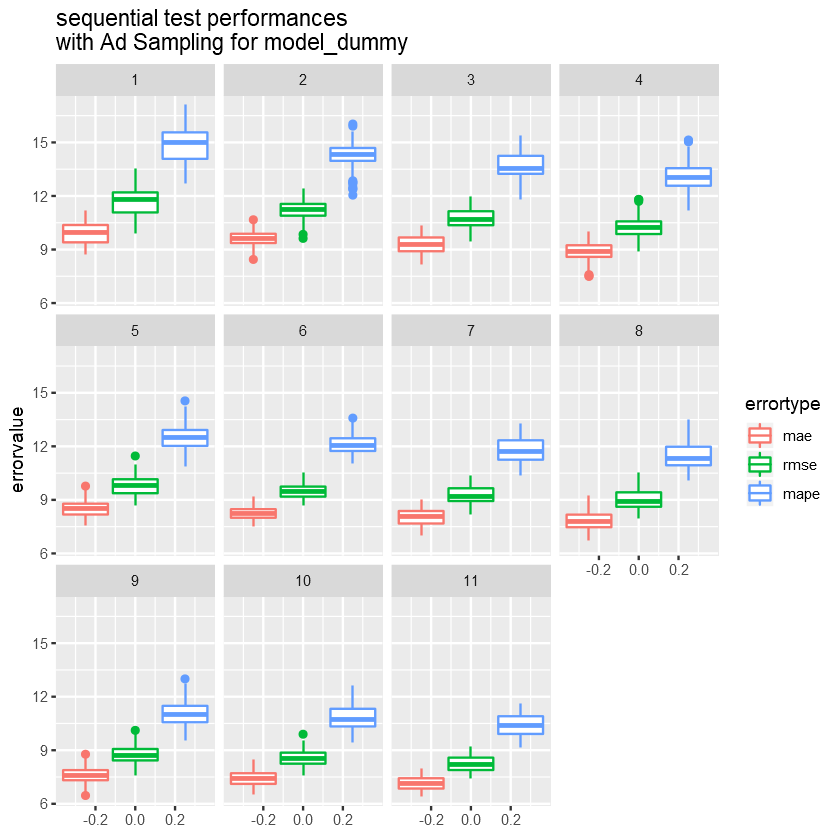

In [89]:
#### Replications on Each Iteration ####
# Observe the boxplots in each iterations
Ad_seq_ind_bxp.2 = ggplot(performance_molten_Ad_seq.2, aes(y = errorvalue, group=errortype, col=errortype)) + 
                  geom_boxplot()+
                  facet_wrap(~iter) +
                #  geom_hline(data = performance_molten_oneshot, aes(yintercept = errorvalue, group=errortype, col=errortype),stat = "hline", linetype = "dashed") +
                  ggtitle(paste0("sequential test performances","\n","with Ad Sampling for model_",model.type.2))
Ad_seq_ind_bxp.2


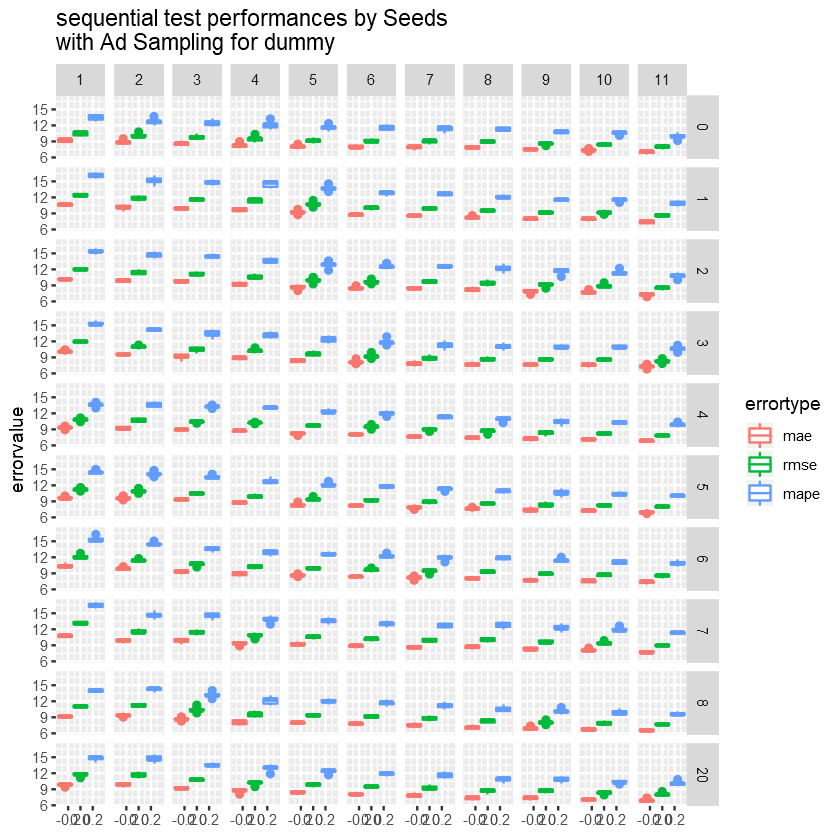

In [90]:
Ad_seq_ind_bxp_seed.2 = ggplot(performance_molten_Ad_seq.2
                               , aes(y = errorvalue, group = errortype, col = errortype)) + 
                            geom_boxplot() + 
                            facet_grid(seed ~ iter ) + 
                            ggtitle(paste0("sequential test performances by Seeds","\n","with Ad Sampling for ",model.type.2))
Ad_seq_ind_bxp_seed.2

### Overall BoxPlot 

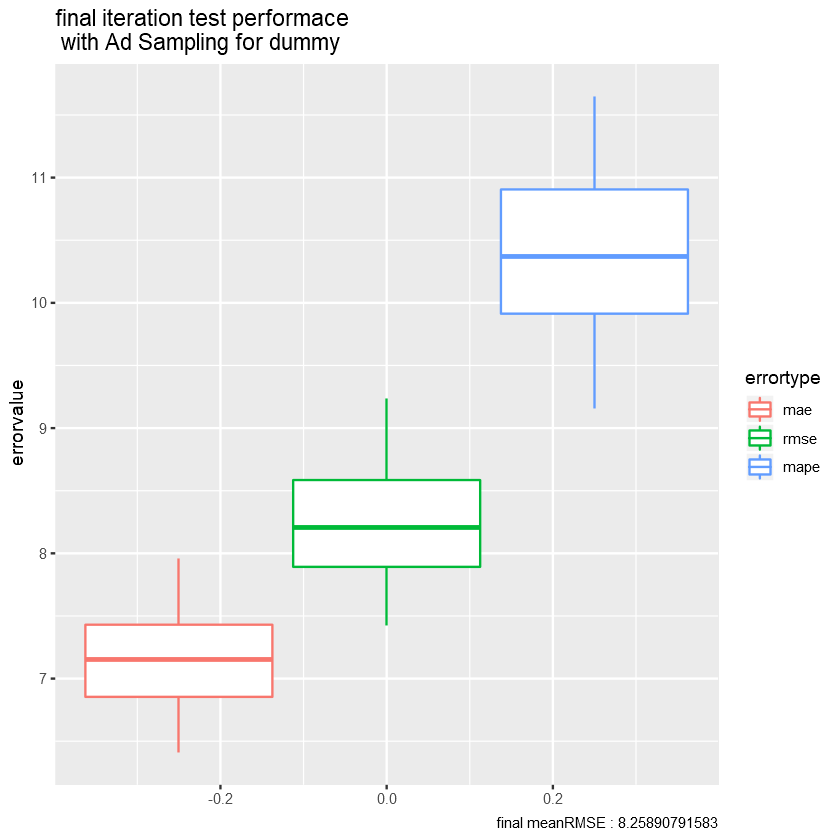

In [91]:
#### Overall BoxPlot ####
Ad_seq_bxp.2 = ggplot(data = performance_molten_Ad_seq.2[iter == 11], aes( y = errorvalue, group=errortype, col=errortype)) +
                    geom_boxplot(aes(colour = errortype)) +
                    labs( caption = paste0("final meanRMSE : ",mean(performance_table_Ad.2[iter == 11]$rmse))) +
                    ggtitle(paste0("final iteration test performace","\n"," with Ad Sampling for ",model.type.2))
                    
Ad_seq_bxp.2

In [92]:
boxplot.stats(performance_table_Ad.2[iter == 11]$rmse)

$stats
[1] 7.422622 7.886126 8.208377 8.592484 9.235862

$n
[1] 100

$conf
[1] 8.096772 8.319981

$out
numeric(0)

### Train Candidates

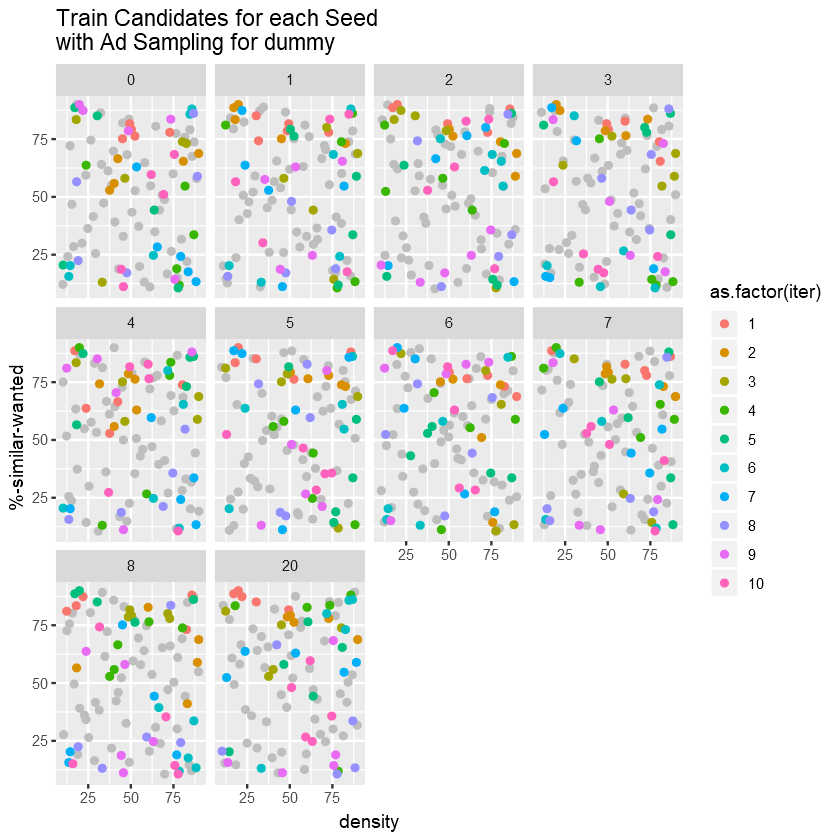

In [93]:
#### Train Candidates ####
tc_Ad_seq_plot.2 = ggplot(adaptive_initial_data.2, aes(x = density, y = `%-similar-wanted`)) +
               geom_point(color = "grey") +
               geom_point(data = train_candidates_Ad.2[rep == 10], aes(colour = as.factor(iter))) +
               facet_wrap(~ seed) + 
               labs(legend = "output") +
               ggtitle(paste0("Train Candidates for each Seed","\n","with Ad Sampling for ",model.type.2))
tc_Ad_seq_plot.2

### Final Data ####

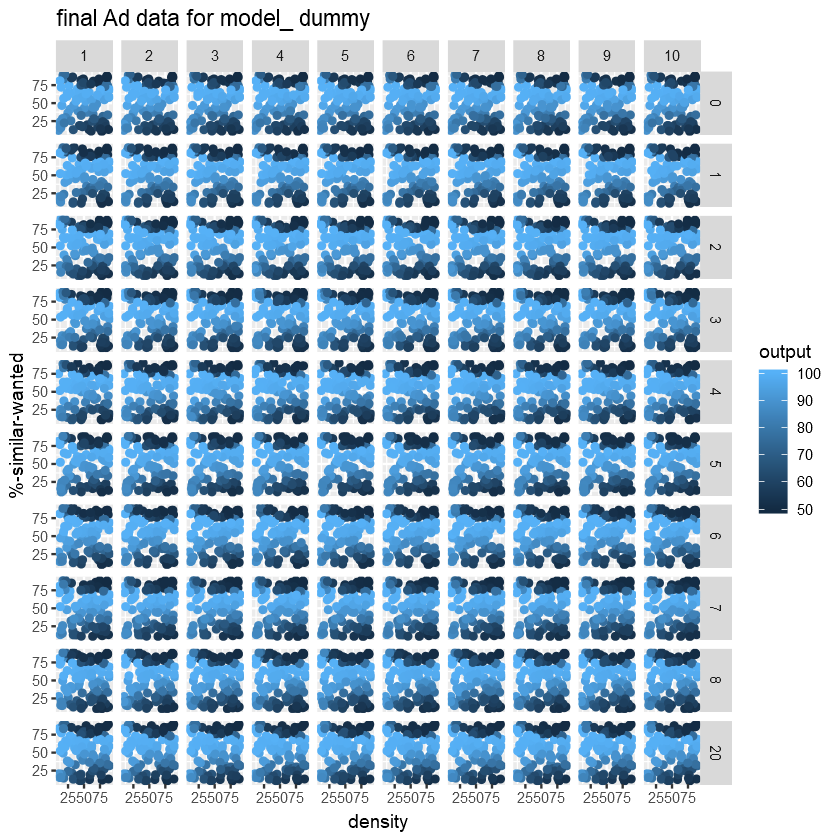

In [94]:
#### Final Data ####
final_train_data_Ad.2 = ggplot(data = FinalTrainData_Ad.2, aes(x = density, y = `%-similar-wanted`)) +
                           geom_point(aes(colour = output)) +
                           facet_grid(seed~rep) +
                            #facet_warp(~rep) +
                            #facet_warp(~seed) +
                           labs(legend = "output") +
                           ggtitle(paste0("final Ad data for model_ ",model.type.2))
final_train_data_Ad.2

## Model.1 vs Model.2

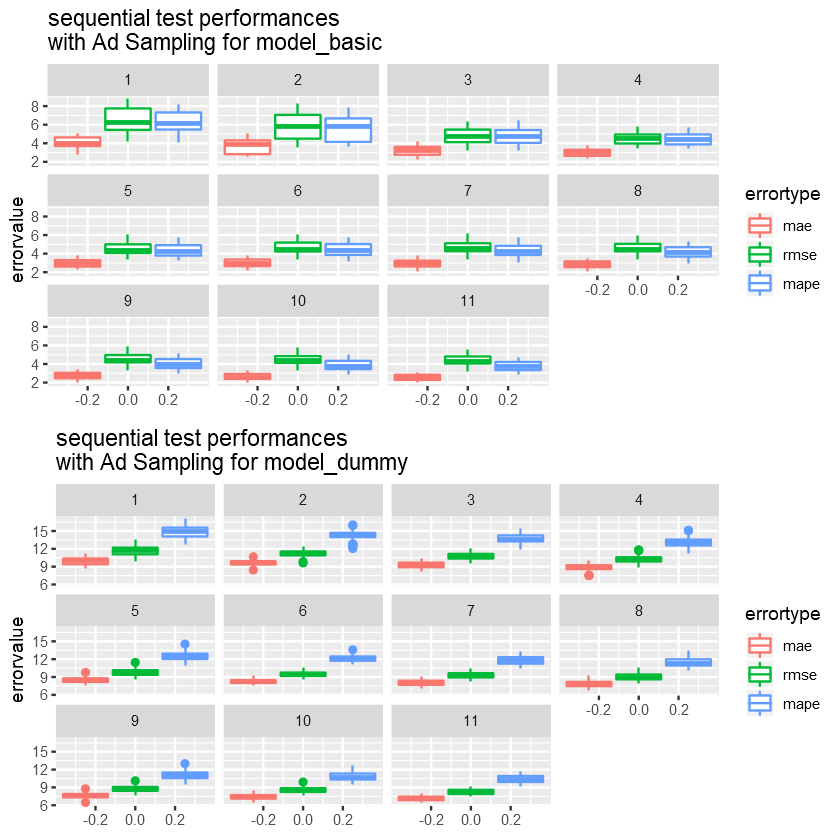

In [95]:
grid.arrange(Ad_seq_ind_bxp.1,Ad_seq_ind_bxp.2)

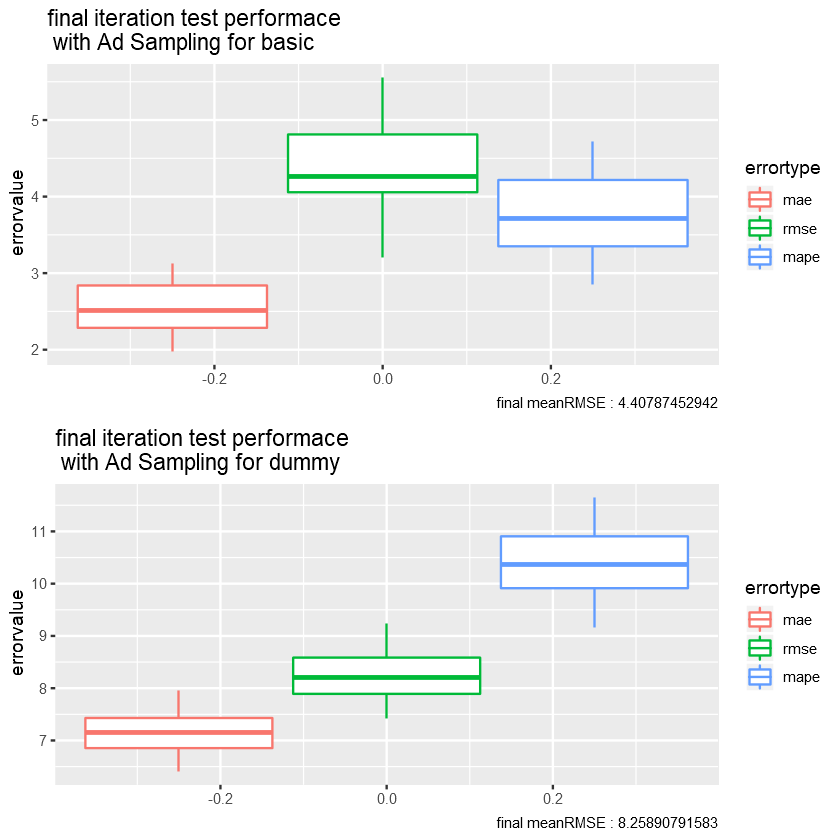

In [96]:
grid.arrange(Ad_seq_bxp.1,Ad_seq_bxp.2)

# 3 Scenarios

## Model.1

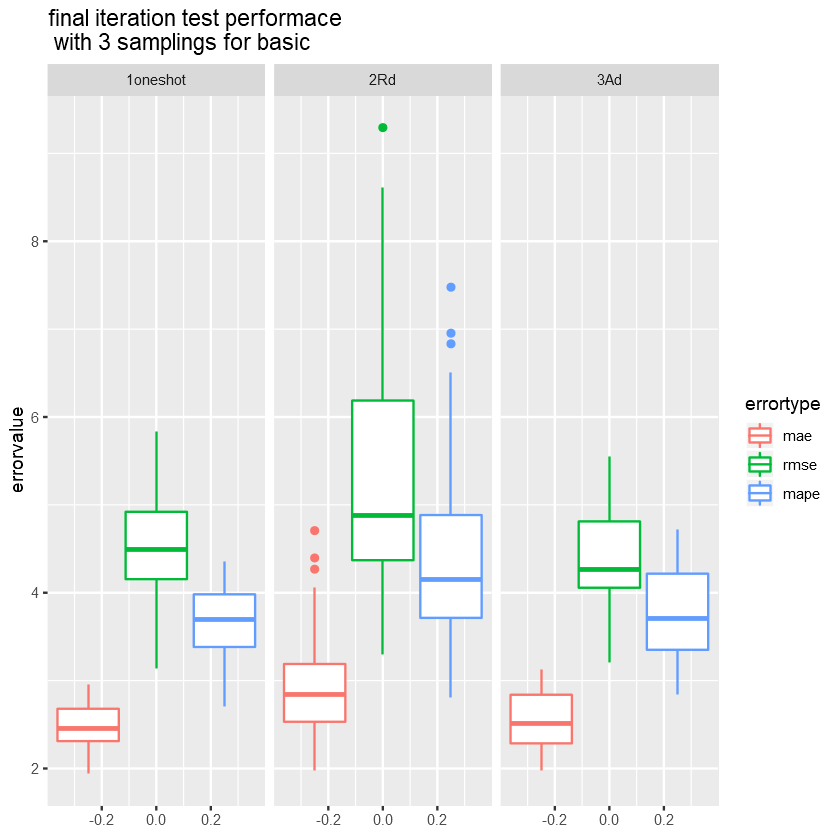

In [97]:
#### all BoxPlot ####
all_bxp.1 = ggplot(data = rbind(data.table(performance_molten_Ad_seq.1[iter == 11], sampling = "3Ad")
                                   ,data.table(performance_molten_Rd_seq.1[iter == 11], sampling = "2Rd")
                                   ,data.table(performance_molten_oneshot.1, sampling = "1oneshot"))
                    , aes( y = errorvalue, group=errortype, col=errortype)) +
                    facet_wrap(~sampling) +
                    geom_boxplot(aes(colour = errortype)) +
                    ggtitle(paste0("final iteration test performace","\n"," with 3 samplings for ",model.type.1))
                    
all_bxp.1

## Model.2

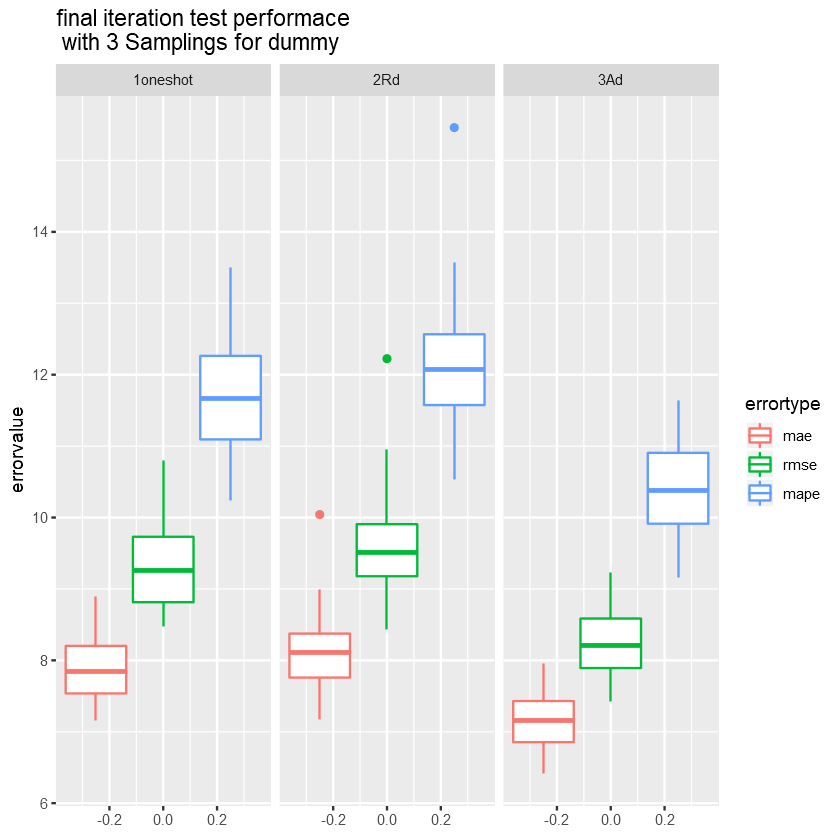

In [98]:
#### all BoxPlot ####
all_bxp.2 = ggplot(data = rbind(data.table(performance_molten_Ad_seq.2[iter == 11], sampling = "3Ad")
                                   ,data.table(performance_molten_Rd_seq.2[iter == 11], sampling = "2Rd")
                                   ,data.table(performance_molten_oneshot.2, sampling = "1oneshot"))
                    , aes( y = errorvalue, group=errortype, col=errortype)) +
                    facet_wrap(~sampling) +
                    geom_boxplot(aes(colour = errortype)) +
                    ggtitle(paste0("final iteration test performace","\n"," with 3 Samplings for ",model.type.2))
                    
all_bxp.2

# Adaptive Sampling Replications With Range

In [99]:
#### Adaptive Sampling  With Range ####

## Model.1

In [100]:
#### Model.1 ####
Ad_range_path.1 = paste0(outputs.path.1,"Ad_range/")

obb_error_Ad_range.1              = fread(paste0(Ad_range_path.1,model.type.1,"_obb_error_Ad",".csv"))
performance_table_Ad_range.1      = fread(paste0(Ad_range_path.1,model.type.1,"_performance_table_Ad",".csv"))
predictedLabels_Ad_range.1        = fread(paste0(Ad_range_path.1,model.type.1,"_predictedLabels_table_Ad",".csv"))
FinalTrainData_Ad_range.1         = fread(paste0(Ad_range_path.1,model.type.1,"_FinalTrainData_Ad",".csv"))
train_candidates_Ad_range.1       = fread(paste0(Ad_range_path.1,model.type.1,"_train_candidates_table_Ad",".csv"))

In [101]:
performance_molten_Ad_range_seq.1 <- melt(data = performance_table_Ad_range.1
                             , id.vars = c('iter',"seed","rep"))
setnames(performance_molten_Ad_range_seq.1, c("variable","value"),c("errortype","errorvalue"))

predictedLabels_molten_Ad_range_seq.1 <- melt(data = predictedLabels_Ad_range.1
                             , id.vars = c("density","%-similar-wanted",'output',"seed","rep")
                             , measure.vars = c("pred_output_1","pred_output_2","pred_output_3","pred_output_4","pred_output_5","pred_output_6","pred_output_7","pred_output_8","pred_output_9","pred_output_10","pred_output_11"))
setnames(predictedLabels_molten_Ad_range_seq.1, c("variable","value"),c("iter","pred_output"))
predictedLabels_molten_Ad_range_seq.1[,iter := as.numeric(str_sub(iter, 13))]


### oob error

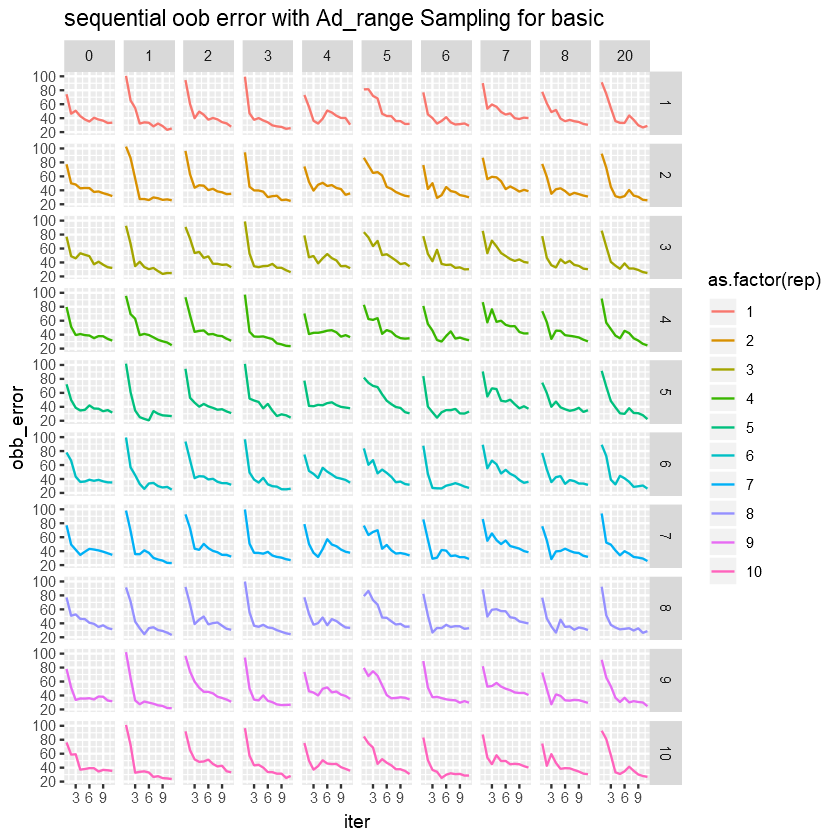

In [102]:
#### oob error ####
oob_Ad_range_seq_plot.1 = ggplot(obb_error_Ad_range.1, aes(x=iter, y = obb_error)) + 
                geom_line( aes(color = as.factor(rep))) + 
                facet_grid(rep ~ seed) +
                ggtitle(paste0("sequential oob error with Ad_range Sampling for ",model.type.1)) 
oob_Ad_range_seq_plot.1

### test error

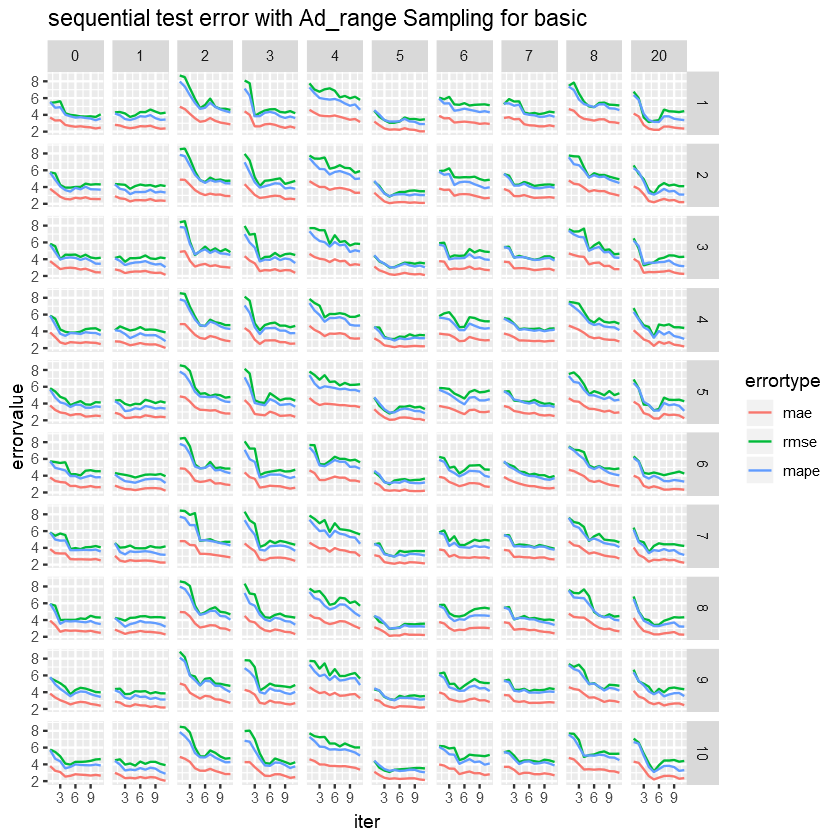

In [103]:
#### test error ####
test_error_Ad_range_seq_plot.1 = ggplot(performance_molten_Ad_range_seq.1, aes(x=iter,y = errorvalue, group=errortype, col=errortype)) + 
                            geom_line() + 
                            facet_grid(rep ~ seed) +
                            ggtitle(paste0("sequential test error with Ad_range Sampling for ",model.type.1)) 
test_error_Ad_range_seq_plot.1

### Actual vs Fitted

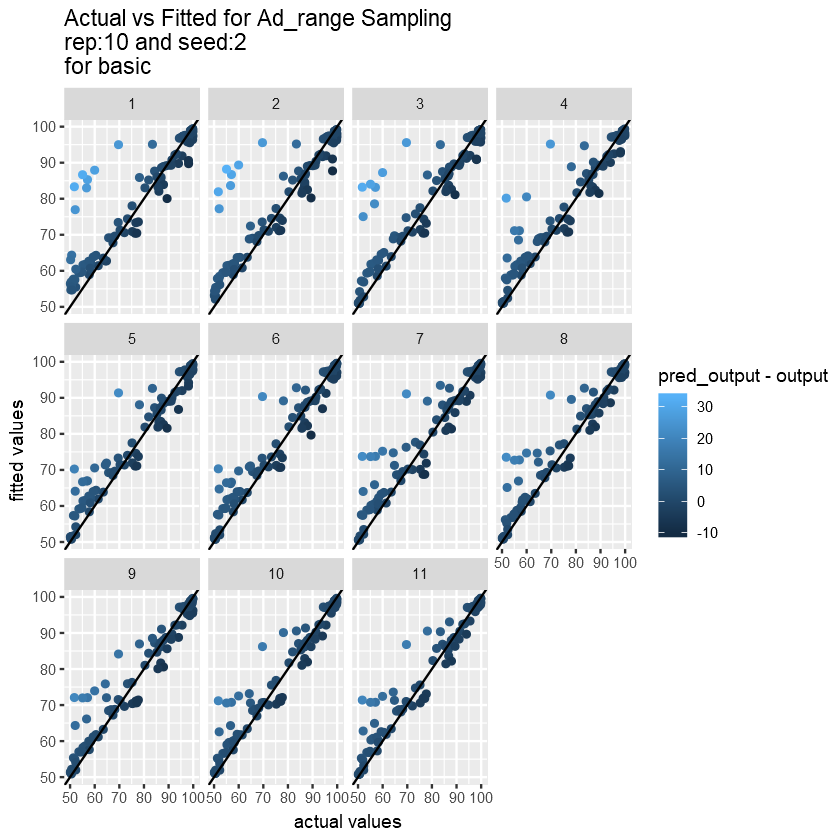

In [104]:
#### Actual vs Fitted ####
# The last iteration(pred_output_11) on the 10th replication
slct_rep = 10
slct_seed= 2
a_vs_f_Ad_range_seq.1 <- ggplot(predictedLabels_molten_Ad_range_seq.1[rep == slct_rep & seed == slct_seed]
                 ,aes(x = output, y =pred_output, color = pred_output - output)) +
            geom_point() +
            geom_abline() +
            facet_wrap( ~ iter) +
            xlab("actual values") +
            ylab("fitted values") +
            ggtitle(paste0("Actual vs Fitted for Ad_range Sampling ","\n","rep:",slct_rep," and seed:",slct_seed,"\n","for ",model.type.1)) 

a_vs_f_Ad_range_seq.1

### Replications on Each Iteration

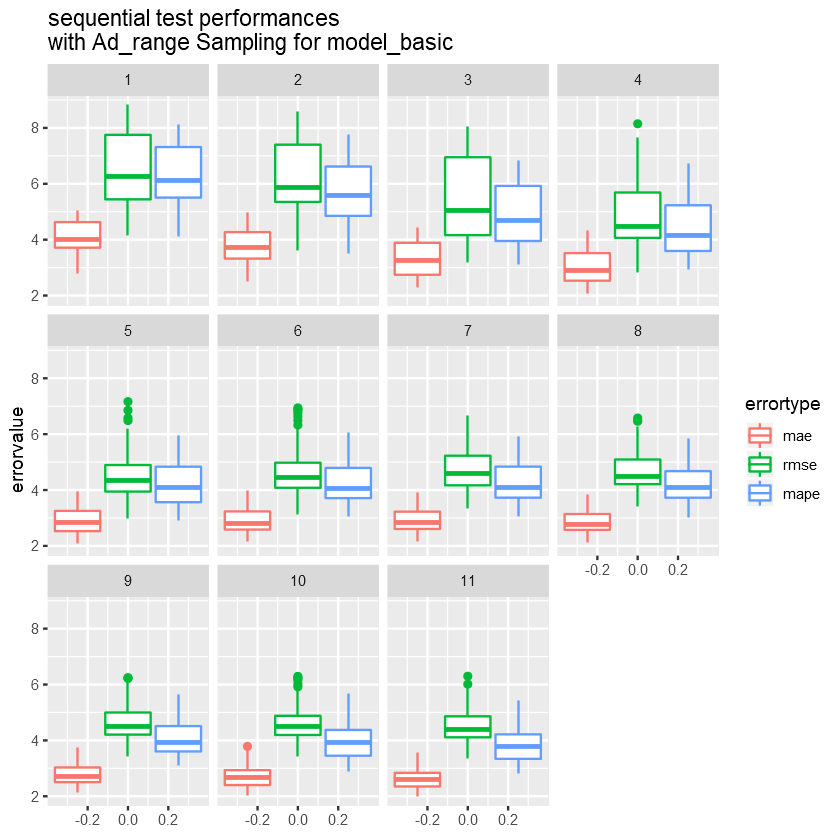

In [105]:
#### Replications on Each Iteration ####
# Observe the boxplots in each iterations
Ad_range_seq_ind_bxp.1 = ggplot(performance_molten_Ad_range_seq.1, aes(y = errorvalue, group=errortype, col=errortype)) + 
                  geom_boxplot()+
                  facet_wrap(~iter) +
                #  geom_hline(data = performance_molten_oneshot, aes(yintercept = errorvalue, group=errortype, col=errortype),stat = "hline", linetype = "dashed") +
                  ggtitle(paste0("sequential test performances","\n","with Ad_range Sampling for model_",model.type.1))
Ad_range_seq_ind_bxp.1

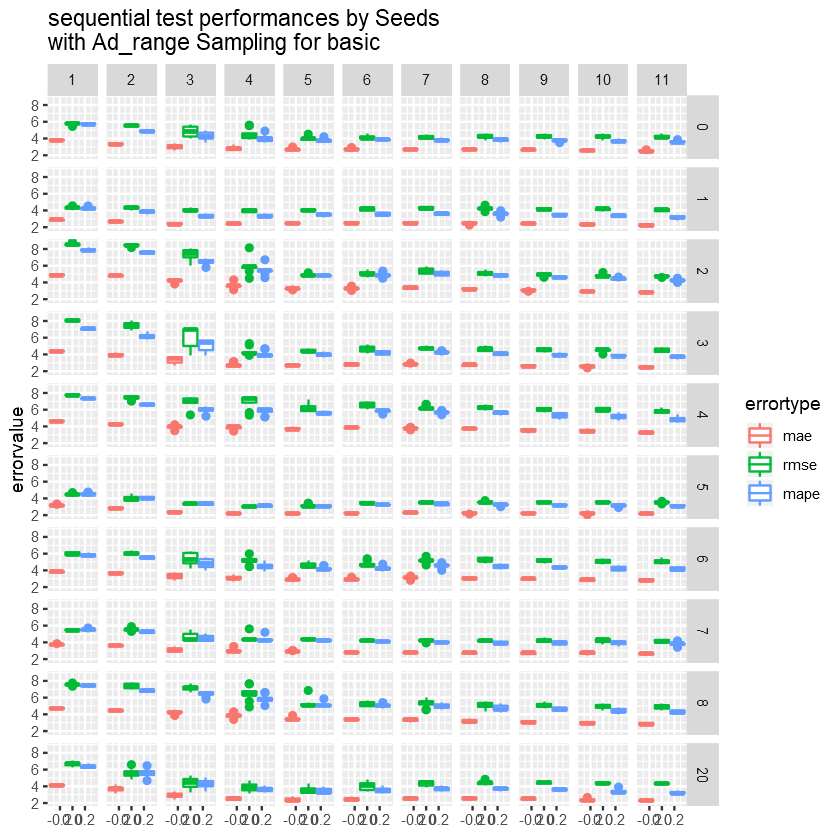

In [106]:
Ad_range_seq_ind_bxp_seed.1 = ggplot(performance_molten_Ad_range_seq.1
                               , aes(y = errorvalue, group = errortype, col = errortype)) + 
                            geom_boxplot() + 
                            facet_grid(seed ~ iter ) + 
                            ggtitle(paste0("sequential test performances by Seeds","\n","with Ad_range Sampling for ",model.type.1))
Ad_range_seq_ind_bxp_seed.1

### Overall BoxPlot

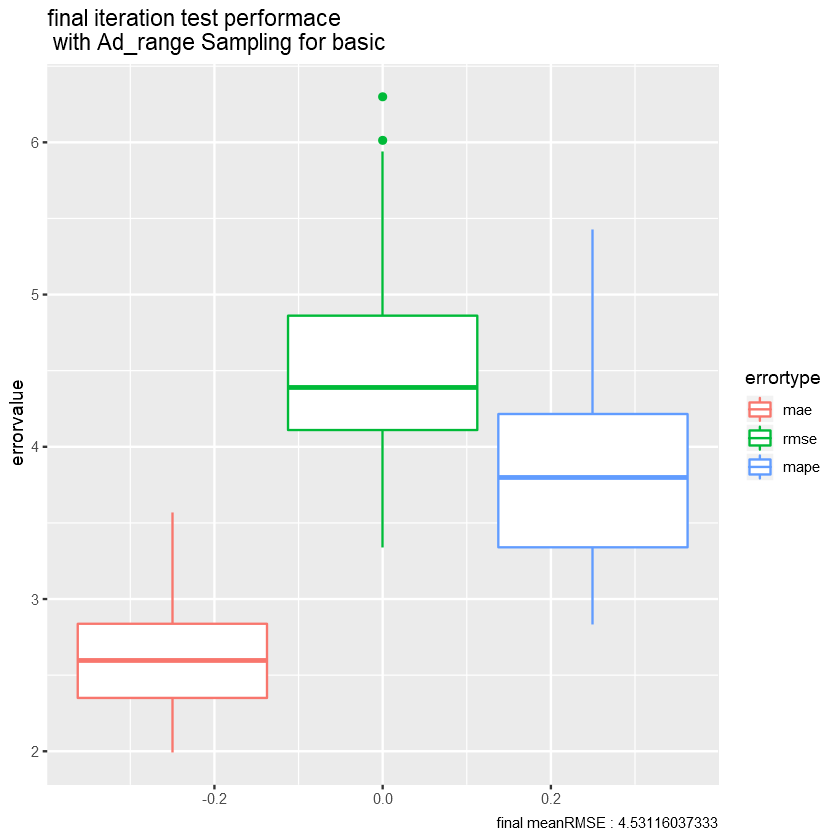

In [107]:
#### Overall BoxPlot ####
Ad_range_seq_bxp.1 = ggplot(data = performance_molten_Ad_range_seq.1[iter == 11], aes( y = errorvalue, group=errortype, col=errortype)) +
                    geom_boxplot(aes(colour = errortype)) +
                    labs( caption = paste0("final meanRMSE : ",mean(performance_table_Ad_range.1[iter == 11]$rmse))) +
                    ggtitle(paste0("final iteration test performace","\n"," with Ad_range Sampling for ",model.type.1))
                    
Ad_range_seq_bxp.1

In [108]:
boxplot.stats(performance_table_Ad_range.1[iter == 11]$rmse)

$stats
[1] 3.340618 4.108783 4.390882 4.861971 5.942415

$n
[1] 100

$conf
[1] 4.271879 4.509886

$out
[1] 6.299481 6.013383

### Train Candidates

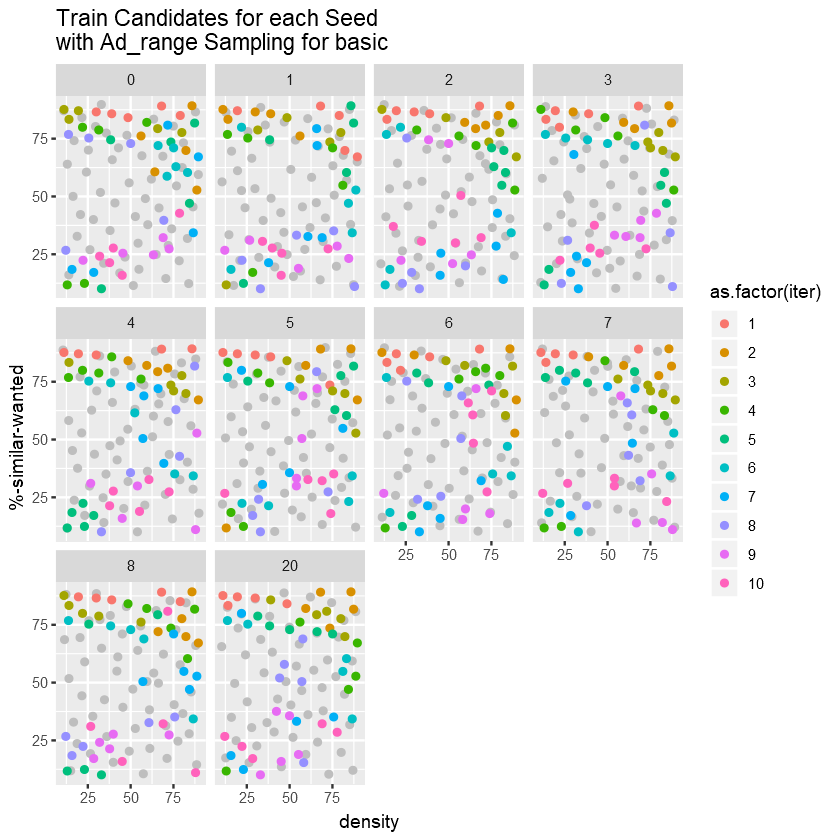

In [109]:
#### Train Candidates ####
tc_Ad_range_seq_plot.2 = ggplot(adaptive_initial_data.1, aes(x = density, y = `%-similar-wanted`)) +
                       geom_point(color = "grey") +
                       geom_point(data = train_candidates_Ad_range.1[rep == 10], aes(colour = as.factor(iter))) +
                       facet_wrap(~ seed) + 
                       labs(legend = "output") +
                       ggtitle(paste0("Train Candidates for each Seed","\n","with Ad_range Sampling for ",model.type.1))
tc_Ad_range_seq_plot.2

### Final Data

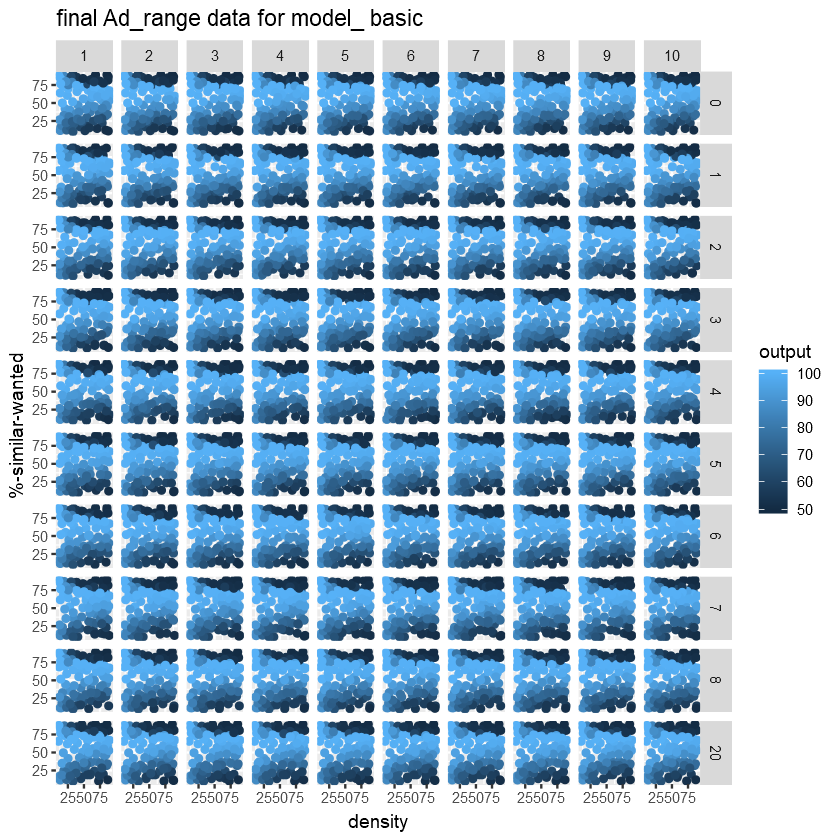

In [110]:
#### Final Data ####
final_train_data_Ad_range.1 = ggplot(data = FinalTrainData_Ad_range.1, aes(x = density, y = `%-similar-wanted`)) +
                           geom_point(aes(colour = output)) +
                           facet_grid(seed~rep) +
                            #facet_warp(~rep) +
                            #facet_warp(~seed) +
                           labs(legend = "output") +
                           ggtitle(paste0("final Ad_range data for model_ ",model.type.1))
final_train_data_Ad_range.1


## Model.2

In [111]:
#### Model.2 ####
Ad_range_path.2 = paste0(outputs.path.2,"Ad_range/")

obb_error_Ad_range.2              = fread(paste0(Ad_range_path.2,model.type.2,"_obb_error_Ad",".csv"))
performance_table_Ad_range.2      = fread(paste0(Ad_range_path.2,model.type.2,"_performance_table_Ad",".csv"))
predictedLabels_Ad_range.2        = fread(paste0(Ad_range_path.2,model.type.2,"_predictedLabels_table_Ad",".csv"))
FinalTrainData_Ad_range.2         = fread(paste0(Ad_range_path.2,model.type.2,"_FinalTrainData_Ad",".csv"))
train_candidates_Ad_range.2       = fread(paste0(Ad_range_path.2,model.type.2,"_train_candidates_table_Ad",".csv"))

In [112]:
performance_molten_Ad_range_seq.2 <- melt(data = performance_table_Ad_range.2
                             , id.vars = c('iter',"seed","rep"))
setnames(performance_molten_Ad_range_seq.2, c("variable","value"),c("errortype","errorvalue"))

predictedLabels_molten_Ad_range_seq.2 <- melt(data = predictedLabels_Ad_range.2
                             , id.vars = c("density","%-similar-wanted",'output',"seed","rep")
                             , measure.vars = c("pred_output_1","pred_output_2","pred_output_3","pred_output_4","pred_output_5","pred_output_6","pred_output_7","pred_output_8","pred_output_9","pred_output_10","pred_output_11"))
setnames(predictedLabels_molten_Ad_range_seq.2, c("variable","value"),c("iter","pred_output"))
predictedLabels_molten_Ad_range_seq.2[,iter := as.numeric(str_sub(iter, 13))]

### oob error 

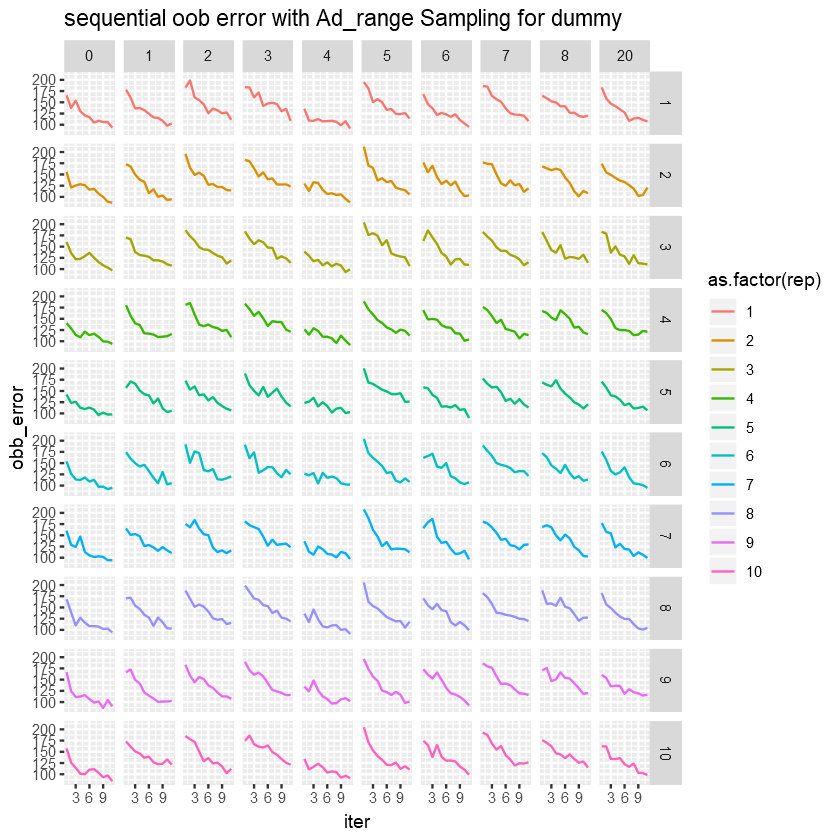

In [113]:
#### oob error ####
oob_Ad_range_seq_plot.2 = ggplot(obb_error_Ad_range.2, aes(x=iter, y = obb_error)) + 
                geom_line( aes(color = as.factor(rep))) + 
                facet_grid(rep ~ seed) +
                ggtitle(paste0("sequential oob error with Ad_range Sampling for ",model.type.2)) 
oob_Ad_range_seq_plot.2

### test error 

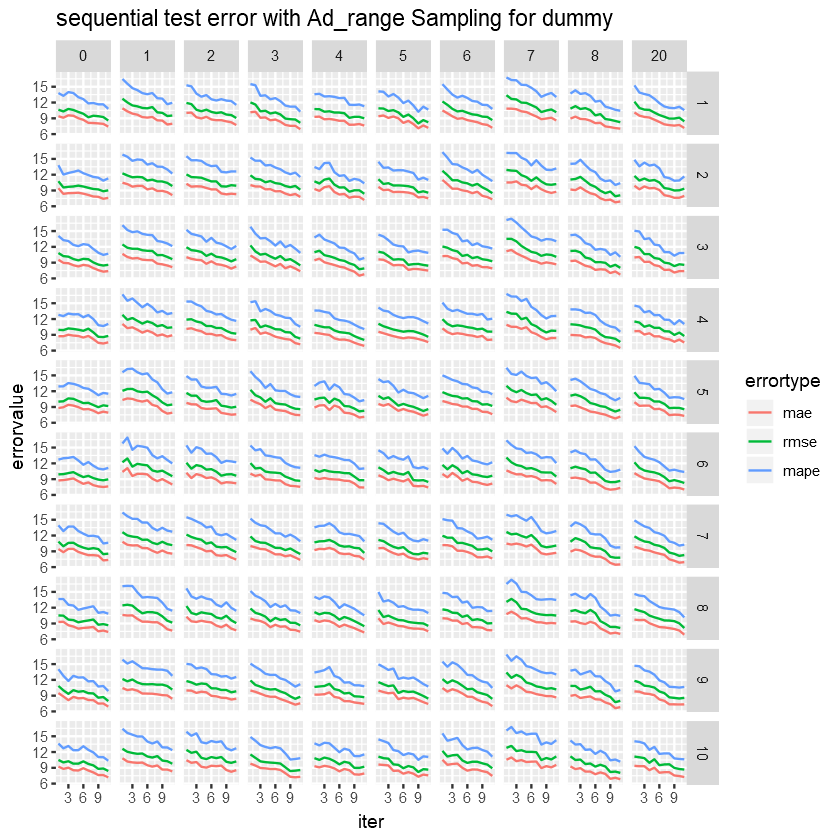

In [114]:
#### test error ####
test_error_Ad_range_seq_plot.2 = ggplot(performance_molten_Ad_range_seq.2, aes(x=iter,y = errorvalue, group=errortype, col=errortype)) + 
                            geom_line() + 
                            facet_grid(rep ~ seed) +
                            ggtitle(paste0("sequential test error with Ad_range Sampling for ",model.type.2)) 
test_error_Ad_range_seq_plot.2

### Actual vs Fitted 

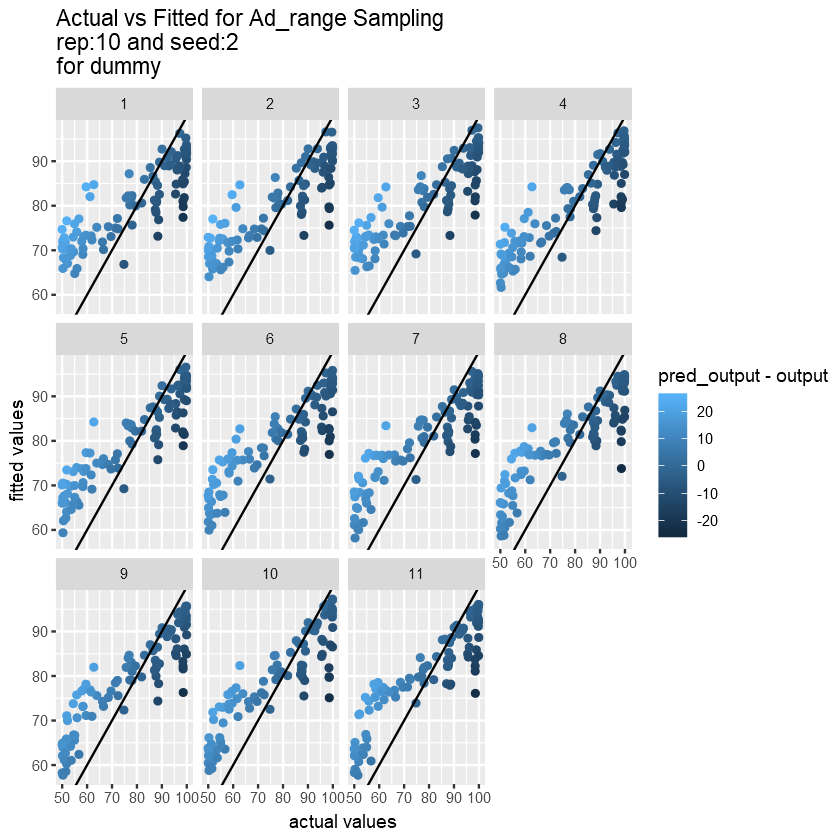

In [115]:
#### Actual vs Fitted ####
slct_rep = 10
slct_seed= 2
a_vs_f_Ad_range_seq.2 <- ggplot(predictedLabels_molten_Ad_range_seq.2[rep == slct_rep & seed == slct_seed]
                 ,aes(x = output, y =pred_output, color = pred_output - output)) +
            geom_point() +
            geom_abline() +
            facet_wrap( ~ iter) +
            xlab("actual values") +
            ylab("fitted values") +
            ggtitle(paste0("Actual vs Fitted for Ad_range Sampling","\n","rep:",slct_rep," and seed:",slct_seed,"\n","for ",model.type.2)) 

a_vs_f_Ad_range_seq.2


### Replications on Each Iteration 

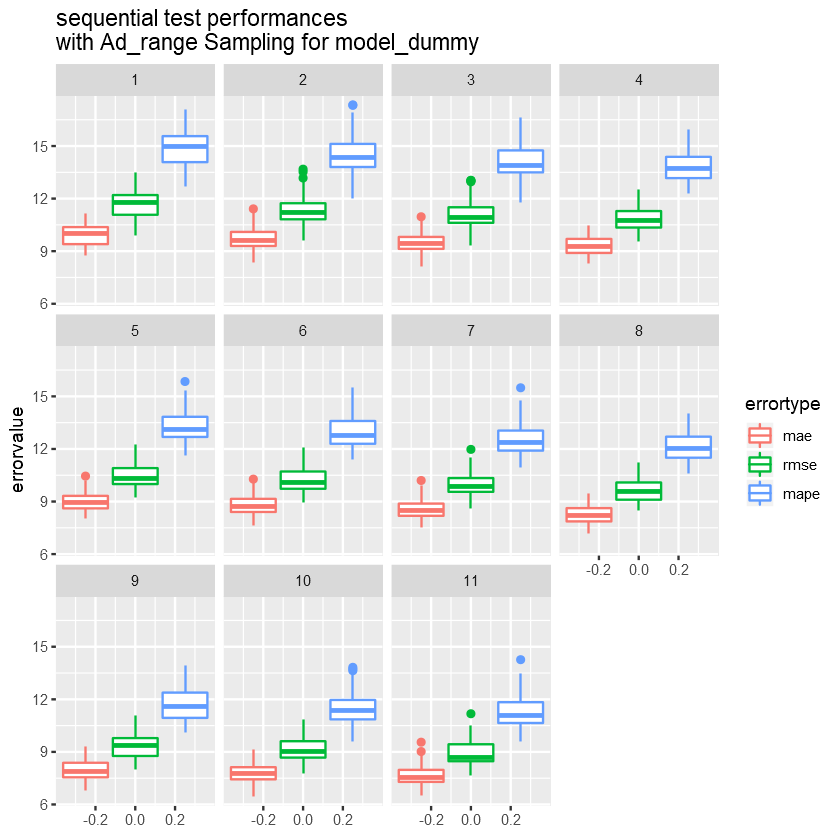

In [116]:
#### Replications on Each Iteration ####
# Observe the boxplots in each iterations
Ad_range_seq_ind_bxp.2 = ggplot(performance_molten_Ad_range_seq.2, aes(y = errorvalue, group=errortype, col=errortype)) + 
                  geom_boxplot()+
                  facet_wrap(~iter) +
                #  geom_hline(data = performance_molten_oneshot, aes(yintercept = errorvalue, group=errortype, col=errortype),stat = "hline", linetype = "dashed") +
                  ggtitle(paste0("sequential test performances","\n","with Ad_range Sampling for model_",model.type.2))
Ad_range_seq_ind_bxp.2


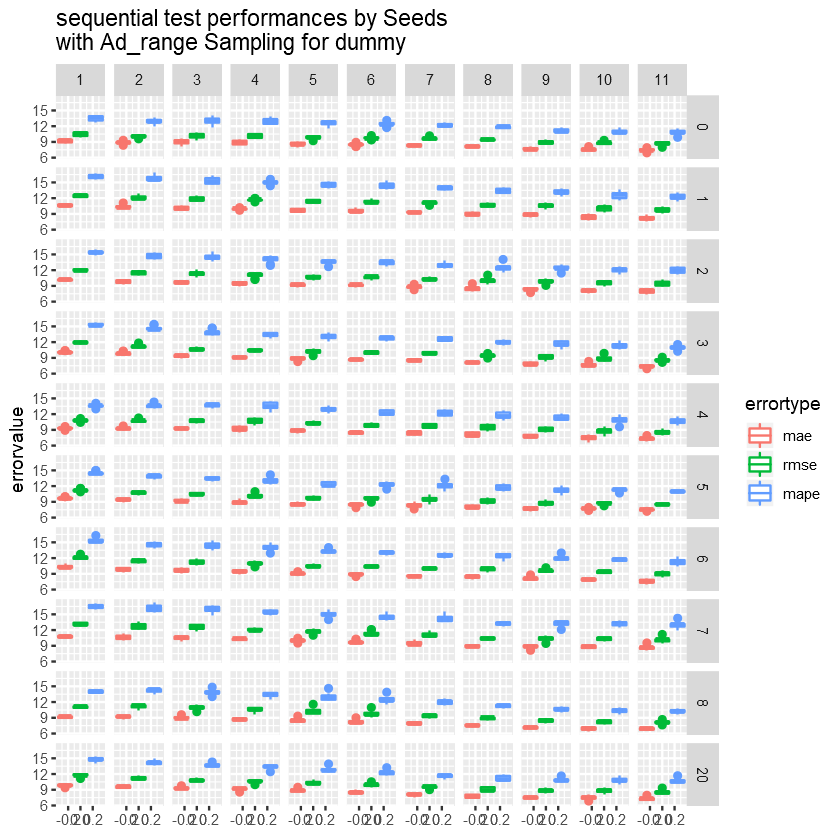

In [117]:
Ad_range_seq_ind_bxp_seed.2 = ggplot(performance_molten_Ad_range_seq.2
                               , aes(y = errorvalue, group = errortype, col = errortype)) + 
                            geom_boxplot() + 
                            facet_grid(seed ~ iter ) + 
                            ggtitle(paste0("sequential test performances by Seeds","\n","with Ad_range Sampling for ",model.type.2))
Ad_range_seq_ind_bxp_seed.2

### Overall BoxPlot 

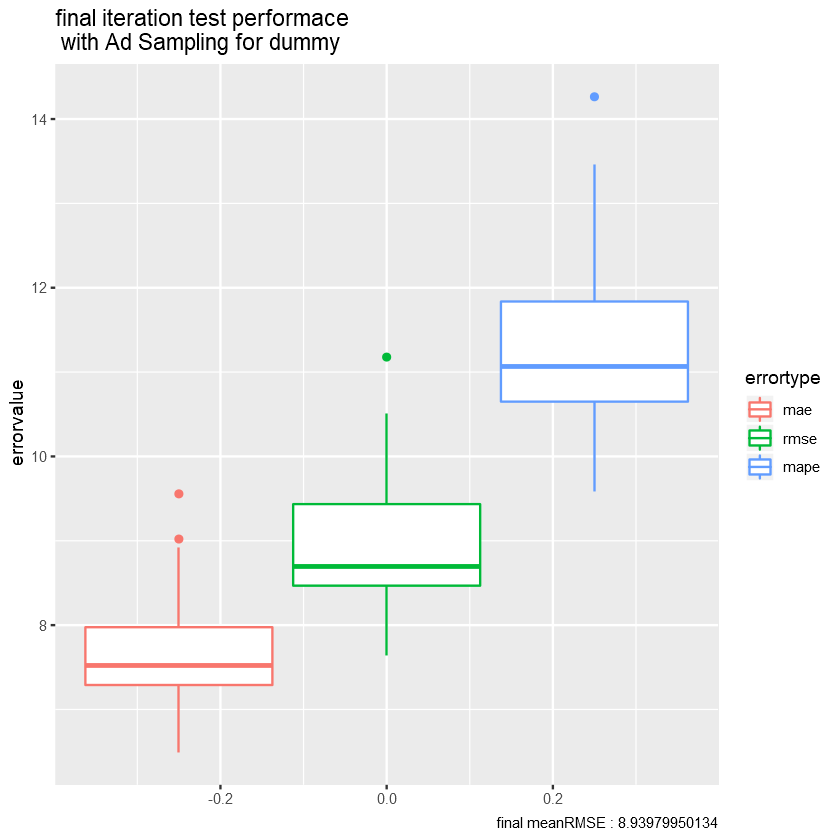

In [118]:
#### Overall BoxPlot ####
Ad_range_seq_bxp.2 = ggplot(data = performance_molten_Ad_range_seq.2[iter == 11], aes( y = errorvalue, group=errortype, col=errortype)) +
                    geom_boxplot(aes(colour = errortype)) +
                    labs( caption = paste0("final meanRMSE : ",mean(performance_table_Ad_range.2[iter == 11]$rmse))) +
                    ggtitle(paste0("final iteration test performace","\n"," with Ad Sampling for ",model.type.2))
                    
Ad_range_seq_bxp.2

In [119]:
boxplot.stats(performance_table_Ad_range.2[iter == 11]$rmse)

$stats
[1]  7.635229  8.467119  8.693786  9.447025 10.513378

$n
[1] 100

$conf
[1] 8.538961 8.848611

$out
[1] 11.17798

### Train Candidates

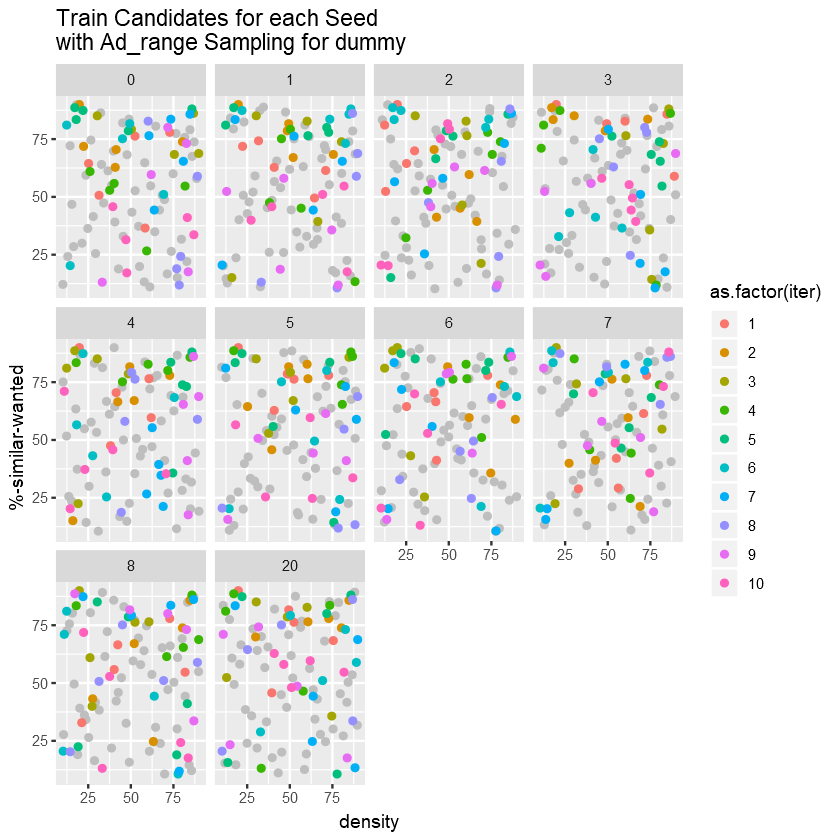

In [120]:
#### Train Candidates ####
tc_Ad_range_seq_plot.2 = ggplot(adaptive_initial_data.2, aes(x = density, y = `%-similar-wanted`)) +
               geom_point(color = "grey") +
               geom_point(data = train_candidates_Ad_range.2[rep == 10], aes(colour = as.factor(iter))) +
               facet_wrap(~ seed) + 
               labs(legend = "output") +
               ggtitle(paste0("Train Candidates for each Seed","\n","with Ad_range Sampling for ",model.type.2))
tc_Ad_range_seq_plot.2

### Final Data ####

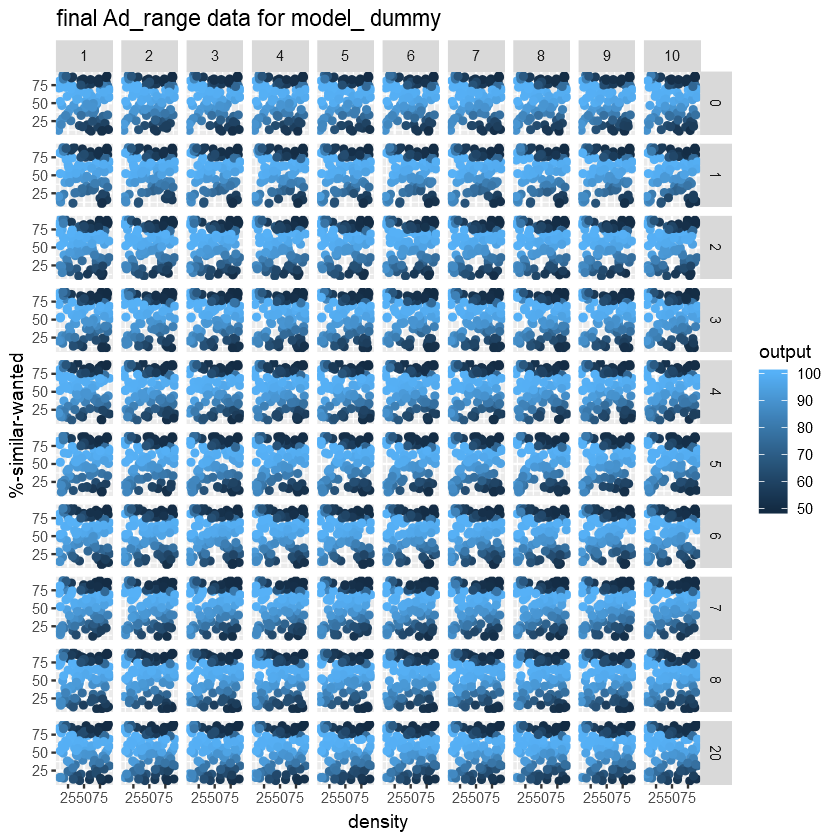

In [121]:
#### Final Data ####
final_train_data_Ad_range.2 = ggplot(data = FinalTrainData_Ad_range.2, aes(x = density, y = `%-similar-wanted`)) +
                           geom_point(aes(colour = output)) +
                           facet_grid(seed~rep) +
                            #facet_warp(~rep) +
                            #facet_warp(~seed) +
                           labs(legend = "output") +
                           ggtitle(paste0("final Ad_range data for model_ ",model.type.2))
final_train_data_Ad_range.2

## Model.1 vs Model.2

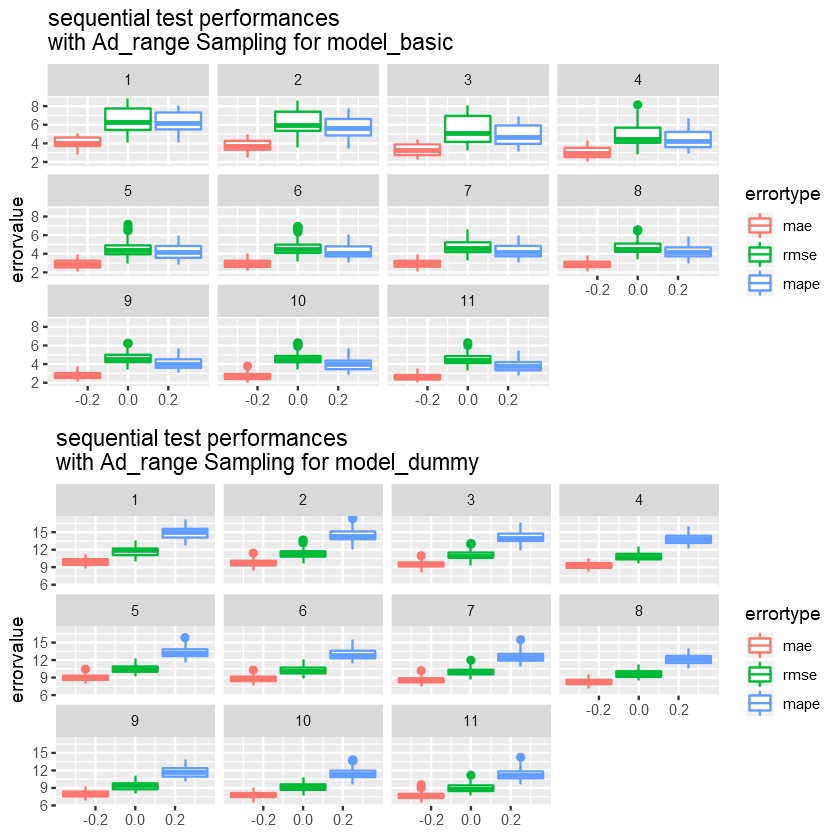

In [122]:
grid.arrange(Ad_range_seq_ind_bxp.1,Ad_range_seq_ind_bxp.2)

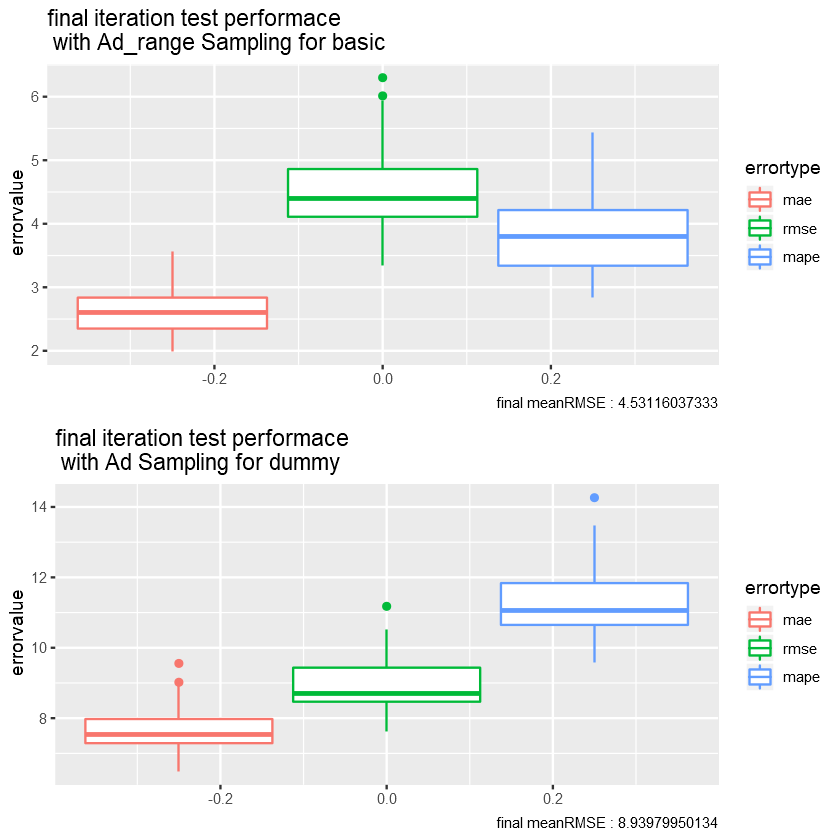

In [123]:
grid.arrange(Ad_range_seq_bxp.1,Ad_range_seq_bxp.2)

# Ad vs Ad_range

## Model.1

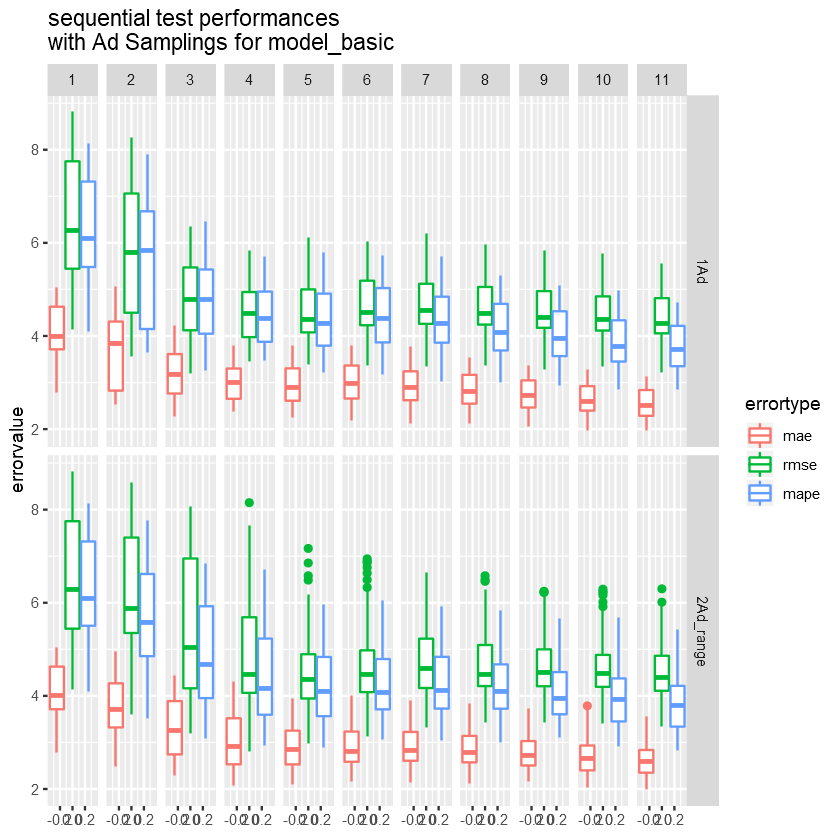

In [124]:
AdS_seq_ind_bxp.1 = ggplot(rbind(data.table(performance_molten_Ad_seq.1, sampling = "1Ad")
                                ,data.table(performance_molten_Ad_range_seq.1, sampling = "2Ad_range"))
                                , aes(y = errorvalue, group=errortype, col=errortype)) + 
                  geom_boxplot()+
                  facet_grid(sampling~iter) +
                #  geom_hline(data = performance_molten_oneshot, aes(yintercept = errorvalue, group=errortype, col=errortype),stat = "hline", linetype = "dashed") +
                  ggtitle(paste0("sequential test performances","\n","with Ad Samplings for model_",model.type.1))
AdS_seq_ind_bxp.1


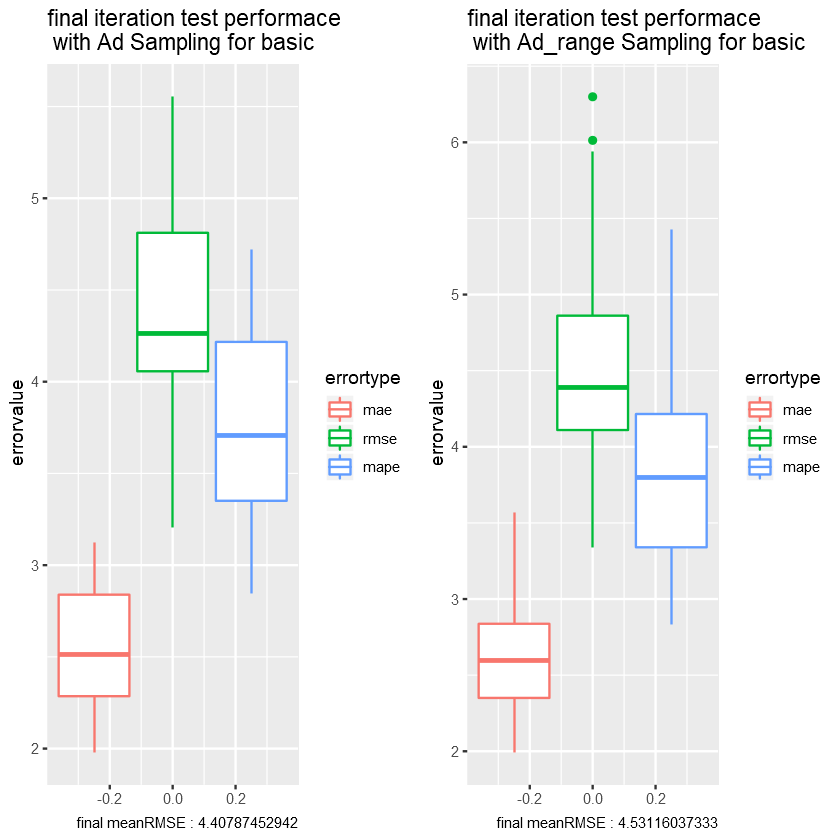

In [125]:
grid.arrange(Ad_seq_bxp.1,Ad_range_seq_bxp.1, ncol = 2)

## Model.2

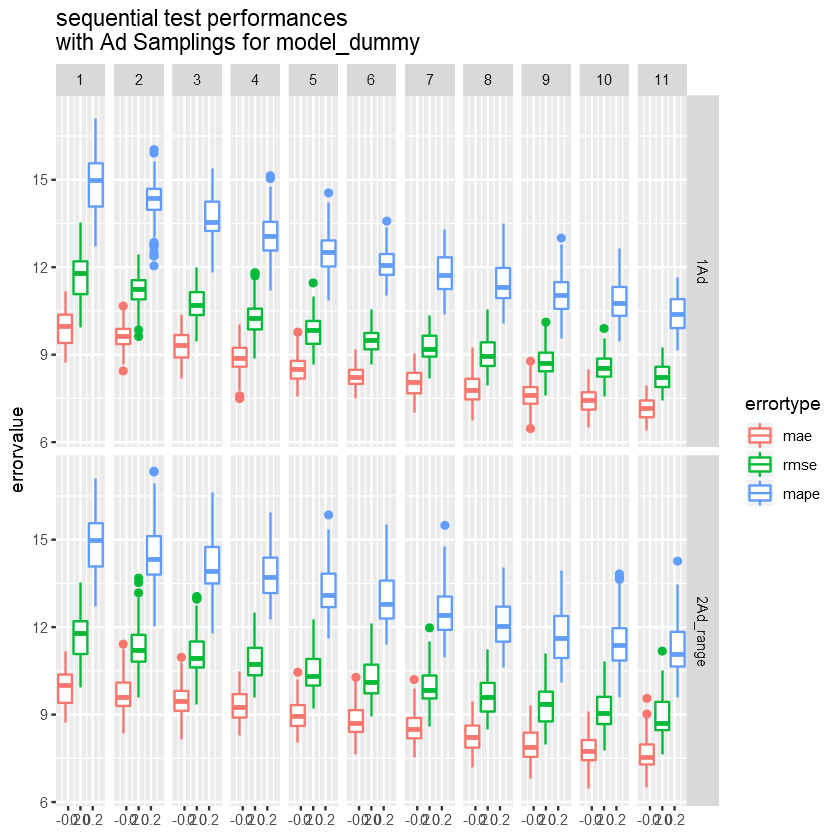

In [126]:
AdS_seq_ind_bxp.2 = ggplot(rbind(data.table(performance_molten_Ad_seq.2, sampling = "1Ad")
                                ,data.table(performance_molten_Ad_range_seq.2, sampling = "2Ad_range"))
                                , aes(y = errorvalue, group=errortype, col=errortype)) + 
                  geom_boxplot()+
                  facet_grid(sampling~iter) +
                #  geom_hline(data = performance_molten_oneshot, aes(yintercept = errorvalue, group=errortype, col=errortype),stat = "hline", linetype = "dashed") +
                  ggtitle(paste0("sequential test performances","\n","with Ad Samplings for model_",model.type.2))
AdS_seq_ind_bxp.2


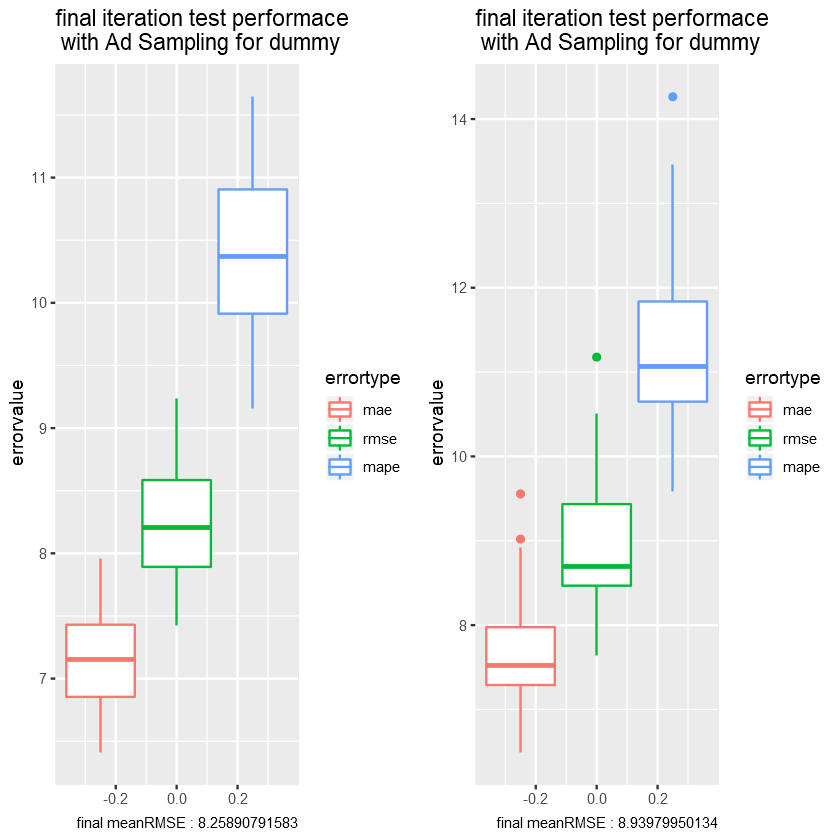

In [127]:
grid.arrange(Ad_seq_bxp.2,Ad_range_seq_bxp.2, ncol = 2)

# 4 Scenarios_Part 1

## Model.1

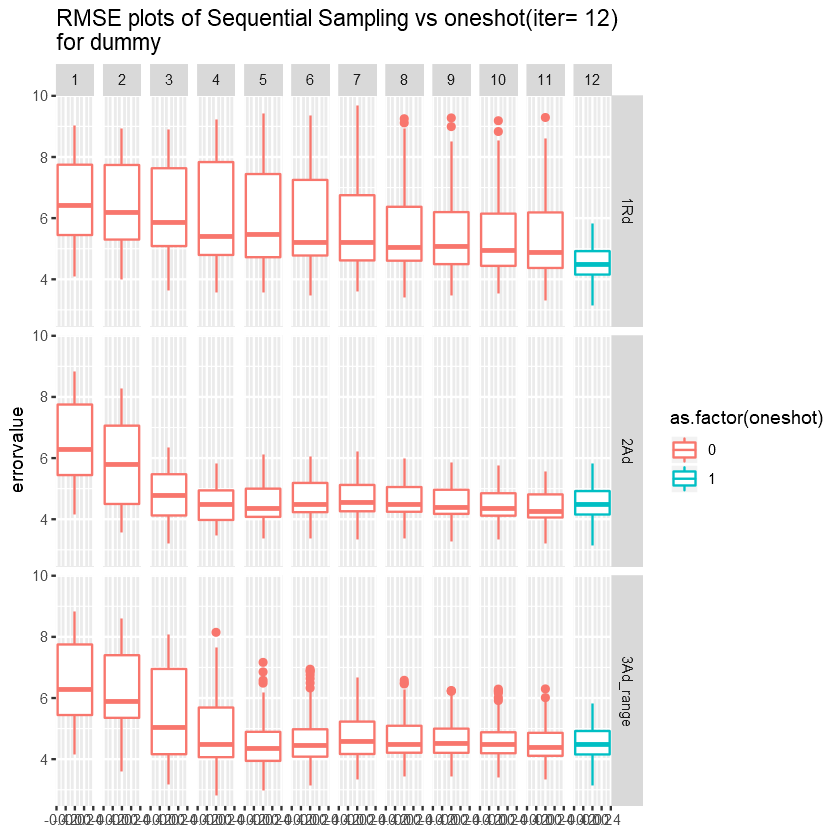

In [128]:
rmse_graph_molten_data.1 = rbind(data.table(performance_molten_Ad_seq.1[errortype == "rmse"], sampling = "2Ad", oneshot = 0)
                              ,data.table(performance_molten_oneshot.1[errortype == "rmse",.(iter = 12,seed,rep,errortype,errorvalue)], sampling = "2Ad",oneshot=1)
                              ,data.table(performance_molten_Ad_range_seq.1[errortype == "rmse"], sampling = "3Ad_range",oneshot=0)
                              ,data.table(performance_molten_oneshot.1[errortype == "rmse",.(iter = 12,seed,rep,errortype,errorvalue)], sampling = "3Ad_range",oneshot=1)
                              ,data.table(performance_molten_Rd_seq.1[errortype == "rmse"], sampling = "1Rd",oneshot=0)
                              ,data.table(performance_molten_oneshot.1[errortype == "rmse",.(iter = 12,seed,rep,errortype,errorvalue)], sampling = "1Rd",oneshot=1)
                             )

ggplot(rmse_graph_molten_data.1, aes(y = errorvalue, col=as.factor(oneshot))) + 
                  geom_boxplot()+
                  facet_grid(sampling~iter) +
                ggtitle(paste0("RMSE plots of Sequential Sampling vs oneshot(iter= 12)","\n","for dummy"))

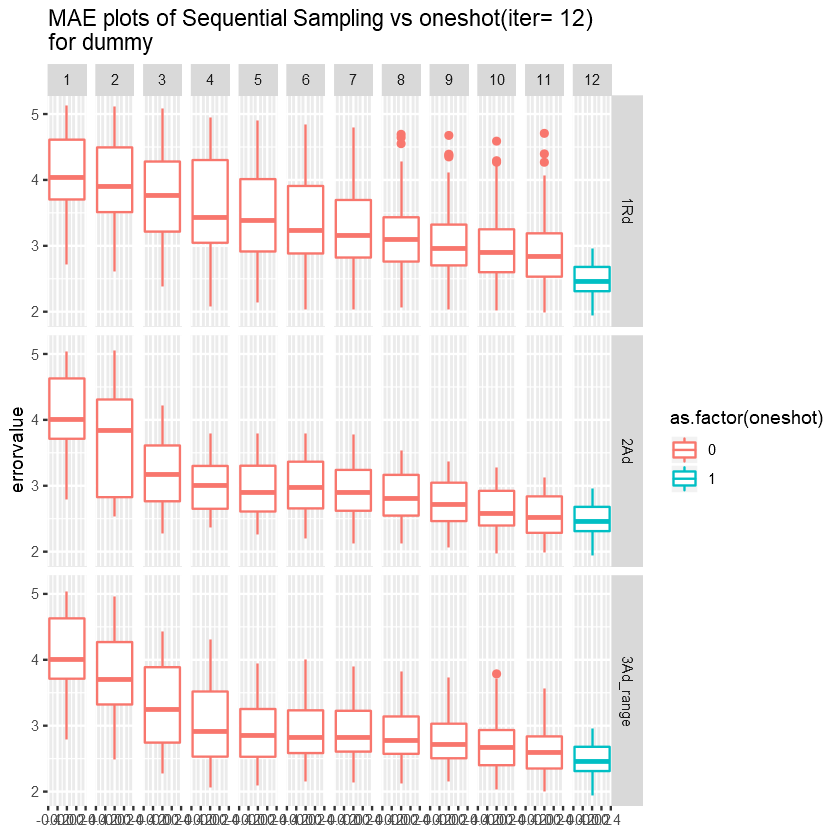

In [129]:
mae_graph_molten_data.1 = rbind(data.table(performance_molten_Ad_seq.1[errortype == "mae"], sampling = "2Ad", oneshot = 0)
                             ,data.table(performance_molten_oneshot.1[errortype == "mae",.(iter = 12,seed,rep,errortype,errorvalue)], sampling = "2Ad",oneshot=1)
                             ,data.table(performance_molten_Ad_range_seq.1[errortype == "mae"], sampling = "3Ad_range",oneshot=0)
                             ,data.table(performance_molten_oneshot.1[errortype == "mae",.(iter = 12,seed,rep,errortype,errorvalue)], sampling = "3Ad_range",oneshot=1)
                             ,data.table(performance_molten_Rd_seq.1[errortype == "mae"], sampling = "1Rd",oneshot=0)
                             ,data.table(performance_molten_oneshot.1[errortype == "mae",.(iter = 12,seed,rep,errortype,errorvalue)], sampling = "1Rd",oneshot=1)
                             )

ggplot(mae_graph_molten_data.1, aes(y = errorvalue, col=as.factor(oneshot))) + 
                  geom_boxplot()+
                  facet_grid(sampling~iter) +
                ggtitle(paste0("MAE plots of Sequential Sampling vs oneshot(iter= 12)","\n","for dummy"))

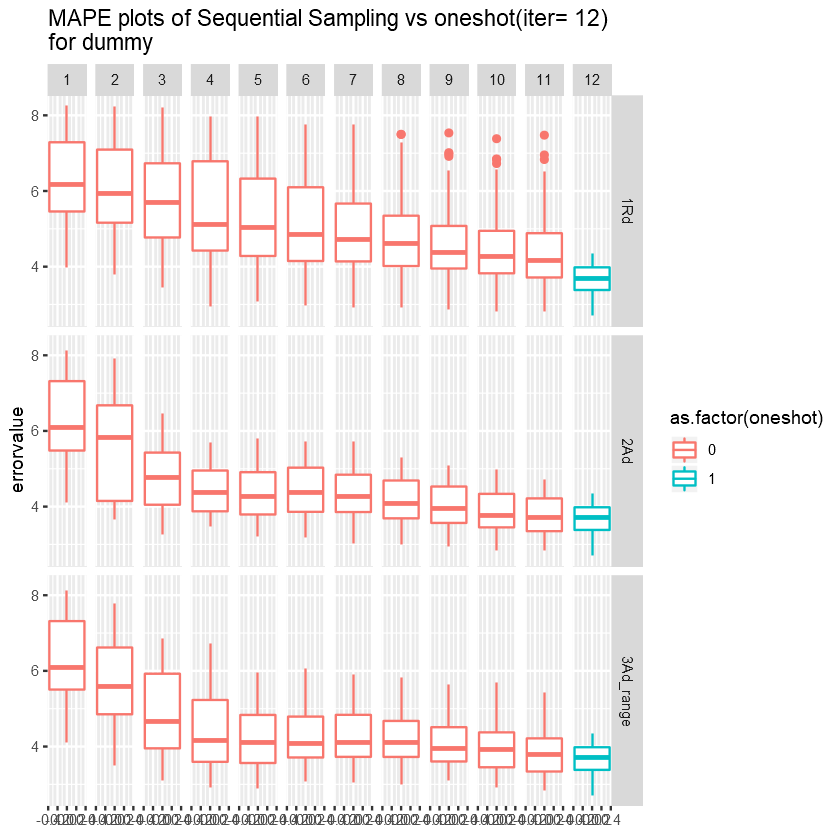

In [130]:
mape_graph_molten_data.1 = rbind(data.table(performance_molten_Ad_seq.1[errortype == "mape"], sampling = "2Ad", oneshot = 0)
                             ,data.table(performance_molten_oneshot.1[errortype == "mape",.(iter = 12,seed,rep,errortype,errorvalue)], sampling = "2Ad",oneshot=1)
                             ,data.table(performance_molten_Ad_range_seq.1[errortype == "mape"], sampling = "3Ad_range",oneshot=0)
                             ,data.table(performance_molten_oneshot.1[errortype == "mape",.(iter = 12,seed,rep,errortype,errorvalue)], sampling = "3Ad_range",oneshot=1)
                             ,data.table(performance_molten_Rd_seq.1[errortype == "mape"], sampling = "1Rd",oneshot=0)
                             ,data.table(performance_molten_oneshot.1[errortype == "mape",.(iter = 12,seed,rep,errortype,errorvalue)], sampling = "1Rd",oneshot=1)
                             )

ggplot(mape_graph_molten_data.1, aes(y = errorvalue, col=as.factor(oneshot))) + 
                  geom_boxplot()+
                  facet_grid(sampling~iter) +
                ggtitle(paste0("MAPE plots of Sequential Sampling vs oneshot(iter= 12)","\n","for dummy"))

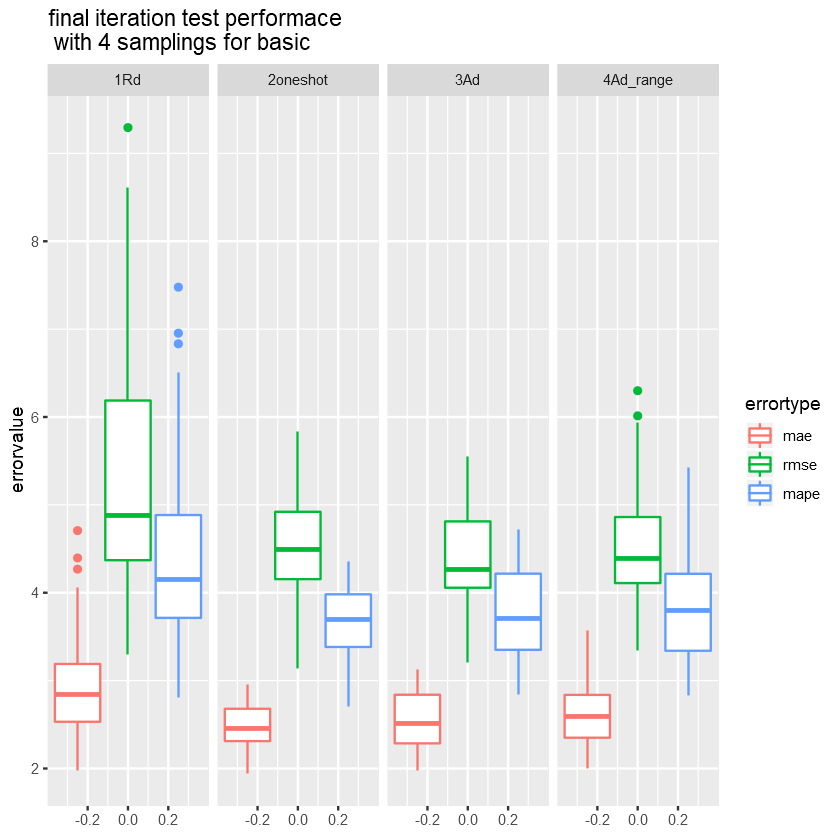

In [131]:
all_range_bxp.1 = ggplot(data = rbind(data.table(performance_molten_Ad_range_seq.1[iter == 11], sampling = "4Ad_range")
                                     ,data.table(performance_molten_Ad_seq.1[iter == 11], sampling = "3Ad")
                                     ,data.table(performance_molten_Rd_seq.1[iter == 11], sampling = "1Rd")
                                     ,data.table(performance_molten_oneshot.1, sampling = "2oneshot"))
                    , aes( y = errorvalue, group=errortype, col=errortype)) +
                    facet_wrap(~sampling, ncol = 4) +
                    geom_boxplot(aes(colour = errortype)) +
                    ggtitle(paste0("final iteration test performace","\n"," with 4 samplings for ",model.type.1))
                    
all_range_bxp.1

## Model.2

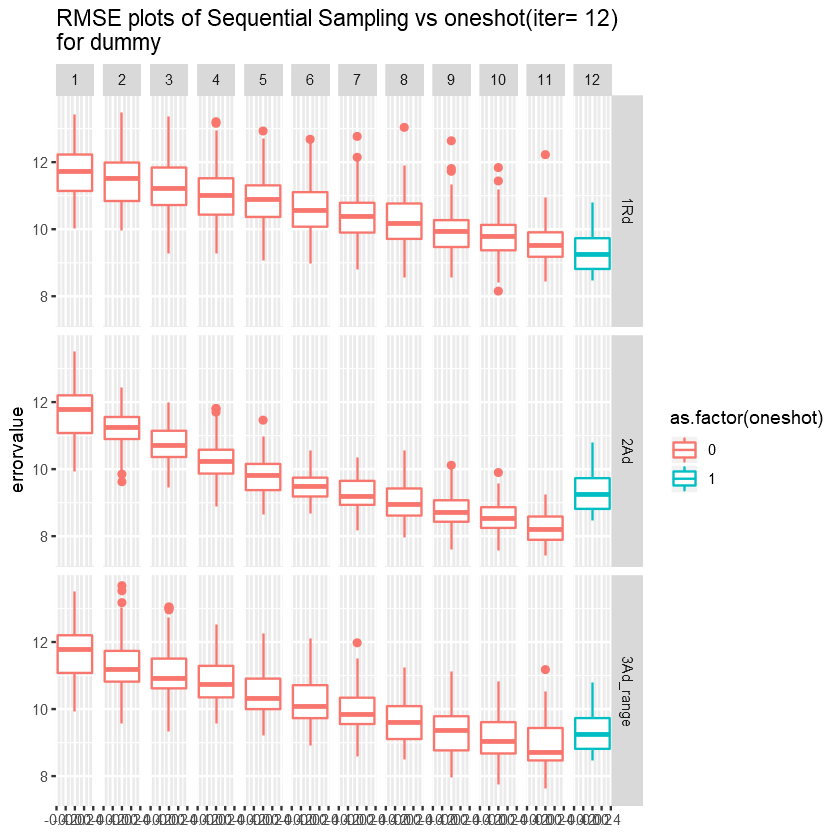

In [134]:
rmse_graph_molten_data.2 = rbind(data.table(performance_molten_Ad_seq.2[errortype == "rmse"], sampling = "2Ad", oneshot = 0)
                              ,data.table(performance_molten_oneshot.2[errortype == "rmse",.(iter = 12,seed,rep,errortype,errorvalue)], sampling = "2Ad",oneshot=1)
                              ,data.table(performance_molten_Ad_range_seq.2[errortype == "rmse"], sampling = "3Ad_range",oneshot=0)
                              ,data.table(performance_molten_oneshot.2[errortype == "rmse",.(iter = 12,seed,rep,errortype,errorvalue)], sampling = "3Ad_range",oneshot=1)
                              ,data.table(performance_molten_Rd_seq.2[errortype == "rmse"], sampling = "1Rd",oneshot=0)
                              ,data.table(performance_molten_oneshot.2[errortype == "rmse",.(iter = 12,seed,rep,errortype,errorvalue)], sampling = "1Rd",oneshot=1)
                             )

ggplot(rmse_graph_molten_data.2, aes(y = errorvalue, col=as.factor(oneshot))) + 
                  geom_boxplot()+
                  facet_grid(sampling~iter) +
                ggtitle(paste0("RMSE plots of Sequential Sampling vs oneshot(iter= 12)","\n","for dummy"))

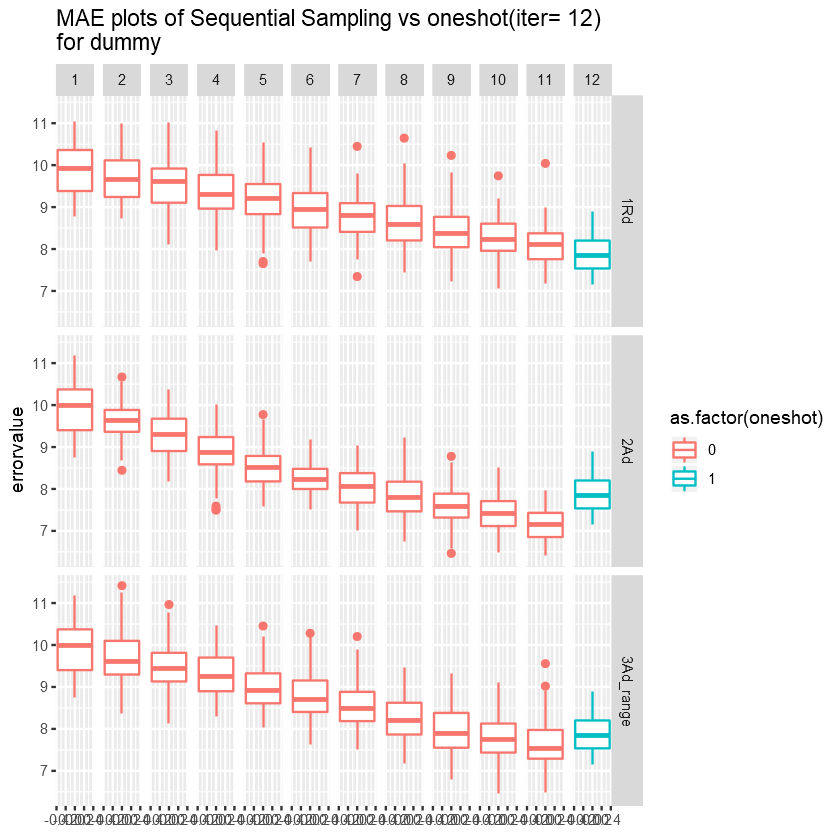

In [135]:
mae_graph_molten_data.2 = rbind(data.table(performance_molten_Ad_seq.2[errortype == "mae"], sampling = "2Ad", oneshot = 0)
                             ,data.table(performance_molten_oneshot.2[errortype == "mae",.(iter = 12,seed,rep,errortype,errorvalue)], sampling = "2Ad",oneshot=1)
                             ,data.table(performance_molten_Ad_range_seq.2[errortype == "mae"], sampling = "3Ad_range",oneshot=0)
                             ,data.table(performance_molten_oneshot.2[errortype == "mae",.(iter = 12,seed,rep,errortype,errorvalue)], sampling = "3Ad_range",oneshot=1)
                             ,data.table(performance_molten_Rd_seq.2[errortype == "mae"], sampling = "1Rd",oneshot=0)
                             ,data.table(performance_molten_oneshot.2[errortype == "mae",.(iter = 12,seed,rep,errortype,errorvalue)], sampling = "1Rd",oneshot=1)
                             )

ggplot(mae_graph_molten_data.2, aes(y = errorvalue, col=as.factor(oneshot))) + 
                  geom_boxplot()+
                  facet_grid(sampling~iter) +
                ggtitle(paste0("MAE plots of Sequential Sampling vs oneshot(iter= 12)","\n","for dummy"))

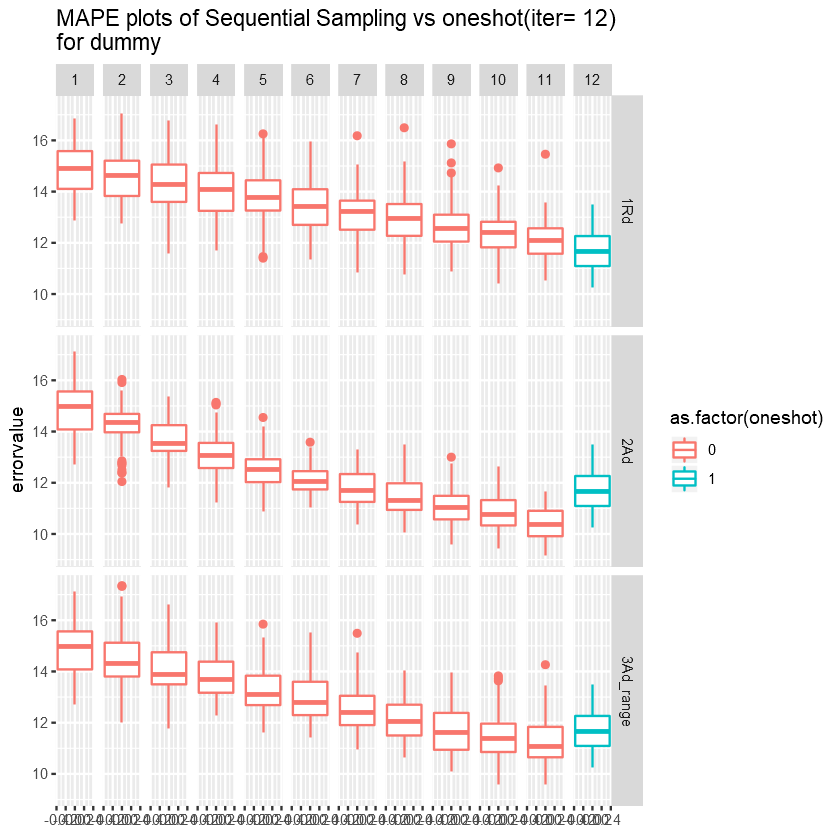

In [136]:
mape_graph_molten_data.2 = rbind(data.table(performance_molten_Ad_seq.2[errortype == "mape"], sampling = "2Ad", oneshot = 0)
                             ,data.table(performance_molten_oneshot.2[errortype == "mape",.(iter = 12,seed,rep,errortype,errorvalue)], sampling = "2Ad",oneshot=1)
                             ,data.table(performance_molten_Ad_range_seq.2[errortype == "mape"], sampling = "3Ad_range",oneshot=0)
                             ,data.table(performance_molten_oneshot.2[errortype == "mape",.(iter = 12,seed,rep,errortype,errorvalue)], sampling = "3Ad_range",oneshot=1)
                             ,data.table(performance_molten_Rd_seq.2[errortype == "mape"], sampling = "1Rd",oneshot=0)
                             ,data.table(performance_molten_oneshot.2[errortype == "mape",.(iter = 12,seed,rep,errortype,errorvalue)], sampling = "1Rd",oneshot=1)
                             )

ggplot(mape_graph_molten_data.2, aes(y = errorvalue, col=as.factor(oneshot))) + 
                  geom_boxplot()+
                  facet_grid(sampling~iter) +
                ggtitle(paste0("MAPE plots of Sequential Sampling vs oneshot(iter= 12)","\n","for dummy"))

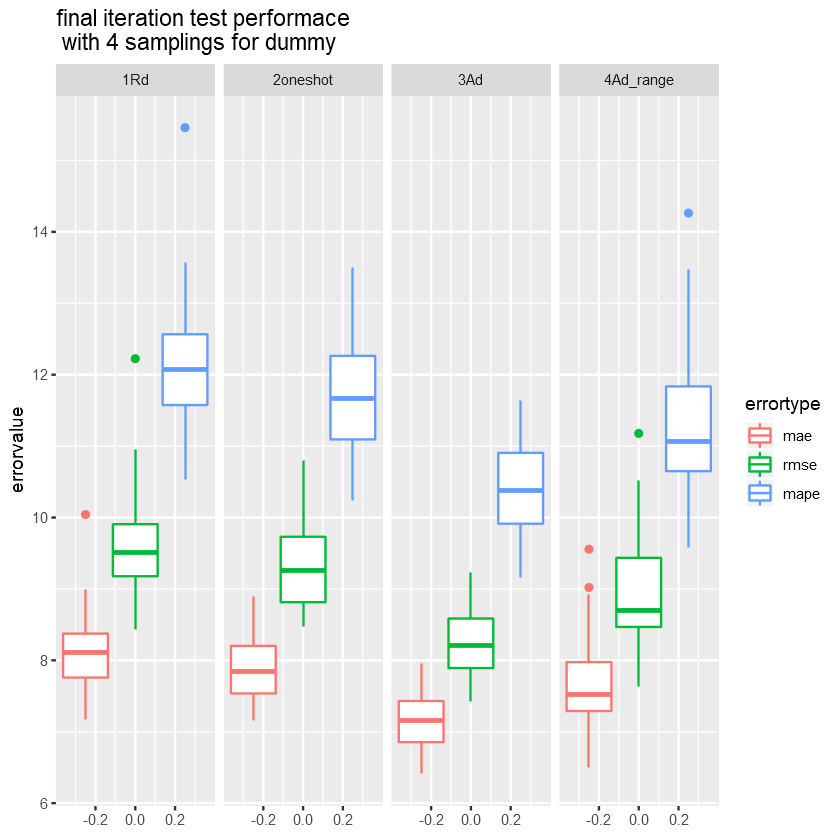

In [137]:
all_range_bxp.2 = ggplot(data = rbind(data.table(performance_molten_Ad_range_seq.2[iter == 11], sampling = "4Ad_range")
                                     ,data.table(performance_molten_Ad_seq.2[iter == 11], sampling = "3Ad")
                                     ,data.table(performance_molten_Rd_seq.2[iter == 11], sampling = "1Rd")
                                     ,data.table(performance_molten_oneshot.2, sampling = "2oneshot"))
                    , aes( y = errorvalue, group=errortype, col=errortype)) +
                    facet_wrap(~sampling, ncol = 4) +
                    geom_boxplot(aes(colour = errortype)) +
                    ggtitle(paste0("final iteration test performace","\n"," with 4 samplings for ",model.type.2))
                    
all_range_bxp.2

# Metamodel Replications On Final Data Rd

In [138]:
####  Metamodel Replications On Final Data Rd #### 

if (model.type.1 == "basic") {
    feature_names.1 = c("density", "%-similar-wanted")
    feature_names.2 = c("density", "%-similar-wanted", "budget-multiplier-dummy", "density-multiplier-dummy", 
        "noise-dummy", "tick-limit")
} else if (model.type.1 == "dummy") {
    feature_names.1 = c("density", "%-similar-wanted", "budget-multiplier-dummy", "density-multiplier-dummy", 
        "noise-dummy", "tick-limit")
    feature_names.2 = c("density", "%-similar-wanted")
}

In [139]:
feature_names.1
feature_names.2

[1] "density"          "%-similar-wanted"

[1] "density"                  "%-similar-wanted"        
[3] "budget-multiplier-dummy"  "density-multiplier-dummy"
[5] "noise-dummy"              "tick-limit"

## Model.1

In [140]:
#### Model.1 ####
mtry = 2
ntree = 300
predictedLabels_Rd_rep.1 = data.table()
performance_table_Rd_rep.1 = data.table(seed = numeric(), rep = numeric(), new_rep = numeric(),mae = numeric(), 
    rmse = numeric(), mape = numeric())

for (s in seed.Ad.1) {
    for (k in 1:10) {
        trainx.1 = FinalTrainData_Rd.1[seed == s & rep == k, .SD, .SDcols = feature_names.1]
        trainy.1 = FinalTrainData_Rd.1[seed == s & rep == k]$output
        
        test_set.1.retrain = copy(test_set.1)
        
        
        for (r in 1:10) {
            model_Sub.1 <- randomForest(x = trainx.1, y = trainy.1, importance = TRUE, 
                ntree = ntree, mtry = mtry)
            
            predictedLabels.1 <- predict(model_Sub.1, test_set.1.retrain)
            predictedLabels.1 <- cbind(test_set.1.retrain, data.table(pred_output = predictedLabels.1, 
                seed = s, rep = k, new_rep = r))
            
            predictedLabels_Rd_rep.1 <- rbind(predictedLabels_Rd_rep.1, predictedLabels.1)
            
            output_variables = colnames(select(predictedLabels.1, contains("output")))
            output_variables_1 = predictedLabels.1[, get(output_variables[1]), with = TRUE]
            output_variables_2 = predictedLabels.1[, get(output_variables[2]), with = TRUE]
            
            performance_temp = matrix(c(1:3), nrow = 1, ncol = 3)
            performance_temp[1] = mae(output_variables_1, output_variables_2)
            performance_temp[2] = rmse(output_variables_1, output_variables_2)
            performance_temp[3] = mape(output_variables_1, output_variables_2)
            
            performance_table_Rd_rep.1 = rbind(performance_table_Rd_rep.1, data.table(s, 
                r,k, performance_temp), use.names = FALSE)
            
        }
        
        rm(trainx.1, trainy.1)
    }
}

In [141]:
performance_molten_Rd.1 <- melt(data = performance_table_Rd_rep.1
                             , id.vars = c("seed","rep","new_rep"))
setnames(performance_molten_Rd.1, c("variable","value"),c("errortype","errorvalue"))

### Replications on Each Seed

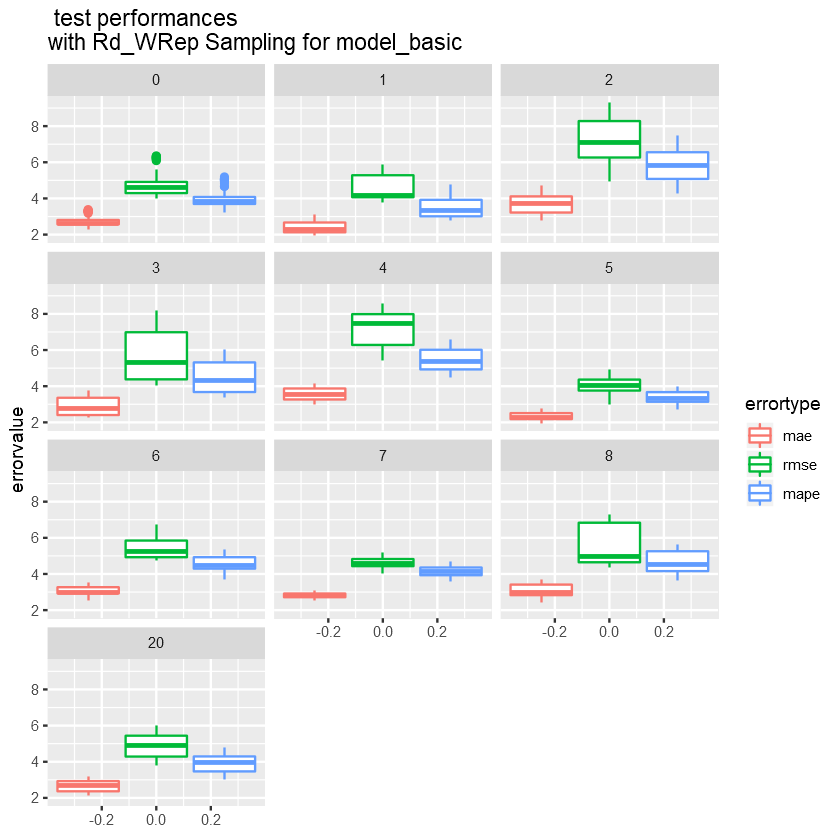

In [142]:
#### Replications on Each Seed ####

Rd_ind_bxp.1 = ggplot(performance_molten_Rd.1, aes(y = errorvalue, group=errortype, col=errortype)) + 
                        geom_boxplot(varwidth = TRUE)+
                        facet_wrap(~seed,ncol=3) +
                        ggtitle(paste0(" test performances","\n","with Rd_WRep Sampling for model_",model.type.1)) 
Rd_ind_bxp.1

3.996105,3.782240,4.944971,4.038742,5.425932,3.004370,4.726463,4.030700,4.334814,3.817322
4.291573,4.067843,6.255937,4.379027,6.277530,3.758498,4.926870,4.431653,4.646166,4.283341
4.630998,4.183581,7.113488,5.320695,7.466716,4.029206,5.243170,4.591859,4.959792,4.875240
4.916756,5.285482,8.282641,6.988622,7.989815,4.376227,5.851608,4.836666,6.843740,5.449885
5.609666,5.858300,9.335924,8.205479,8.549253,4.914829,6.755193,5.169502,7.295742,5.986098
4.532219,3.991194,6.793269,4.908379,7.196175,3.931605,5.097061,4.527867,4.612575,4.690927
4.729777,4.375968,7.433707,5.733011,7.737258,4.126807,5.389278,4.655851,5.307009,5.059554


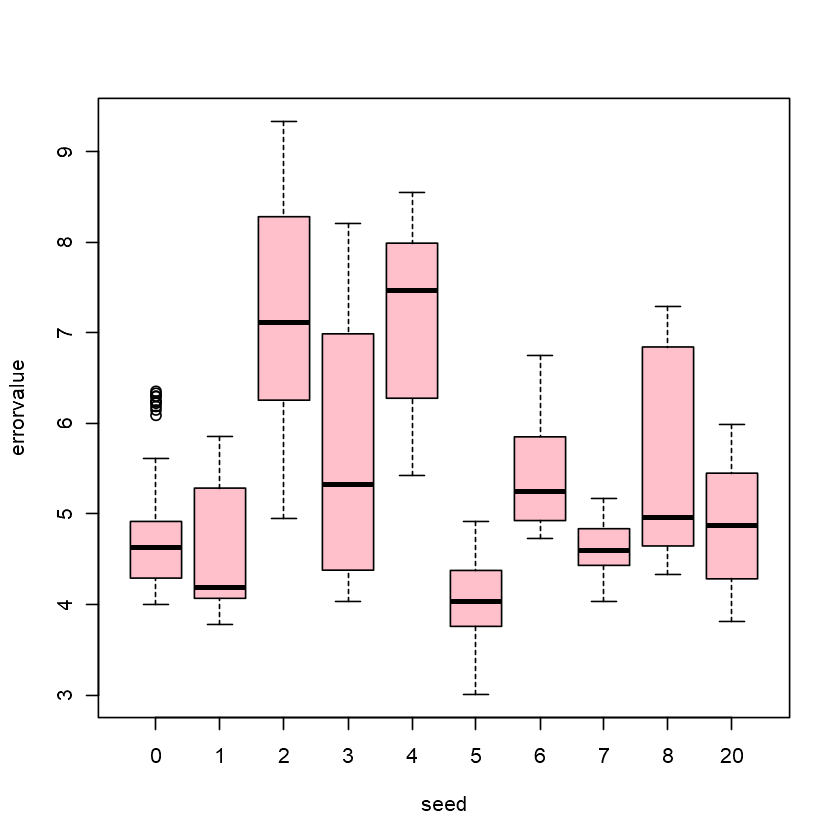

In [143]:
bxp.Rd.1 <-  boxplot( data = performance_molten_Rd.1[errortype == "rmse"], errorvalue  ~ seed, col = "pink")
bxp.Rd.1

In [144]:
performance_table_Rd_rep.1[, .(mean_rmse = mean(rmse)),.(seed)][order(mean_rmse)]

seed,mean_rmse
<dbl>,<dbl>
5,4.022087
1,4.507509
7,4.608460
0,4.775076
20,4.849466
8,5.465603
6,5.486520
3,5.669241
4,7.209311


### Overall BoxPlot

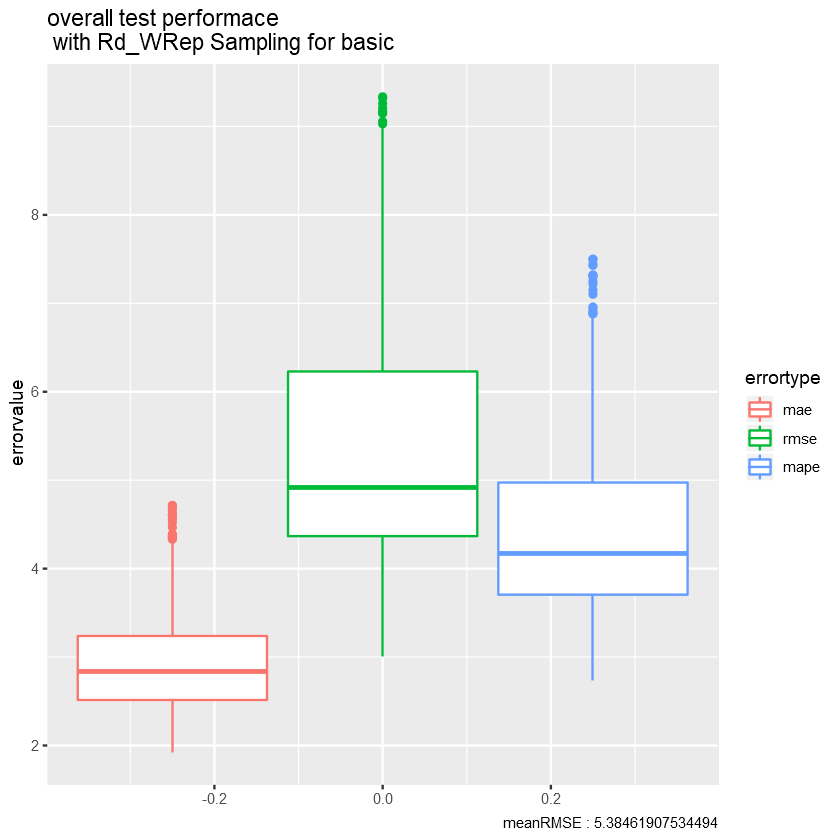

In [145]:
Rd_bxp.1 = ggplot(data = performance_molten_Rd.1, aes(y = errorvalue, group=errortype, col=errortype)) +
                    geom_boxplot(aes(colour = errortype)) +
                   # facet_wrap(~ seed) +
                    labs( caption = paste0("meanRMSE : ",mean(performance_table_Rd_rep.1$rmse))) +
                    ggtitle(paste0("overall test performace","\n"," with Rd_WRep Sampling for ",model.type.1))
                    
Rd_bxp.1

In [146]:
boxplot.stats(performance_table_Rd_rep.1$rmse)

$stats
[1] 3.004370 4.367347 4.912894 6.232084 8.996036

$n
[1] 1000

$conf
[1] 4.819725 5.006064

$out
[1] 9.322334 9.030273 9.177612 9.207975 9.057025 9.147211 9.335924 9.159812
[9] 9.260838

## Model.2

In [147]:
#### Model.2 ####
mtry = 2
ntree = 300
predictedLabels_Rd_rep.2 = data.table()
performance_table_Rd_rep.2 = data.table(seed = numeric(), rep = numeric(), new_rep = numeric(), mae = numeric(), 
    rmse = numeric(), mape = numeric())

for (s in seed.Ad.2) {
    for (k in 1:10) {
        trainx.2 = FinalTrainData_Rd.2[seed == s & rep == k, .SD, .SDcols = feature_names.2]
        trainy.2 = FinalTrainData_Rd.2[seed == s & rep == k]$output
        
        test_set.2.retrain = copy(test_set.2)
        
        
        for (r in 1:10) {
            model_Sub.2 <- randomForest(x = trainx.2, y = trainy.2, importance = TRUE, 
                ntree = ntree, mtry = mtry)
            
            predictedLabels.2 <- predict(model_Sub.2, test_set.2.retrain)
            predictedLabels.2 <- cbind(test_set.2.retrain, data.table(pred_output = predictedLabels.2, 
                seed = s, rep = r, new_rep = r))
            
            predictedLabels_Rd_rep.2 <- rbind(predictedLabels_Rd_rep.2, predictedLabels.2)
            
            output_variables = colnames(select(predictedLabels.2, contains("output")))
            output_variables_1 = predictedLabels.2[, get(output_variables[1]), with = TRUE]
            output_variables_2 = predictedLabels.2[, get(output_variables[2]), with = TRUE]
            
            performance_temp = matrix(c(1:3), nrow = 1, ncol = 3)
            performance_temp[1] = mae(output_variables_1, output_variables_2)
            performance_temp[2] = rmse(output_variables_1, output_variables_2)
            performance_temp[3] = mape(output_variables_1, output_variables_2)
            
            performance_table_Rd_rep.2 = rbind(performance_table_Rd_rep.2, data.table(s, 
                r,k, performance_temp), use.names = FALSE)
            
        }
        
        rm(trainx.2, trainy.2)
    }
}

In [148]:
performance_molten_Rd.2 <- melt(data = performance_table_Rd_rep.2
                             , id.vars = c("seed","rep","new_rep"))
setnames(performance_molten_Rd.2, c("variable","value"),c("errortype","errorvalue"))

### Replications on Each Seed

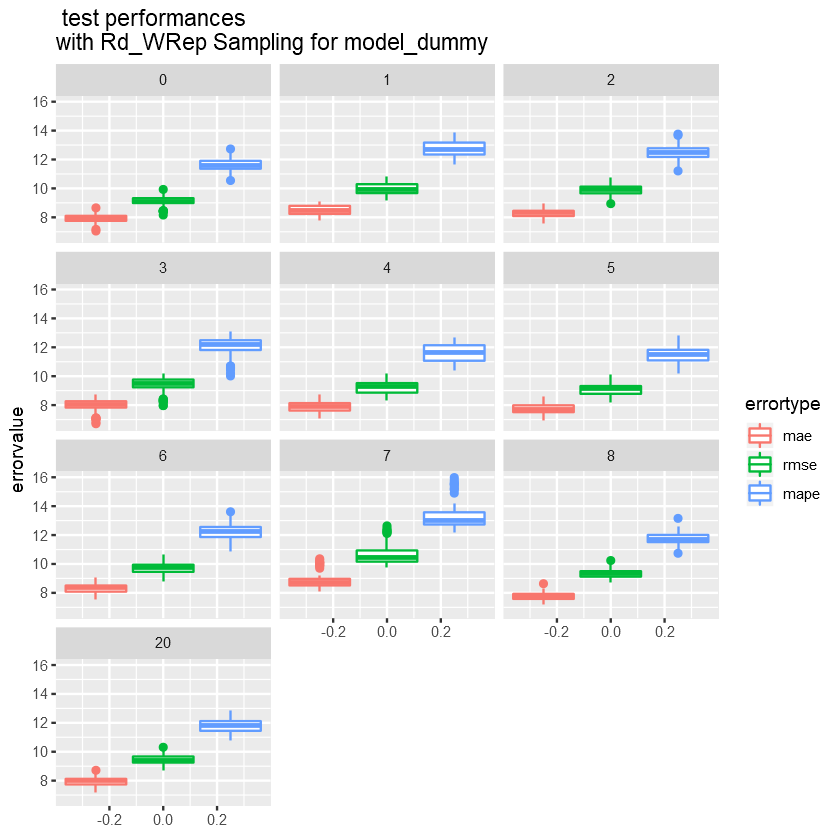

In [149]:
#### Replications on Each Seed ####

Rd_ind_bxp.2 = ggplot(performance_molten_Rd.2, aes(y = errorvalue, group=errortype, col=errortype)) + 
                        geom_boxplot(varwidth = TRUE)+
                        facet_wrap(~seed,ncol=3) +
                        ggtitle(paste0(" test performances","\n","with Rd_WRep Sampling for model_",model.type.2)) 
Rd_ind_bxp.2

8.501527,9.191198,9.166059,8.419463,8.344319,8.183371,8.786417,9.746304,8.713798,8.680392
8.987740,9.675526,9.660424,9.227267,8.862342,8.776854,9.455735,10.160007,9.125836,9.248141
9.124447,9.943488,9.924739,9.529264,9.300452,9.123358,9.784665,10.464595,9.322629,9.413195
9.330366,10.312234,10.135199,9.766797,9.522447,9.320112,9.951114,10.940950,9.501293,9.677637
9.822161,10.797151,10.786573,10.183413,10.169885,10.112105,10.642062,11.997203,9.948841,10.313212
9.070312,9.842888,9.849724,9.444018,9.196156,9.037524,9.706395,10.34121,9.263307,9.345335
9.178582,10.044087,9.999753,9.614510,9.404749,9.209193,9.862934,10.58798,9.381951,9.481056


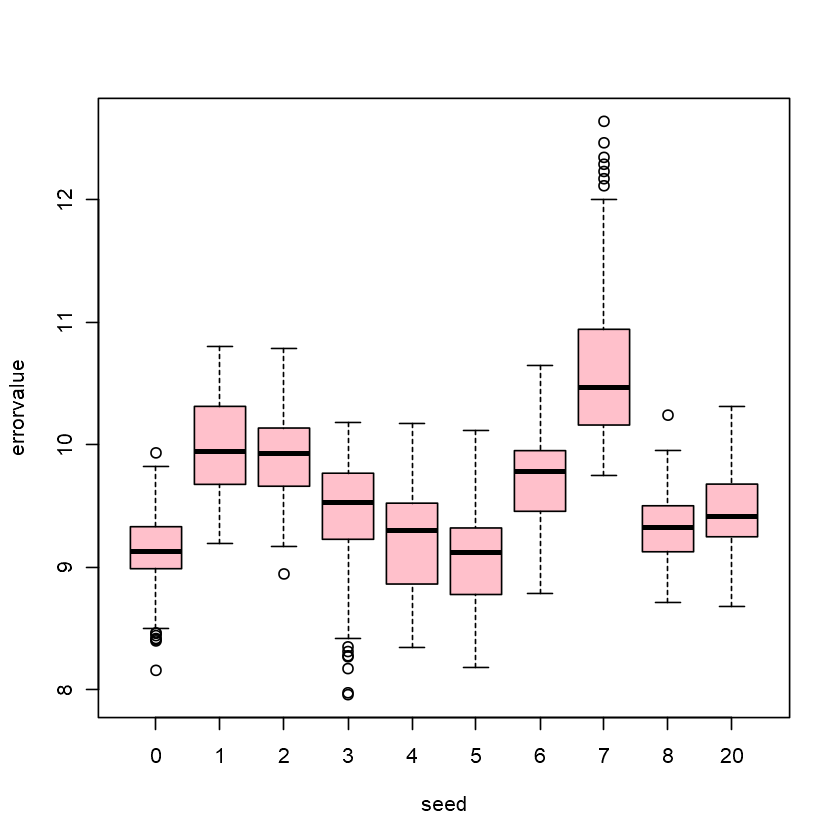

In [150]:
bxp.Rd.2 <-  boxplot( data = performance_molten_Rd.2[errortype == "rmse"], errorvalue  ~ seed, col = "pink")
bxp.Rd.2

In [151]:
performance_table_Rd_rep.2[, .(mean_rmse = mean(rmse)),.(seed)][order(mean_rmse)]

seed,mean_rmse
<dbl>,<dbl>
5,9.067760
0,9.122736
4,9.212541
8,9.317767
3,9.451310
20,9.467711
6,9.720779
2,9.908731
1,9.996092


### Overall BoxPlot

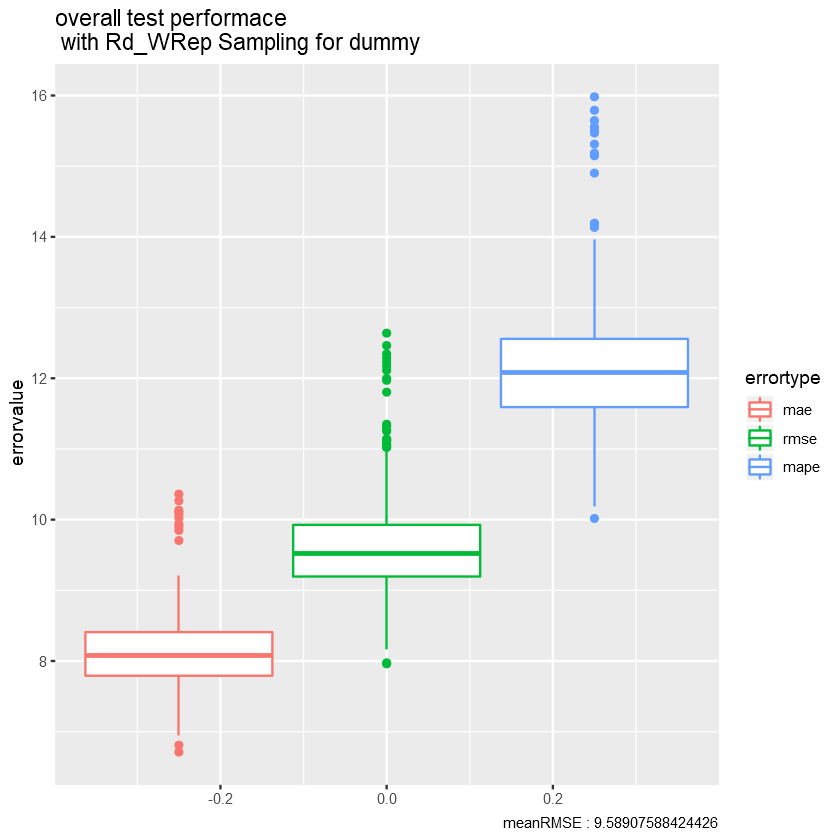

In [152]:
Rd_bxp.2 = ggplot(data = performance_molten_Rd.2, aes(y = errorvalue, group=errortype, col=errortype)) +
                    geom_boxplot(aes(colour = errortype)) +
                   # facet_wrap(~ seed) +
                    labs( caption = paste0("meanRMSE : ",mean(performance_table_Rd_rep.2$rmse))) +
                    ggtitle(paste0("overall test performace","\n"," with Rd_WRep Sampling for ",model.type.2))
                    
Rd_bxp.2

In [153]:
boxplot.stats(performance_table_Rd_rep.2$rmse)

$stats
[1]  8.158259  9.194853  9.525872  9.926063 11.022365

$n
[1] 1000

$conf
[1] 9.489338 9.562406

$out
 [1]  7.959881  7.975205 11.063474 11.319777 11.111912 11.275140 11.024276
 [8] 11.133980 11.350095 12.112505 12.288143 12.463076 12.170097 11.997203
[15] 11.803431 12.344340 12.638373 11.970701 12.229235 11.111758 11.253231
[22] 11.140772 11.055987

# Metamodel Replications On Final Data Ad

## Model.1

In [154]:
#### Model.1 ####
mtry = 2
ntree = 300
predictedLabels_Ad_rep.1 = data.table()
performance_table_Ad_rep.1 = data.table(seed = numeric(), rep = numeric(), new_rep = numeric(), mae = numeric(), 
    rmse = numeric(), mape = numeric())

for (s in seed.Ad.1) {
    for (k in 1:10) {
        trainx.1 = FinalTrainData_Ad.1[seed == s & rep == k, .SD, .SDcols = feature_names.1]
        trainy.1 = FinalTrainData_Ad.1[seed == s & rep == k]$output
        
        test_set.1.retrain = copy(test_set.1)
        
        
        for (r in 1:10) {
            model_Sub.1 <- randomForest(x = trainx.1, y = trainy.1, importance = TRUE, 
                ntree = ntree, mtry = mtry)
            
            predictedLabels.1 <- predict(model_Sub.1, test_set.1.retrain)
            predictedLabels.1 <- cbind(test_set.1.retrain, data.table(pred_output = predictedLabels.1, 
                seed = s, rep = r, new_rep = k))
            
            predictedLabels_Ad_rep.1 <- rbind(predictedLabels_Ad_rep.1, predictedLabels.1)
            
            output_variables = colnames(select(predictedLabels.1, contains("output")))
            output_variables_1 = predictedLabels.1[, get(output_variables[1]), with = TRUE]
            output_variables_2 = predictedLabels.1[, get(output_variables[2]), with = TRUE]
            
            performance_temp = matrix(c(1:3), nrow = 1, ncol = 3)
            performance_temp[1] = mae(output_variables_1, output_variables_2)
            performance_temp[2] = rmse(output_variables_1, output_variables_2)
            performance_temp[3] = mape(output_variables_1, output_variables_2)
            
            performance_table_Ad_rep.1 = rbind(performance_table_Ad_rep.1, data.table(s, 
                r,k, performance_temp), use.names = FALSE)
            
        }
        
        rm(trainx.1, trainy.1)
    }
}

In [162]:
performance_molten_Ad.1 <- melt(data = performance_table_Ad_rep.1
                             , id.vars = c("seed","rep","new_rep"))
setnames(performance_molten_Ad.1, c("variable","value"),c("errortype","errorvalue"))

### Replications on Each Seed

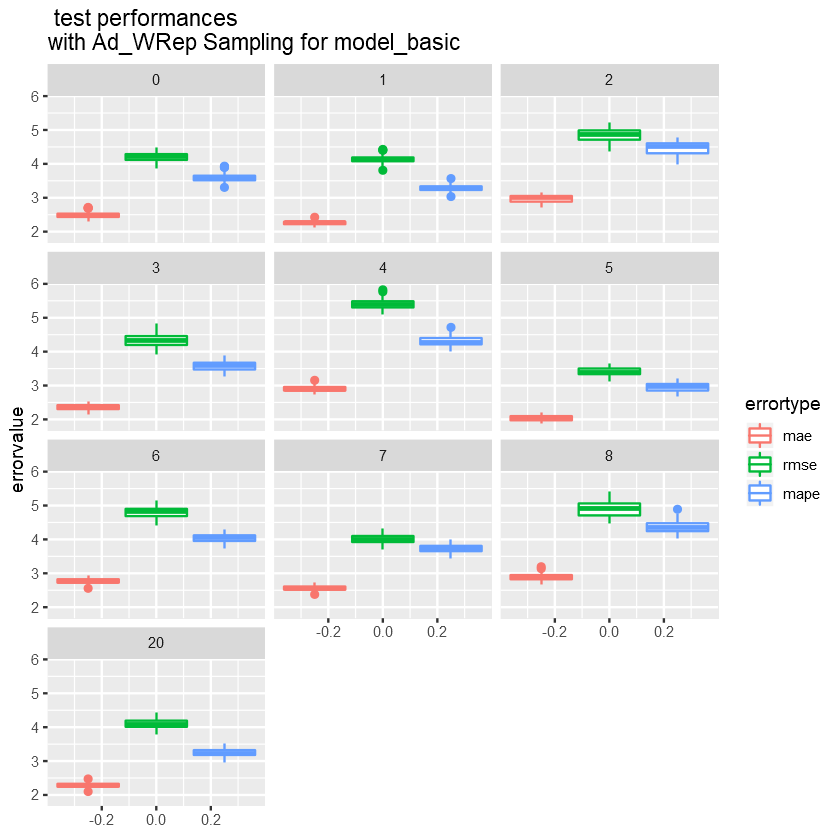

In [163]:
#### Replications on Each Seed ####

Ad_ind_bxp.1 = ggplot(performance_molten_Ad.1, aes(y = errorvalue, group=errortype, col=errortype)) + 
                        geom_boxplot(varwidth = TRUE)+
                        facet_wrap(~seed,ncol=3) +
                        ggtitle(paste0(" test performances","\n","with Ad_WRep Sampling for model_",model.type.1)) 
Ad_ind_bxp.1

3.865341,3.929848,4.364705,3.913516,5.088617,3.132901,4.419335,3.717153,4.460630,3.773842
4.116940,4.077457,4.712731,4.197072,5.304339,3.334715,4.687538,3.921883,4.704301,4.007472
4.215266,4.135012,4.863961,4.328970,5.394517,3.398686,4.809954,4.012316,4.900278,4.091639
4.291402,4.190207,4.989762,4.460766,5.488845,3.503424,4.903238,4.102669,5.063626,4.192640
4.476914,4.328303,5.222480,4.821387,5.743171,3.660751,5.139257,4.330388,5.409034,4.439938
4.187701,4.117198,4.820190,4.287306,5.365365,3.372030,4.775873,3.983752,4.843505,4.062383
4.242831,4.152827,4.907732,4.370633,5.423669,3.425342,4.844034,4.040881,4.957052,4.120896


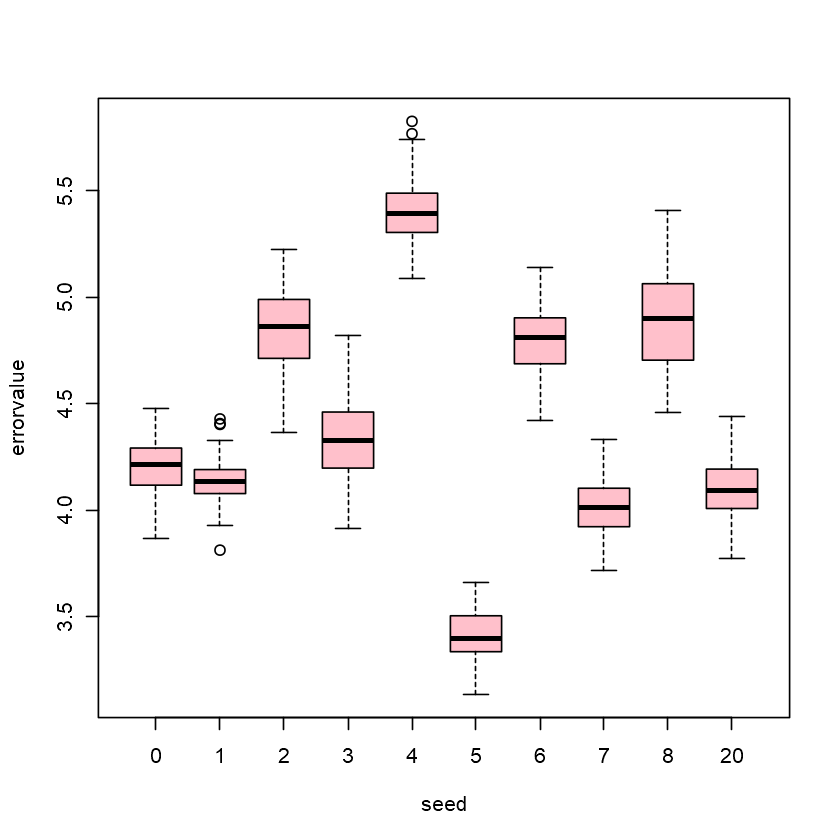

In [164]:
bxp.Ad.1 <-  boxplot( data = performance_molten_Ad.1[errortype == "rmse"], errorvalue  ~ seed, col = "pink")
bxp.Ad.1

In [165]:
performance_table_Ad_rep.1[, .(mean_rmse = mean(rmse)),.(seed)][order(mean_rmse)]

seed,mean_rmse
<dbl>,<dbl>
5,3.411027
7,4.015857
20,4.096519
1,4.132631
0,4.216448
3,4.328317
6,4.795610
2,4.845807
8,4.885793


### Overall BoxPlot

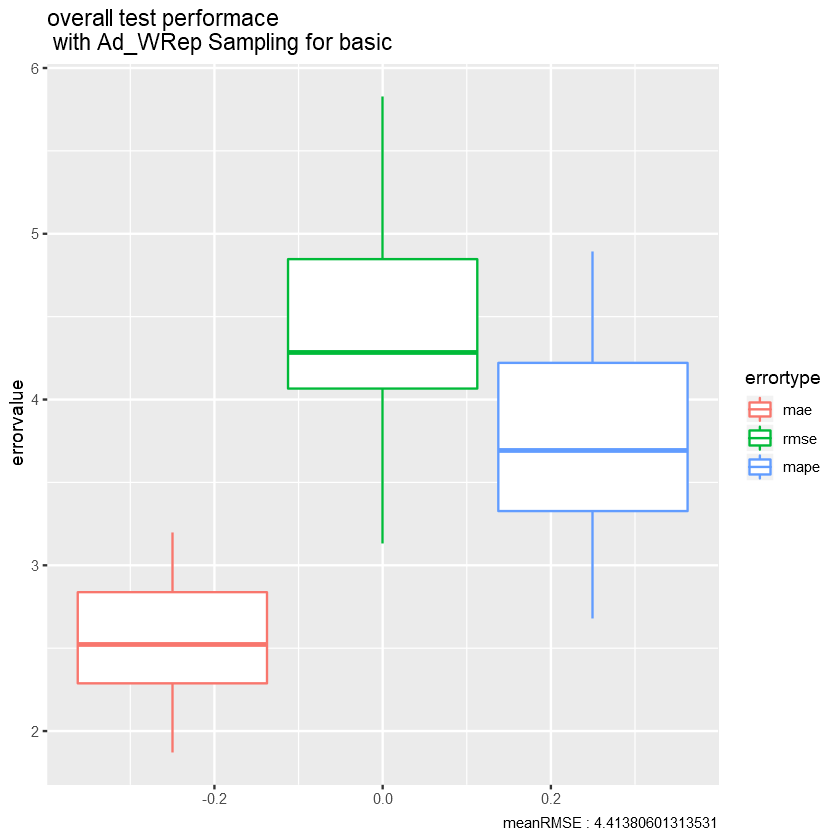

In [166]:
Ad_bxp.1 = ggplot(data = performance_molten_Ad.1, aes(y = errorvalue, group=errortype, col=errortype)) +
                    geom_boxplot(aes(colour = errortype)) +
                   # facet_wrap(~ seed) +
                    labs( caption = paste0("meanRMSE : ",mean(performance_table_Ad_rep.1$rmse))) +
                    ggtitle(paste0("overall test performace","\n"," with Ad_WRep Sampling for ",model.type.1))
                    
Ad_bxp.1

In [167]:
boxplot.stats(performance_table_Ad_rep.1$rmse)

$stats
[1] 3.132901 4.065698 4.283314 4.847073 5.826554

$n
[1] 1000

$conf
[1] 4.244274 4.322355

$out
numeric(0)

## Model.2

In [168]:
#### Model.2 ####
mtry = 2
ntree = 300
predictedLabels_Ad_rep.2 = data.table()
performance_table_Ad_rep.2 = data.table(seed = numeric(), rep = numeric(), new_rep = numeric(), mae = numeric(), 
    rmse = numeric(), mape = numeric())

for (s in seed.Ad.2) {
    for (k in 1:10) {
        trainx.2 = FinalTrainData_Ad.2[seed == s & rep == k, .SD, .SDcols = feature_names.2]
        trainy.2 = FinalTrainData_Ad.2[seed == s & rep == k]$output
        
        test_set.2.retrain = copy(test_set.2)
        
        
        for (r in 1:10) {
            model_Sub.2 <- randomForest(x = trainx.2, y = trainy.2, importance = TRUE, 
                ntree = ntree, mtry = mtry)
            
            predictedLabels.2 <- predict(model_Sub.2, test_set.2.retrain)
            predictedLabels.2 <- cbind(test_set.2.retrain, data.table(pred_output = predictedLabels.2, 
                seed = s, rep = r, new_rep = k))
            
            predictedLabels_Ad_rep.2 <- rbind(predictedLabels_Ad_rep.2, predictedLabels.2)
            
            output_variables = colnames(select(predictedLabels.2, contains("output")))
            output_variables_1 = predictedLabels.2[, get(output_variables[1]), with = TRUE]
            output_variables_2 = predictedLabels.2[, get(output_variables[2]), with = TRUE]
            
            performance_temp = matrix(c(1:3), nrow = 1, ncol = 3)
            performance_temp[1] = mae(output_variables_1, output_variables_2)
            performance_temp[2] = rmse(output_variables_1, output_variables_2)
            performance_temp[3] = mape(output_variables_1, output_variables_2)
            
            performance_table_Ad_rep.2 = rbind(performance_table_Ad_rep.2, data.table(s, 
                r,k, performance_temp), use.names = FALSE)
            
        }
        
        rm(trainx.2, trainy.2)
    }
}

In [169]:
performance_molten_Ad.2 <- melt(data = performance_table_Ad_rep.2
                             , id.vars = c("seed","rep","new_rep"))
setnames(performance_molten_Ad.2, c("variable","value"),c("errortype","errorvalue"))

### Replications on Each Seed

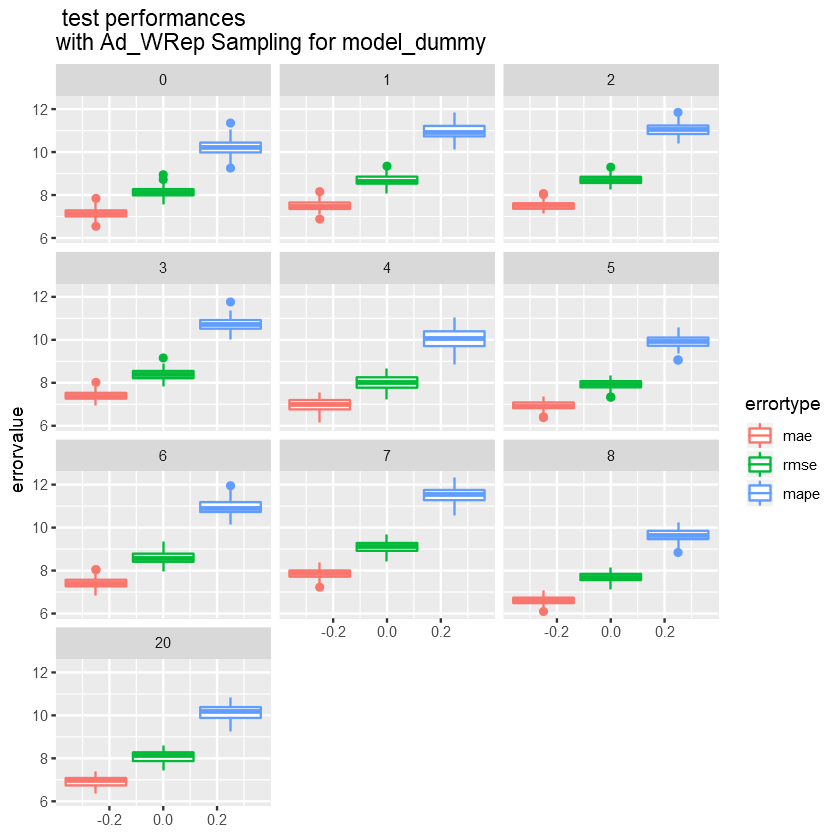

In [170]:
#### Replications on Each Seed ####

Ad_ind_bxp.2 = ggplot(performance_molten_Ad.2, aes(y = errorvalue, group=errortype, col=errortype)) + 
                        geom_boxplot(varwidth = TRUE)+
                        facet_wrap(~seed,ncol=3) +
                        ggtitle(paste0(" test performances","\n","with Ad_WRep Sampling for model_",model.type.2)) 
Ad_ind_bxp.2

7.556344,8.076375,8.243987,7.836890,7.216281,7.502327,7.938125,8.432220,7.140416,7.455889
7.983055,8.531025,8.560881,8.210120,7.769807,7.785532,8.407032,8.917536,7.554628,7.872776
8.112317,8.647406,8.691845,8.373944,8.025990,7.926089,8.562284,9.126592,7.696933,8.115387
8.274230,8.858989,8.848032,8.551744,8.255841,8.076185,8.786903,9.294763,7.843853,8.281212
8.682024,9.346334,9.246571,8.879020,8.673536,8.333593,9.347680,9.697491,8.159303,8.591441
8.066312,8.595587,8.646475,8.319967,7.949197,7.880166,8.502265,9.066990,7.651236,8.050854
8.158323,8.699224,8.737215,8.427921,8.102784,7.972013,8.622304,9.186194,7.742631,8.179920


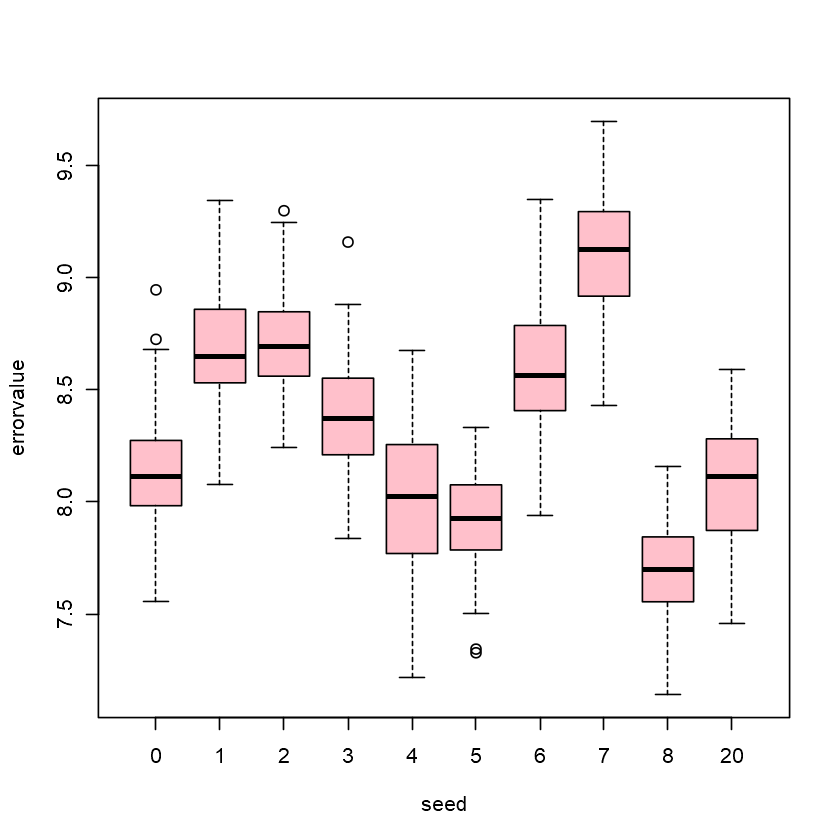

In [171]:
bxp.Ad.2 <-  boxplot( data = performance_molten_Ad.2[errortype == "rmse"], errorvalue  ~ seed, col = "pink")
bxp.Ad.2

In [172]:
performance_table_Ad_rep.2[, .(mean_rmse = mean(rmse)),.(seed)][order(mean_rmse)]

seed,mean_rmse
<dbl>,<dbl>
8,7.683813
5,7.908511
4,8.014256
20,8.093005
0,8.144915
3,8.384887
6,8.595063
1,8.690371
2,8.714778


### Overall BoxPlot

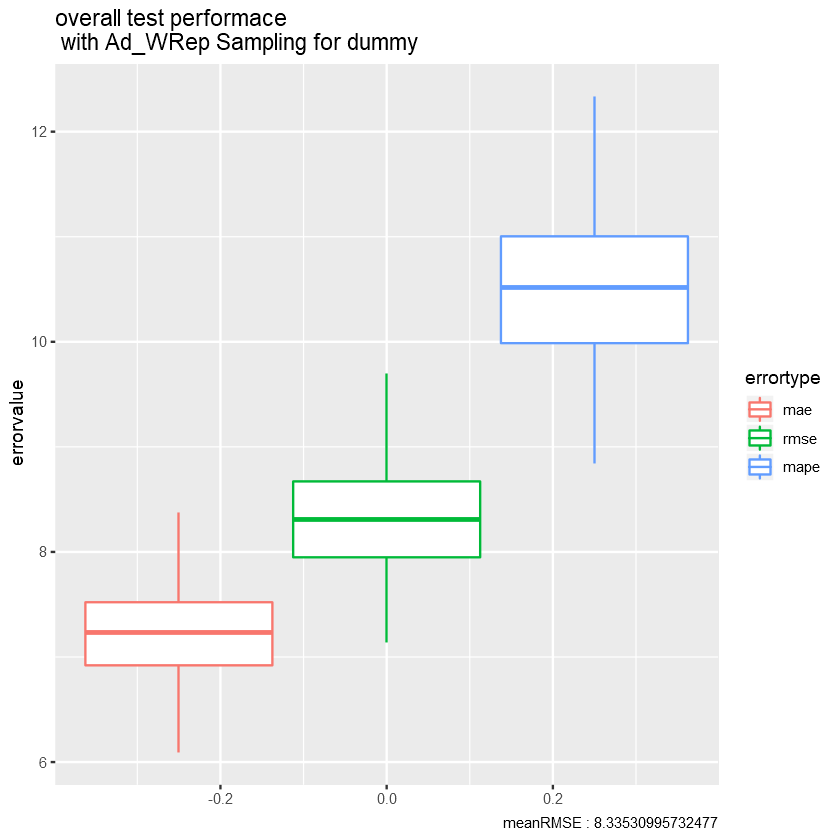

In [173]:
Ad_bxp.2 = ggplot(data = performance_molten_Ad.2, aes(y = errorvalue, group=errortype, col=errortype)) +
                    geom_boxplot(aes(colour = errortype)) +
                   # facet_wrap(~ seed) +
                    labs( caption = paste0("meanRMSE : ",mean(performance_table_Ad_rep.2$rmse))) +
                    ggtitle(paste0("overall test performace","\n"," with Ad_WRep Sampling for ",model.type.2))
                    
Ad_bxp.2

In [174]:
boxplot.stats(performance_table_Ad_rep.2$rmse)

$stats
[1] 7.140416 7.948696 8.304784 8.671497 9.697491

$n
[1] 1000

$conf
[1] 8.268670 8.340898

$out
numeric(0)

# Metamodel Replications On Final Data Ad_range

## Model.1

In [175]:
#### Model.1 ####
mtry = 2
ntree = 300
predictedLabels_Ad_range_rep.1 = data.table()
performance_table_Ad_range_rep.1 = data.table(seed = numeric(), rep = numeric(), new_rep = numeric(), 
    mae = numeric(), rmse = numeric(), mape = numeric())

for (s in seed.Ad.1) {
    for (k in 1:10) {
        trainx.1 = FinalTrainData_Ad_range.1[seed == s & rep == k, .SD, .SDcols = feature_names.1]
        trainy.1 = FinalTrainData_Ad_range.1[seed == s & rep == k]$output
        
        test_set.1.retrain = copy(test_set.1)
        
        
        for (r in 1:10) {
            model_Sub.1 <- randomForest(x = trainx.1, y = trainy.1, importance = TRUE, 
                ntree = ntree, mtry = mtry)
            
            predictedLabels.1 <- predict(model_Sub.1, test_set.1.retrain)
            predictedLabels.1 <- cbind(test_set.1.retrain, data.table(pred_output = predictedLabels.1, 
                seed = s, rep = r, new_rep = k))
            
            predictedLabels_Ad_range_rep.1 <- rbind(predictedLabels_Ad_range_rep.1, 
                predictedLabels.1)
            
            output_variables = colnames(select(predictedLabels.1, contains("output")))
            output_variables_1 = predictedLabels.1[, get(output_variables[1]), with = TRUE]
            output_variables_2 = predictedLabels.1[, get(output_variables[2]), with = TRUE]
            
            performance_temp = matrix(c(1:3), nrow = 1, ncol = 3)
            performance_temp[1] = mae(output_variables_1, output_variables_2)
            performance_temp[2] = rmse(output_variables_1, output_variables_2)
            performance_temp[3] = mape(output_variables_1, output_variables_2)
            
            performance_table_Ad_range_rep.1 = rbind(performance_table_Ad_range_rep.1, 
                data.table(s, r,k, performance_temp), use.names = FALSE)
            
        }
        
        rm(trainx.1, trainy.1)
    }
}

In [176]:
performance_molten_Ad_range.1 <- melt(data = performance_table_Ad_range_rep.1
                             , id.vars = c("seed","rep","new_rep"))
setnames(performance_molten_Ad_range.1, c("variable","value"),c("errortype","errorvalue"))

### Replications on Each Seed

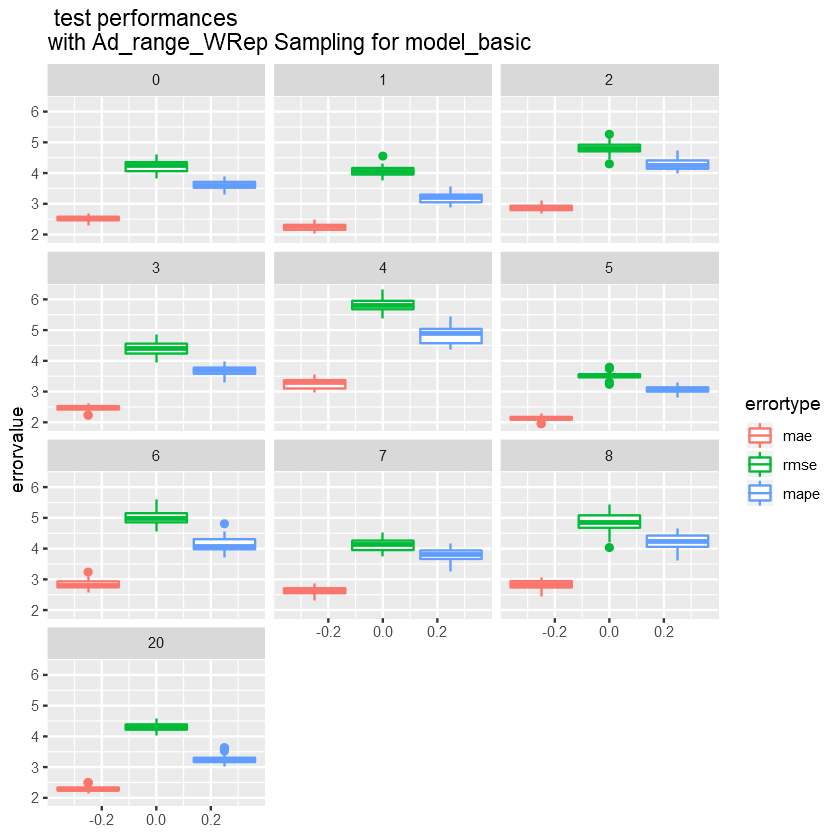

In [177]:
#### Replications on Each Seed ####

Ad_range_ind_bxp.1 = ggplot(performance_molten_Ad_range.1, aes(y = errorvalue, group=errortype, col=errortype)) + 
                        geom_boxplot(varwidth = TRUE)+
                        facet_wrap(~seed,ncol=3) +
                        ggtitle(paste0(" test performances","\n","with Ad_range_WRep Sampling for model_",model.type.1)) 
Ad_range_ind_bxp.1

3.818393,3.748928,4.438763,3.949606,5.393888,3.306574,4.551293,3.741518,4.202342,4.021757
4.061221,3.949930,4.701456,4.236607,5.677457,3.461819,4.852412,3.949074,4.677409,4.217174
4.240444,4.043773,4.802299,4.408914,5.814022,3.509586,4.994855,4.121847,4.844276,4.304086
4.355827,4.164641,4.927819,4.561379,5.955690,3.567106,5.158263,4.261608,5.084517,4.391036
4.611920,4.327359,5.264963,4.862968,6.313521,3.707711,5.597079,4.528940,5.421337,4.579706
4.193896,4.009849,4.766534,4.357600,5.770061,3.492951,4.946530,4.072466,4.779953,4.276615
4.286992,4.077698,4.838065,4.460228,5.857983,3.526222,5.043179,4.171227,4.908599,4.331556


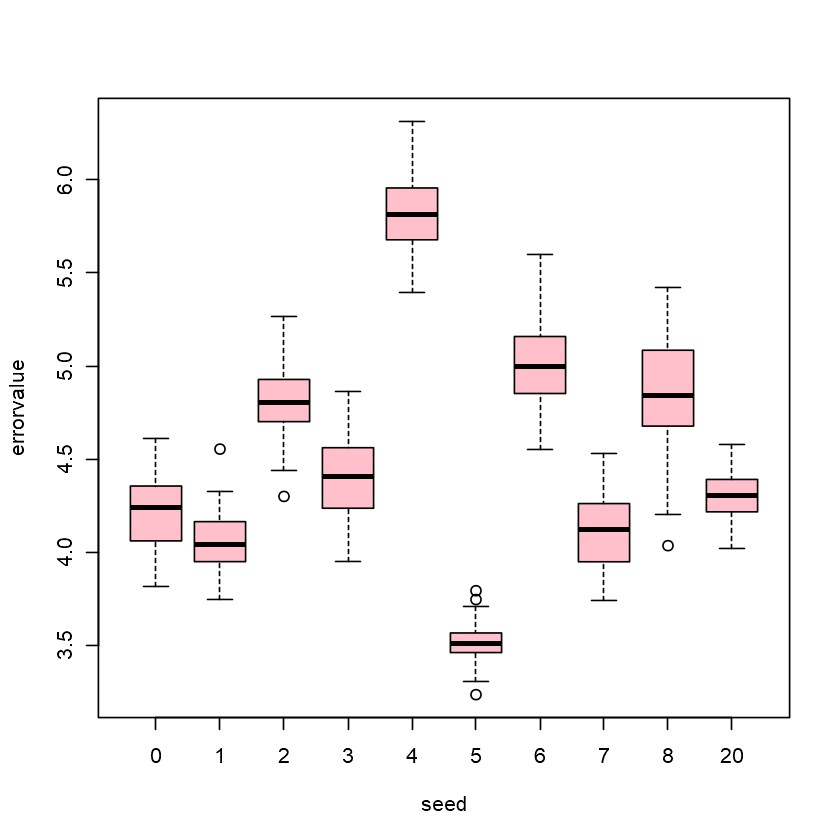

In [178]:
bxp.Ad_range.1 <-  boxplot( data = performance_molten_Ad_range.1[errortype == "rmse"], errorvalue  ~ seed, col = "pink")
bxp.Ad_range.1

In [179]:
performance_table_Ad_range_rep.1[, .(mean_rmse = mean(rmse)),.(seed)][order(mean_rmse)]

seed,mean_rmse
<dbl>,<dbl>
5,3.510689
1,4.058241
7,4.109687
0,4.223673
20,4.306827
3,4.397412
2,4.809019
8,4.850239
6,5.014807


### Overall BoxPlot

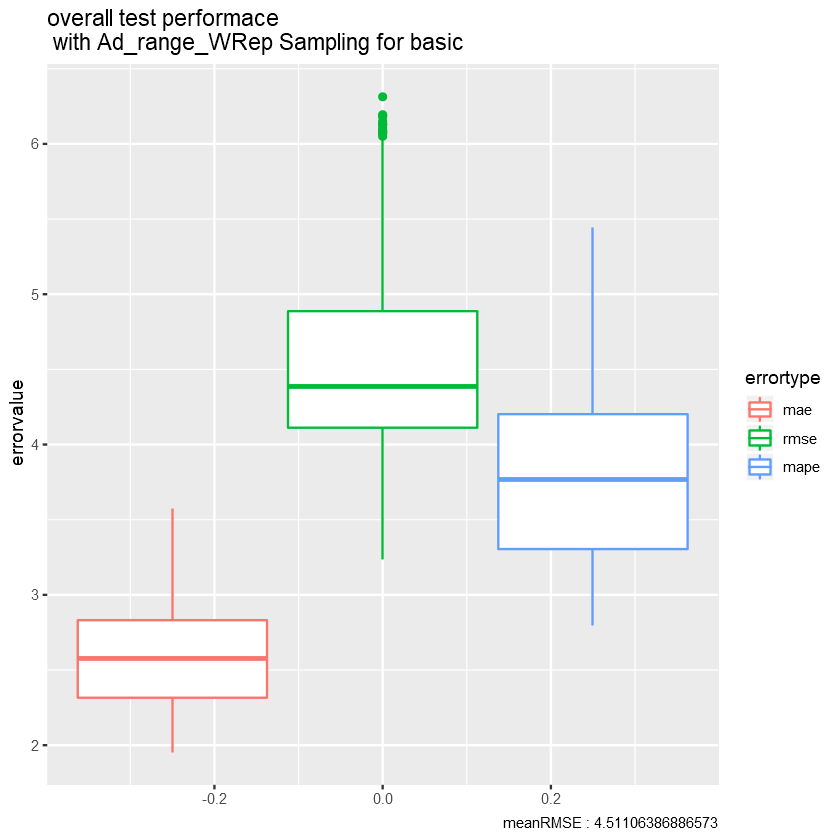

In [180]:
Ad_range_bxp.1 = ggplot(data = performance_molten_Ad_range.1, aes(y = errorvalue, group=errortype, col=errortype)) +
                    geom_boxplot(aes(colour = errortype)) +
                   # facet_wrap(~ seed) +
                    labs( caption = paste0("meanRMSE : ",mean(performance_table_Ad_range_rep.1$rmse))) +
                    ggtitle(paste0("overall test performace","\n"," with Ad_range_WRep Sampling for ",model.type.1))
                    
Ad_range_bxp.1

In [181]:
boxplot.stats(performance_table_Ad_range_rep.1$rmse)

$stats
[1] 3.236020 4.111196 4.387082 4.887265 6.050649

$n
[1] 1000

$conf
[1] 4.348307 4.425858

$out
 [1] 6.194199 6.069470 6.128303 6.150498 6.187041 6.135884 6.313521 6.071405
 [9] 6.124669 6.077893 6.181817 6.085479 6.088061 6.104371

## Model.2

In [182]:
#### Model.2 ####
mtry = 2
ntree = 300
predictedLabels_Ad_range_rep.2 = data.table()
performance_table_Ad_range_rep.2 = data.table(seed = numeric(), rep = numeric(), new_rep = numeric(), 
    mae = numeric(), rmse = numeric(), mape = numeric())

for (s in seed.Ad.2) {
    for (k in 1:10) {
        trainx.2 = FinalTrainData_Ad_range.2[seed == s & rep == k, .SD, .SDcols = feature_names.2]
        trainy.2 = FinalTrainData_Ad_range.2[seed == s & rep == k]$output
        
        test_set.2.retrain = copy(test_set.2)
        
        
        for (r in 1:10) {
            model_Sub.2 <- randomForest(x = trainx.2, y = trainy.2, importance = TRUE, 
                ntree = ntree, mtry = mtry)
            
            predictedLabels.2 <- predict(model_Sub.2, test_set.2.retrain)
            predictedLabels.2 <- cbind(test_set.2.retrain, data.table(pred_output = predictedLabels.2, 
                seed = s, rep = r, new_rep = k))
            
            predictedLabels_Ad_range_rep.2 <- rbind(predictedLabels_Ad_range_rep.2, 
                predictedLabels.2)
            
            output_variables = colnames(select(predictedLabels.2, contains("output")))
            output_variables_1 = predictedLabels.2[, get(output_variables[1]), with = TRUE]
            output_variables_2 = predictedLabels.2[, get(output_variables[2]), with = TRUE]
            
            performance_temp = matrix(c(1:3), nrow = 1, ncol = 3)
            performance_temp[1] = mae(output_variables_1, output_variables_2)
            performance_temp[2] = rmse(output_variables_1, output_variables_2)
            performance_temp[3] = mape(output_variables_1, output_variables_2)
            
            performance_table_Ad_range_rep.2 = rbind(performance_table_Ad_range_rep.2, 
                data.table(s,r,k,performance_temp), use.names = FALSE)
            
        }
        
        rm(trainx.2, trainy.2)
    }
}

In [183]:
performance_molten_Ad_range.2 <- melt(data = performance_table_Ad_range_rep.2
                             , id.vars = c("seed","rep","new_rep"))
setnames(performance_molten_Ad_range.2, c("variable","value"),c("errortype","errorvalue"))

### Replications on Each Seed

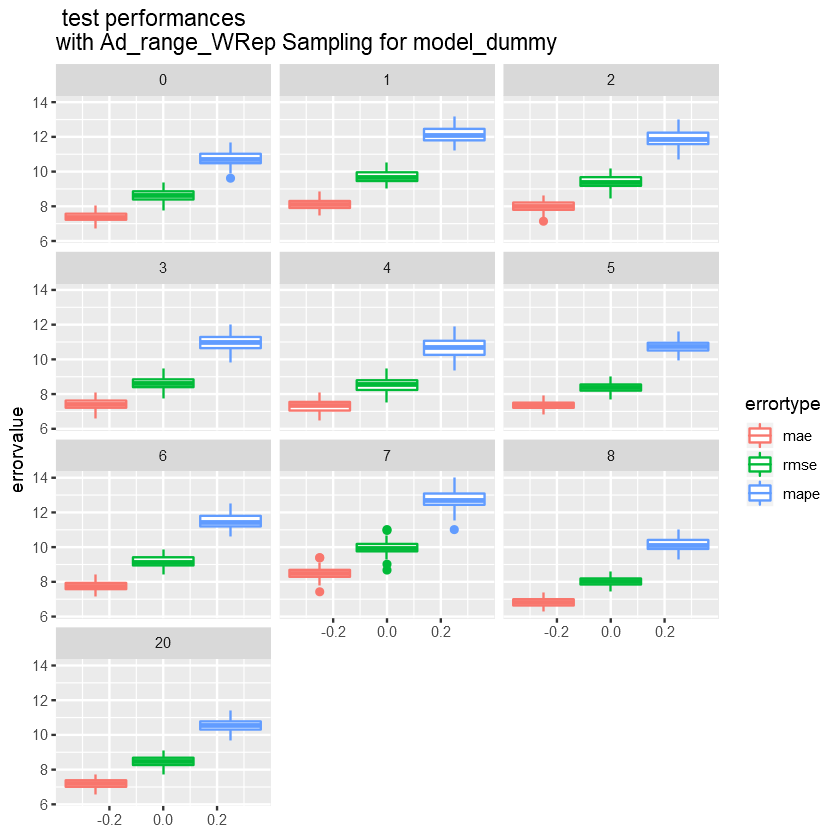

In [184]:
#### Replications on Each Seed ####

Ad_range_ind_bxp.2 = ggplot(performance_molten_Ad_range.2, aes(y = errorvalue, group=errortype, col=errortype)) + 
                        geom_boxplot(varwidth = TRUE)+
                        facet_wrap(~seed,ncol=3) +
                        ggtitle(paste0(" test performances","\n","with Ad_range_WRep Sampling for model_",model.type.2)) 
Ad_range_ind_bxp.2

7.764047,9.023495,8.469950,7.754820,7.517488,7.702881,8.408855,9.272073,7.453709,7.724917
8.393300,9.455171,9.179900,8.398871,8.232924,8.192909,8.947572,9.754654,7.843284,8.263263
8.611123,9.651954,9.369493,8.584200,8.559466,8.382192,9.134597,9.926394,8.008369,8.492758
8.864564,9.963729,9.687413,8.850349,8.801827,8.554639,9.418718,10.185721,8.198754,8.687359
9.358580,10.498980,10.190391,9.457128,9.457212,9.018648,9.864582,10.666343,8.626692,9.101653
8.536663,9.571602,9.289306,8.512866,8.469579,8.325038,9.060156,9.858285,7.952205,8.425751
8.685583,9.732306,9.449680,8.655533,8.649352,8.439345,9.209038,9.994502,8.064534,8.559765


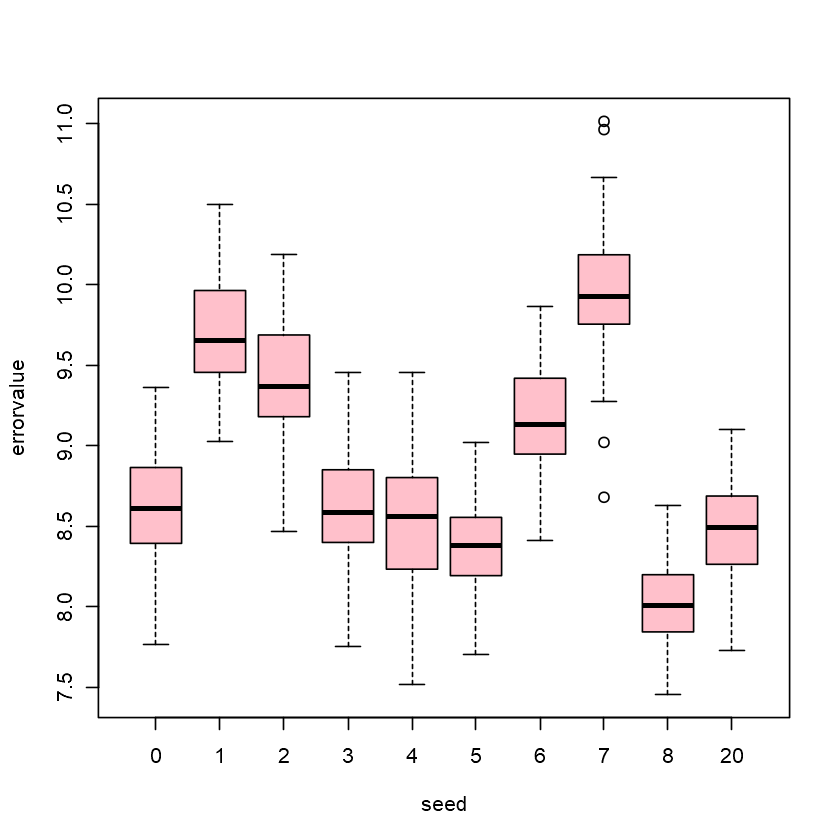

In [185]:
bxp.Ad_range.2 <-  boxplot( data = performance_molten_Ad_range.2[errortype == "rmse"], errorvalue  ~ seed, col = "pink")
bxp.Ad_range.2

In [186]:
performance_table_Ad_range_rep.2[, .(mean_rmse = mean(rmse)),.(seed)][order(mean_rmse)]

seed,mean_rmse
<dbl>,<dbl>
8,8.036103
5,8.377743
20,8.479383
4,8.553044
0,8.625354
3,8.633567
6,9.170476
2,9.419766
1,9.711648


### Overall BoxPlot

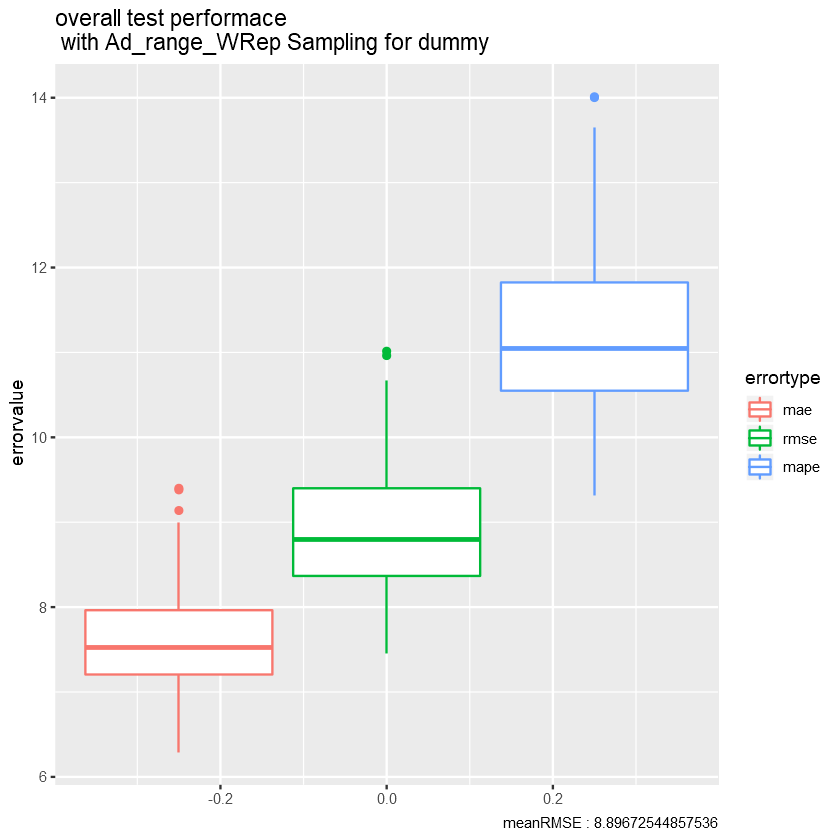

In [187]:
Ad_range_bxp.2 = ggplot(data = performance_molten_Ad_range.2, aes(y = errorvalue, group=errortype, col=errortype)) +
                    geom_boxplot(aes(colour = errortype)) +
                   # facet_wrap(~ seed) +
                    labs( caption = paste0("meanRMSE : ",mean(performance_table_Ad_range_rep.2$rmse))) +
                    ggtitle(paste0("overall test performace","\n"," with Ad_range_WRep Sampling for ",model.type.2))
                    
Ad_range_bxp.2

In [188]:
boxplot.stats(performance_table_Ad_range_rep.2$rmse)

$stats
[1]  7.453709  8.367424  8.793539  9.400243 10.666343

$n
[1] 1000

$conf
[1] 8.741935 8.845142

$out
[1] 10.96303 11.01454

# 4 Scenarios_Part 2 

Results shown here includes:
* Rd,Ad,Ad_range samplings' boxplots --> 1000 data points
* oneshot's boxplot --> 100 data points

## Model.1

In [191]:
head(performance_molten_Rd.1)

seed,rep,new_rep,errortype,errorvalue
<dbl>,<dbl>,<dbl>,<fct>,<dbl>
0,1,1,mae,2.738111
0,2,1,mae,2.846628
0,3,1,mae,2.807172
0,4,1,mae,2.755153
0,5,1,mae,2.757226
0,6,1,mae,2.726611


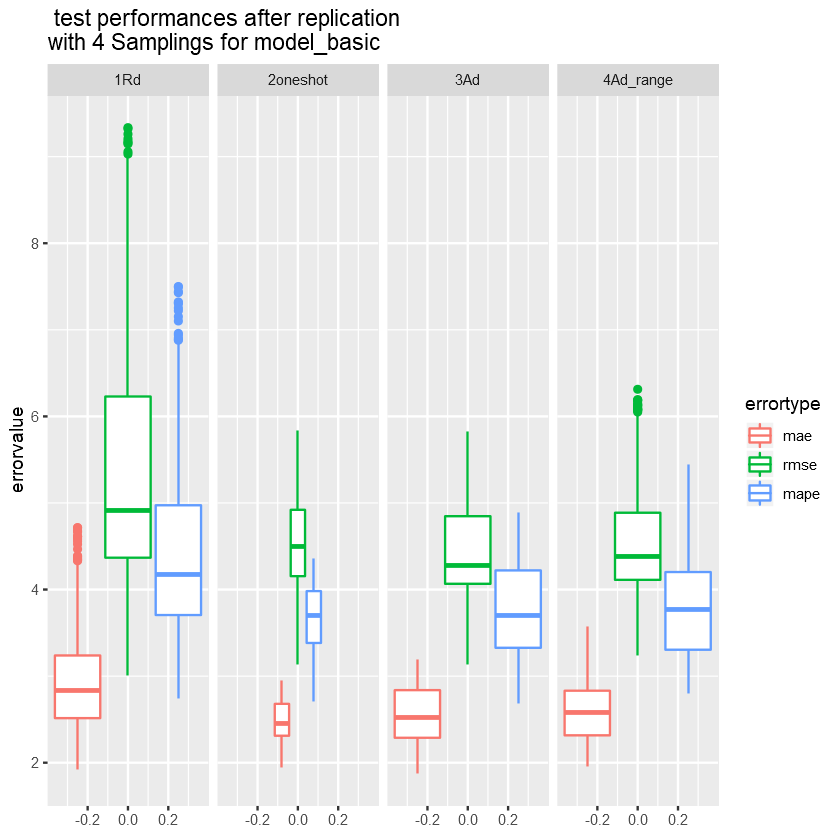

In [196]:
all_rep_ind_bxp.1 = ggplot(rbind( data.table(performance_molten_Ad_range.1[,.(errortype,errorvalue)], sampling = "4Ad_range")
                                 ,data.table(performance_molten_Ad.1[,.(errortype,errorvalue)], sampling = "3Ad")
                                 ,data.table(performance_molten_Rd.1[,.(errortype,errorvalue)], sampling = "1Rd")
                                 ,data.table(performance_molten_oneshot.1[,.(errortype,errorvalue)], sampling = "2oneshot"))    
                           , aes(y = errorvalue, group=errortype, col=errortype)) + 
                        geom_boxplot(varwidth = TRUE)+
                        facet_grid(~sampling) +
                        ggtitle(paste0(" test performances after replication","\n","with 4 Samplings for model_",model.type.1)) 
all_rep_ind_bxp.1

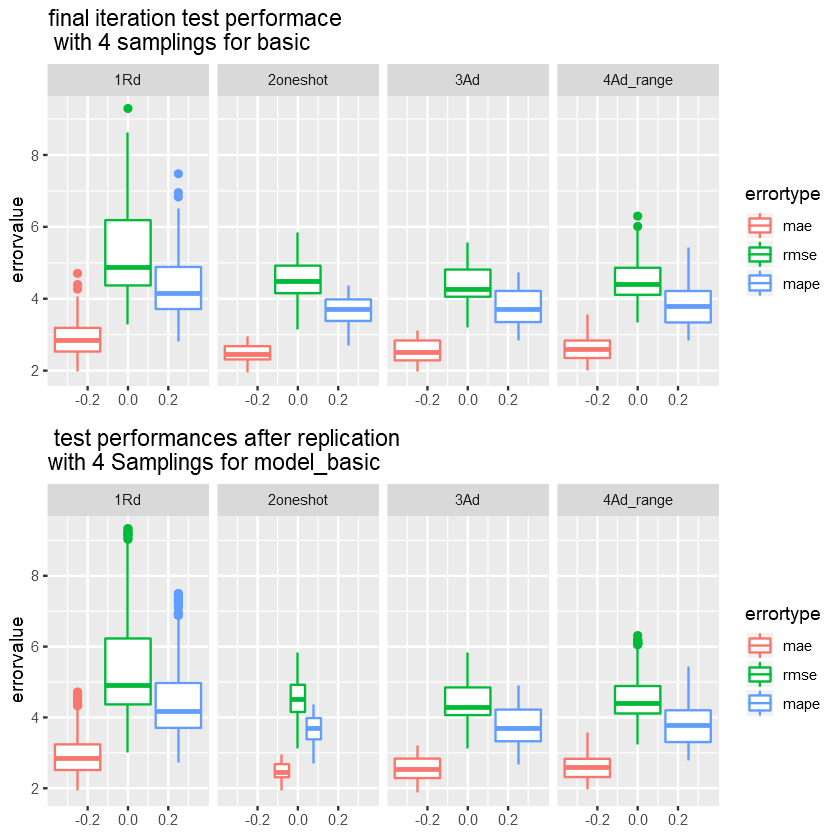

In [197]:
grid.arrange(all_range_bxp.1,all_rep_ind_bxp.1)

## Model.2

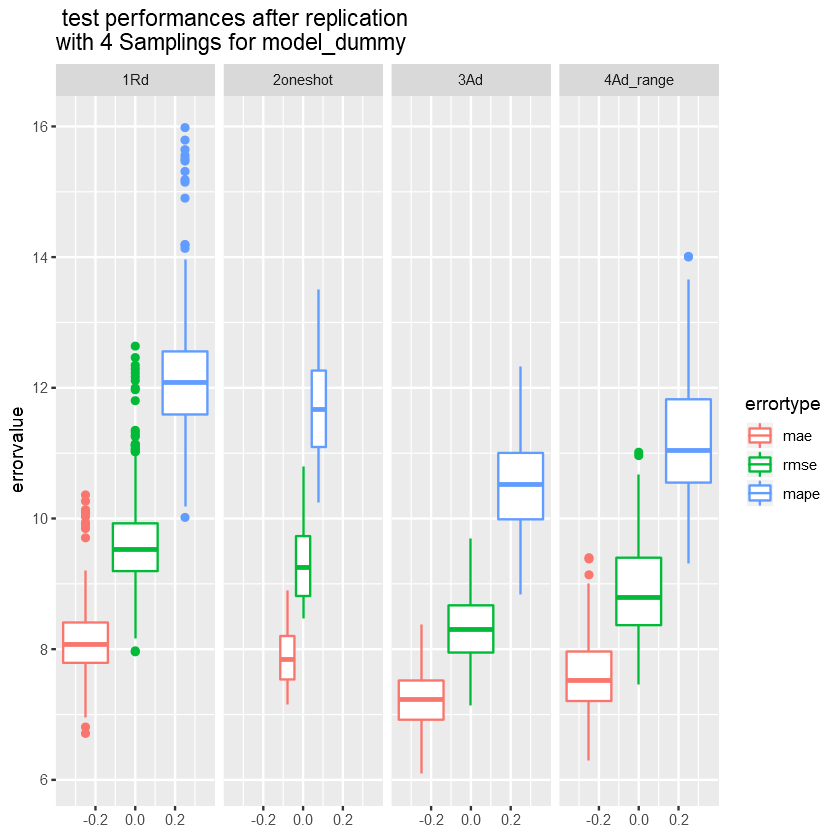

In [198]:
all_rep_ind_bxp.2 = ggplot(rbind( data.table(performance_molten_Ad_range.2[,.(errortype,errorvalue)], sampling = "4Ad_range")
                                ,data.table(performance_molten_Ad.2[,.(errortype,errorvalue)], sampling = "3Ad")
                                 ,data.table(performance_molten_Rd.2[,.(errortype,errorvalue)], sampling = "1Rd")
                                 ,data.table(performance_molten_oneshot.2[,.(errortype,errorvalue)], sampling = "2oneshot"))    
                           , aes(y = errorvalue, group=errortype, col=errortype)) + 
                        geom_boxplot(varwidth = TRUE)+
                        facet_grid(~sampling) +
                        ggtitle(paste0(" test performances after replication","\n","with 4 Samplings for model_",model.type.2)) 
all_rep_ind_bxp.2

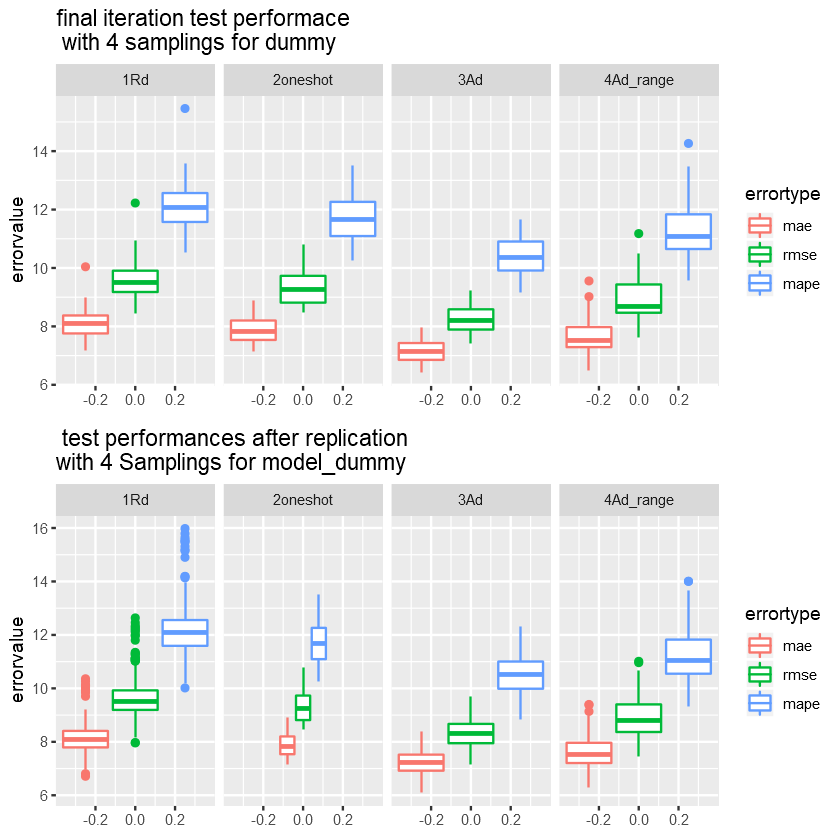

In [199]:
grid.arrange(all_range_bxp.2,all_rep_ind_bxp.2)